In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import pylab
#%matplotlib qt
%matplotlib inline

didt found corners in {} calibration1.jpg
didt found corners in {} calibration4.jpg
didt found corners in {} calibration5.jpg


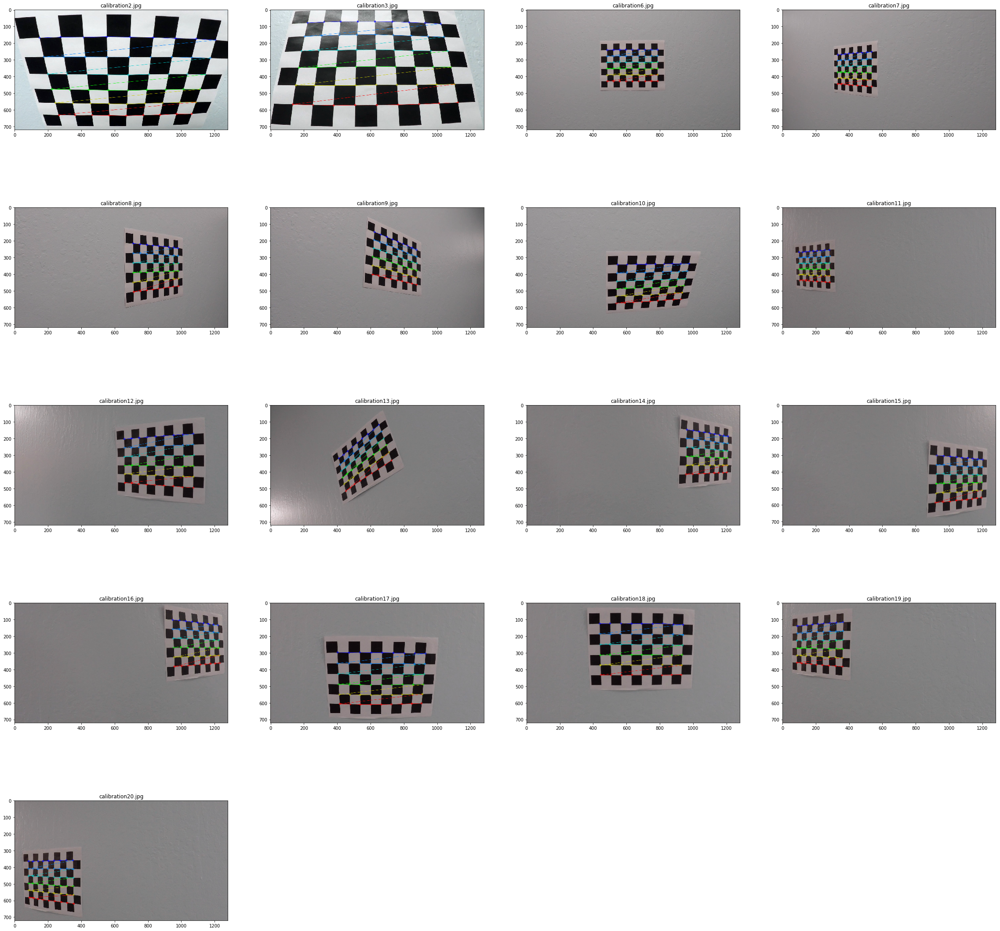

In [34]:
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

objpoints = [] 
imgpoints = []


images = []
for i in range(20):
    images.append('./camera_cal/calibration{}.jpg'.format(i+1))
    
plt.figure(1,figsize=(40,40))
i =1
for image in images:
    img = cv2.imread(image)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)
    
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        
        ing = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        plt.subplot(5,4, i)
        plt.title(image.split('/')[-1])
        i = i+1
        plt.imshow(img)
        
    else:
        print('did''t found corners in {}',format(image.split('/')[-1]))

In [35]:
#########################################################################################################
###Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.###
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

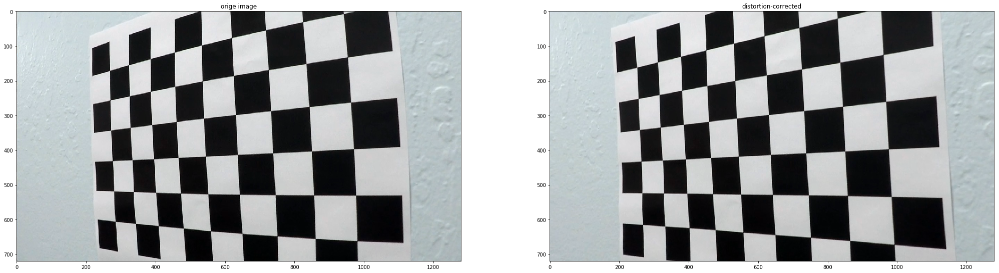

In [49]:
##################################################
###Apply a distortion correction to raw images###

plt.figure(1,figsize=(35,60))
exp_image = cv2.imread(images[3])
plt.subplot(1,2,1)
plt.title('orige image')
plt.imshow(exp_image)
undist = cv2.undistort(exp_image, mtx, dist, None, mtx)
plt.subplot(1,2,2)
plt.title('distortion-corrected')
plt.imshow(undist)


In [93]:
def region_of_interest(img, vertices = []):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    imgshape = np.shape(img)
    if not vertices:
        vertices = np.array([[(np.int(imgshape[1]*0.08), imgshape[0]-20),
                             (np.int(imgshape[1]*0.92), imgshape[0]-20),
                             (np.int(imgshape[1]*0.55), np.int(imgshape[0]*0.6)),
                             (np.int(imgshape[1]*0.45), np.int(imgshape[0]*0.6))]],
                        dtype=np.int32)
    #defining a blank mask to start with
    mask = np.zeros_like(img)
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    print(img.shape)
    if len(img.shape) > 2:
        channel_count = img.shape[2]
        ignore_mask_color = (255,255,255) 
    else:
        ignore_mask_color = 255
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero    
    mask_image = cv2.bitwise_and(mask,img)
    #mask_image = mask
    return mask_image
    

(720, 1280, 3)


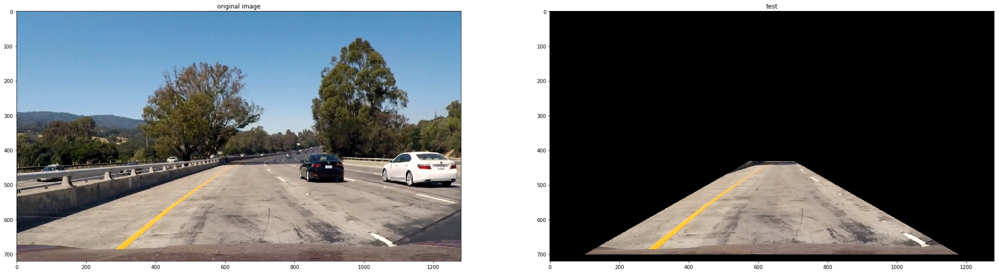

In [94]:
example_image = plt.imread("test_images/test1.jpg")
plt.figure(1,figsize=(35,60))
plt.subplot(1,2,1)
plt.title('original image')
plt.imshow(example_image)
test = region_of_interest(example_image)
plt.subplot(1,2,2)
plt.title('test')
plt.imshow(test)

In [97]:
###################
###Sobel Thresh###
def abs_sobel_thresh(gray, orient='x', sobel_kernel=3, thresh=(0, 255), fill=False):
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    elif orient == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    else:
        print("only 'x' or 'y' can be orient argument.")
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    grad_binary = np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    if fill:
        grad_binary = fill_contours(grad_binary)
    return grad_binary

def mag_thresh(gray, sobel_kernel=3, mag_thresh=(0, 255), fill=False):
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude 
    abs_sobel = np.sqrt(np.square(sobelx) + np.square(sobely))
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a binary mask where mag thresholds are met
    mag_binary = np.zeros_like(scaled_sobel)
    mag_binary[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    if fill:
        mag_binary = fill_contours(mag_binary)
    return mag_binary

def dir_threshold(gray, sobel_kernel=3, thresh=(0, np.pi/2)):
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    absgraddir = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    dir_binary =  np.zeros_like(absgraddir)
    dir_binary[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    return dir_binary

def sobel_thresh(img, debug=0):
    #gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)[:,:,2]
    ksize = 5 
    gradx = abs_sobel_thresh(gray, orient='x', sobel_kernel=ksize, thresh=(20, 100), fill=False)
    grady = abs_sobel_thresh(gray, orient='y', sobel_kernel=ksize, thresh=(20, 100), fill=False)
    mag_binary = mag_thresh(gray, sobel_kernel=ksize, mag_thresh=(20, 100), fill=False)
    dir_binary = dir_threshold(gray, sobel_kernel=ksize, thresh=(0.6, 1.3))
    if debug:
        f, (ax1, ax2) = plt.subplots(2, 2, figsize=(24, 18))
        f.tight_layout()
        ax1[0].imshow(gradx, cmap='gray')
        ax1[0].set_title('gradx', fontsize=50)
        ax1[1].imshow(grady, cmap='gray')
        ax1[1].set_title('grady', fontsize=50)
        ax2[0].imshow(mag_binary, cmap='gray')
        ax2[0].set_title('mag_binary', fontsize=50)
        ax2[1].imshow(dir_binary, cmap='gray')
        ax2[1].set_title('dir_binary', fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

    combined = np.zeros_like(dir_binary)
    combined[(gradx == 1) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    return combined

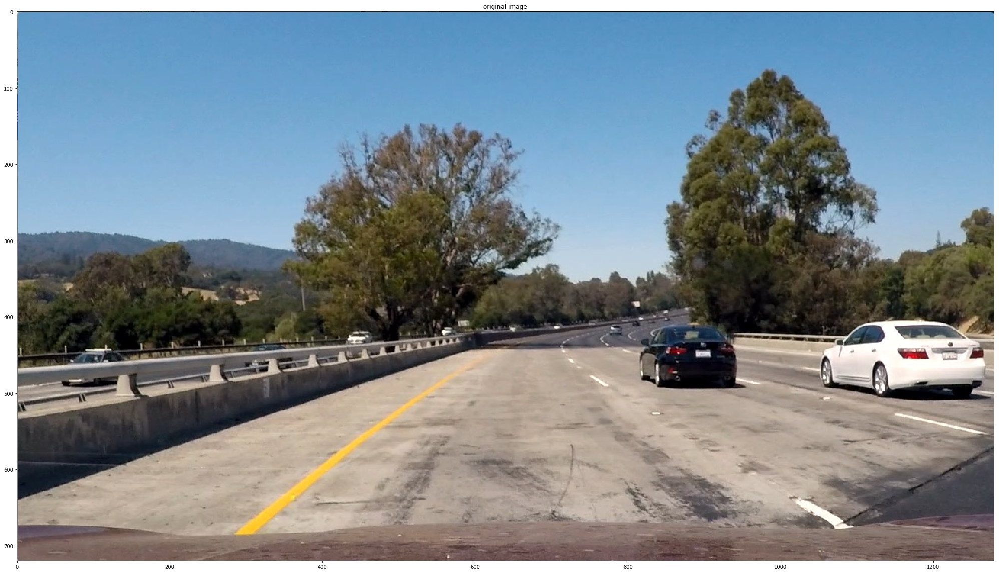

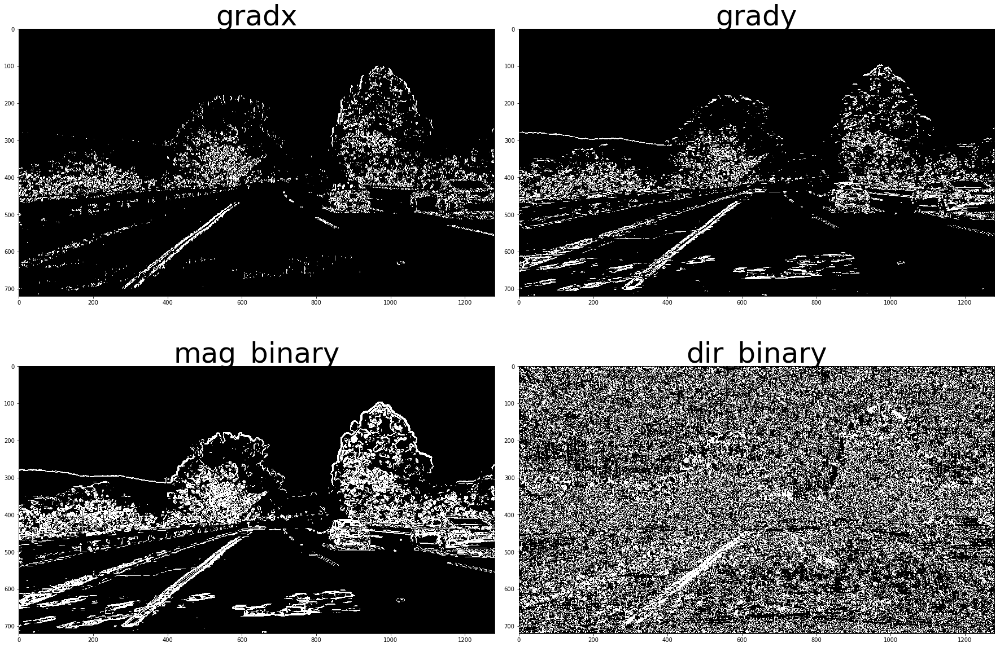

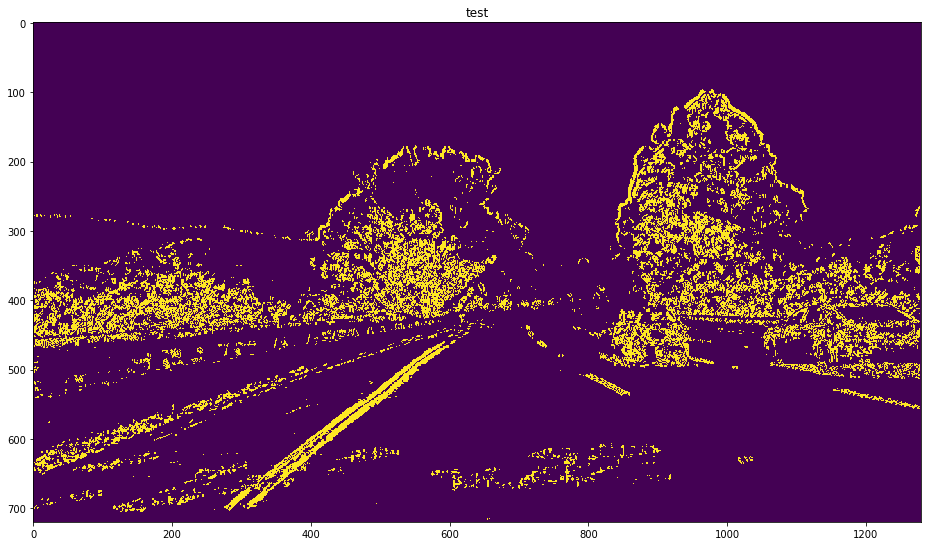

In [98]:
image = cv2.imread("test_images/test4.jpg")
img = cv2.undistort(image, mtx, dist, None, mtx)
plt.figure(1,figsize=(35,60))
#plt.subplot(321)
plt.title('original image')
plt.imshow(example_image)
sobel_binary = sobel_thresh(img,debug = True)
# plt.imsave("test_images/undist.jpg",undist)
plt.figure(6,figsize=(35,60))
plt.subplot(426)

plt.title('test')
plt.imshow(sobel_binary)

In [99]:
###################
###Color Thresh###

def hls_s(img, thresh=(0, 255), fill=False):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    S = hls[:,:,2]
#     plt.imshow(S, cmap='gray')
    # 2) Apply a threshold to the S channel
    color_thresh = np.zeros_like(S)
    color_thresh[(S > thresh[0]) & (S <= thresh[1])] = 1
    # 3) Return a binary image of threshold result
    if fill:
        color_thresh = fill_contours(color_thresh)
    return color_thresh

def hls_h(img, thresh=(20, 40), fill=False):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    H = hls[:,:,0]
    # 2) Apply a threshold to the S channel
    color_thresh = np.zeros_like(H)
    color_thresh[(H > thresh[0]) & (H <= thresh[1])] = 1
    # 3) Return a binary image of threshold result
    if fill:
        color_thresh = fill_contours(color_thresh)
    return color_thresh

def hls_l(img, thresh=(0, 20), fill=False):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    L = hls[:,:,1]
    # 2) Apply a threshold to the S channel
    color_thresh = np.zeros_like(L)
    color_thresh[(L > thresh[0]) & (L <= thresh[1])] = 1
    # 3) Return a binary image of threshold result
    if fill:
        color_thresh = fill_contours(color_thresh)
    return color_thresh

def hsv_s(img, thresh=(0, 10), fill=False):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    S = hsv[:,:,1]
    color_thresh = np.zeros_like(S)
    color_thresh[(S > thresh[0]) & (S <= thresh[1])] = 1
    if fill:
        color_thresh = fill_contours(color_thresh)
    return color_thresh

def hsv_h(img, thresh=(0, 10), fill=False):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    H = hsv[:,:,0]
    color_thresh = np.zeros_like(H)
    color_thresh[(H > thresh[0]) & (H <= thresh[1])] = 1
    if fill:
        color_thresh = fill_contours(color_thresh)
    return color_thresh

def color_thresh(img, debug=0, fill=False):
    s_hls = hls_s(img, thresh=(95, 255), fill=False)
    h_hls = hls_h(img, thresh=(15, 50), fill=False)
    s_hsv = hsv_s(img, thresh=(100, 255), fill=False)
    l_hls = hls_l(img, thresh=(220, 255), fill=False) # (220,255) works fine
    h_hsv = hsv_h(img, thresh=(15,60), fill=False)
    combined = np.zeros_like(s_hls)
    combined[(s_hls == 1) & (h_hls == 1)] = 1
    if fill:
        combined = fill_contours(combined)
    combined[(combined==1)|(l_hls==1)]=1
#     combined[(s_hls == 1) & (h_hls == 1) | (l_hls == 1)] = 1
    if debug:
        f, ax = plt.subplots(2, 2, figsize=(24, 18))
        f.tight_layout()
        ax[0,0].imshow(s_hls, cmap='gray')
        ax[0,0].set_title('hls_s', fontsize=50)
        ax[0,1].imshow(s_hsv, cmap='gray')
        ax[0,1].set_title('hsv_s', fontsize=50)
        ax[1,0].imshow(h_hls, cmap='gray')
        ax[1,0].set_title('hls_h', fontsize=50)
        ax[1,1].imshow(l_hls, cmap='gray')
        ax[1,1].set_title('hls_l', fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    return combined

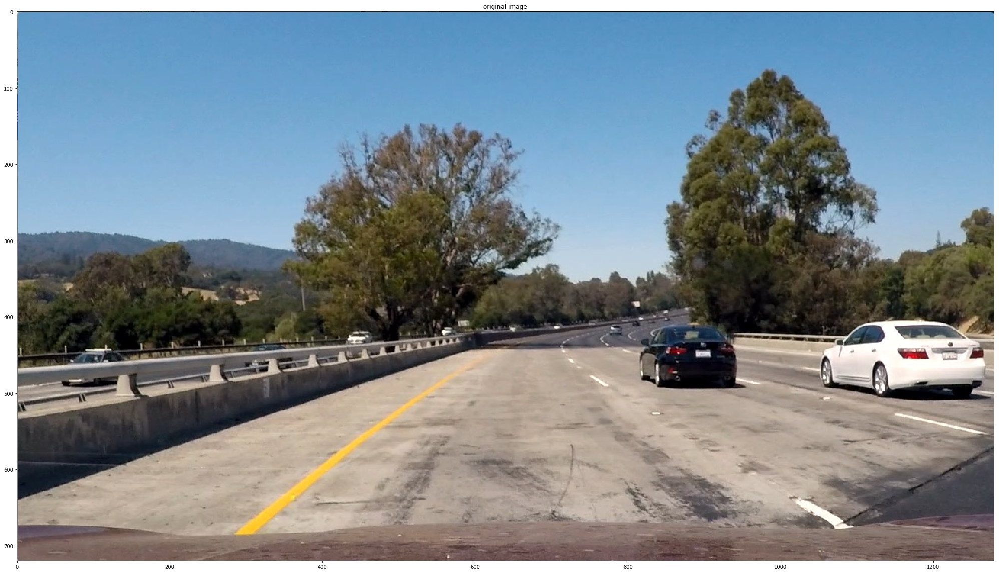

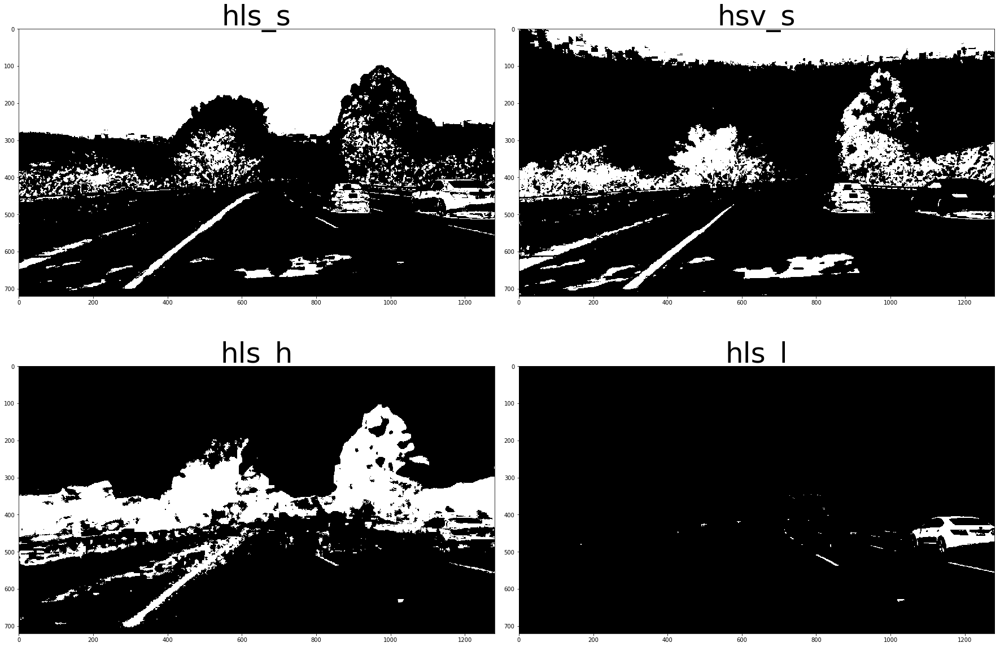

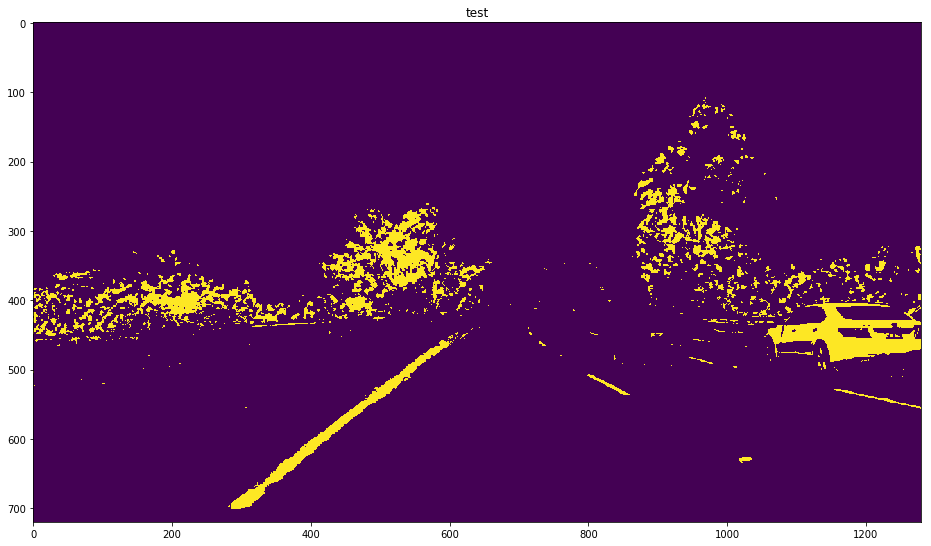

In [100]:
image = cv2.imread("test_images/test4.jpg")
img = cv2.undistort(image, mtx, dist, None, mtx)
plt.figure(1,figsize=(35,60))
#plt.subplot(321)
plt.title('original image')
plt.imshow(example_image)
color_binary = color_thresh(img,debug = True)
# plt.imsave("test_images/undist.jpg",undist)
plt.figure(6,figsize=(35,60))
plt.subplot(426)

plt.title('test')
plt.imshow(color_binary)

In [101]:
def combine_color_grad(img, debug=False):
    sobel_binary = sobel_thresh(img, debug=debug)
    color_binary = color_thresh(img, debug=debug)
    combined = np.zeros_like(sobel_binary)
    combined[(color_binary == 1)] = 1
    return combined

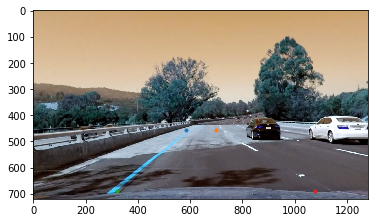

In [110]:
image = cv2.imread("test_images/test4.jpg")
img = cv2.undistort(image, mtx, dist, None, mtx)
plt.imshow(img)
plt.plot(586,455,'.')
plt.plot(699,455,'.')
plt.plot(320,691,'.')
plt.plot(1076,691,'.')
#src = np.float32([[586, 455],[699, 455],[250,691],[1076,691]])
    #des = np.float32([[449.5, 200],[852.5, 200],[449.5,720],[852.5,720]])

In [113]:
def find_matrix():
    src = np.float32([[586, 455],[699, 455],[320,691],[1076,691]])
    des = np.float32([[449.5, 200],[852.5, 200],[449.5,720],[852.5,720]])
    M = cv2.getPerspectiveTransform(src, des)
    Minv = cv2.getPerspectiveTransform(des, src)
    return M, Minv

def birds_eye(undist, M, debug=False):
    img_size = (undist.shape[1], undist.shape[0])
    warped = cv2.warpPerspective(undist, M, (1280,720))
#     warped[warped.nonzero()] = 1
#     warped = np.uint8(warped)
    if debug:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(undist, cmap='gray')
#         ax1.imshow(undist)
        ax1.set_title('image send to bird_eye', fontsize=50)
        ax2.imshow(warped, cmap='gray')
#         ax2.imshow(warped)
        ax2.set_title('birds eye view', fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    return warped

(720, 1280)


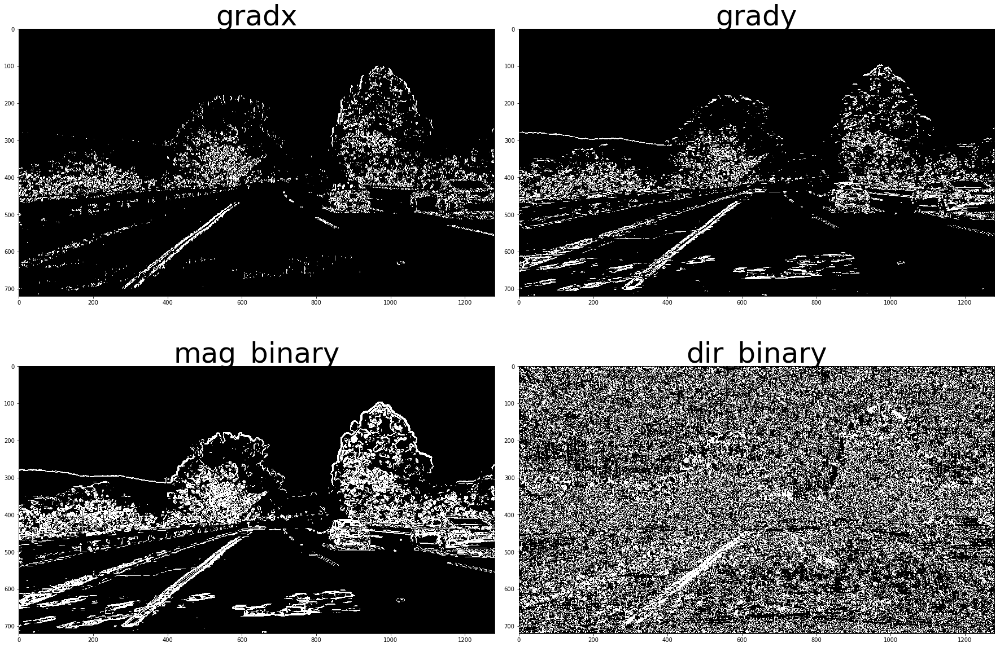

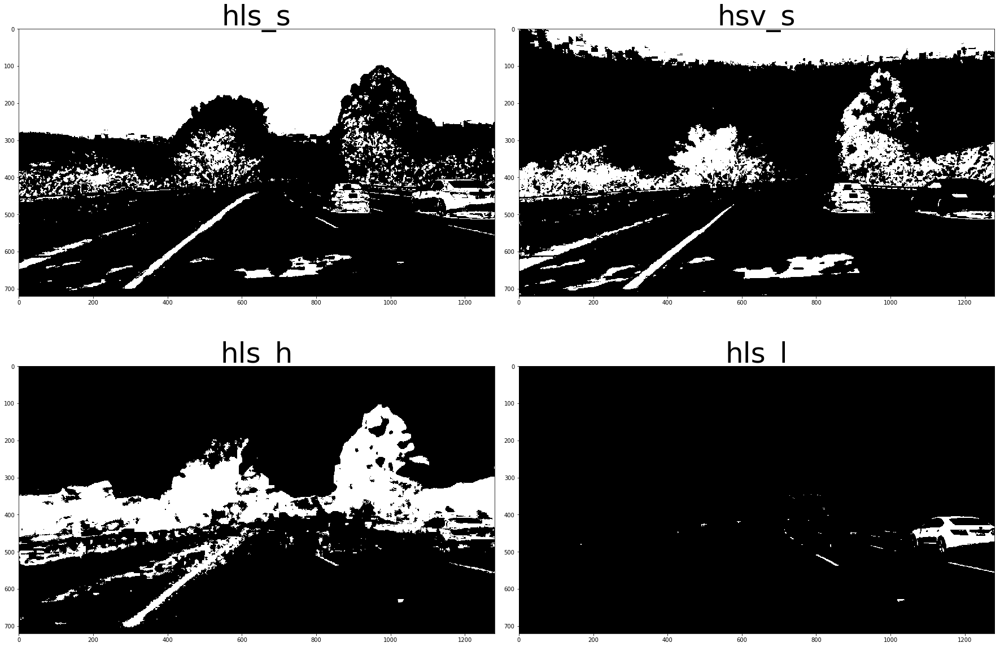

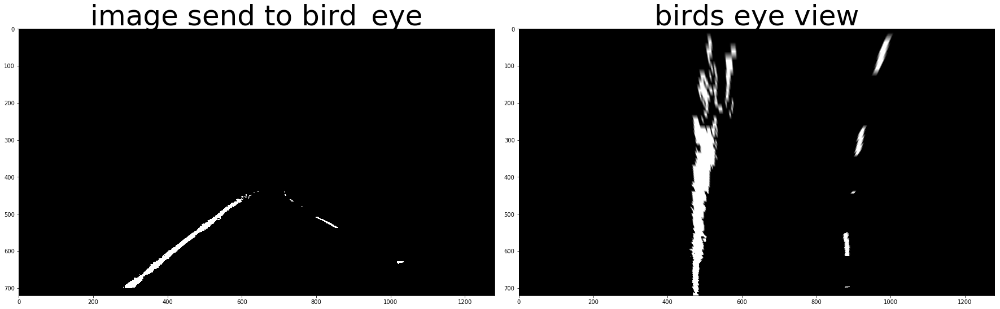

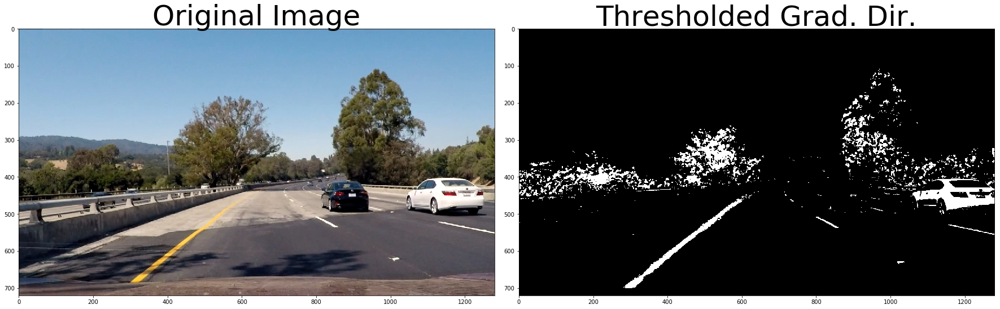

In [112]:
# image = cv2.imread("test_images/test1.jpg")
image = cv2.imread("test_images/test4.jpg")
img = cv2.undistort(image, mtx, dist, None, mtx)
binary_image = combine_color_grad(img, debug=True)
#binary_image = color_thresh(img, debug=True)
masked = region_of_interest(binary_image)
M, Minv = find_matrix()
# masked = gaussian_blur(masked, kernel_size=5)
warped = birds_eye(masked, M, debug=True)

image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
# ax2.imshow(image)
ax2.imshow(binary_image, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

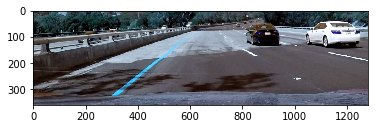

In [115]:
image = cv2.imread("test_images/test4.jpg")
img = image[int(image.shape[0]/2):,:]
plt.imshow(img)

In [126]:
def draw_lane(img, left_fit, right_fit):
    window_img = np.zeros_like(img)
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    left_line_window = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    right_line_window = np.array([np.flipud(np.transpose(np.vstack([right_fitx, 
                                  ploty])))])
    lane_pts = np.hstack((left_line_window, right_line_window))
    cv2.fillPoly(window_img, np.int_([lane_pts]), (0,255, 0))
    out_img = cv2.addWeighted(img, 1, window_img, 0.3, 0)
    
    return out_img
    

def seperate_fit_first_time(binary_warped, debug=False):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    #print(len(binary_warped[int(binary_warped.shape[0]/2):,:][0]))
    #print(len(histogram[0]))
    # Create an output image to draw on and  visualize the result
    out_img = binary_warped.copy()
    out_img = np.uint8((out_img-np.min(out_img))/(np.max(out_img)-np.min(out_img))*255)
    print(out_img.shape)
    out_img = np.dstack((out_img, out_img, out_img))
    print(out_img.shape)
    #print(out_img[200][0])
#     out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
#     out_img = np.uint8(out_img)
    if debug:
        fig, ax = plt.subplots(figsize=(12, 7))
        ax.imshow(out_img)
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    #print(nonzeroy)   [ 10  10  10 ..., 719 719 719]
    nonzerox = np.array(nonzero[1])
    #print(nonzerox)
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        if debug:
            # Draw the windows on the visualization image
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
            (0,255,0), 2) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
            (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        #print(len(((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        #(nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high))))
        #print(len(win_y_low))
        #print(len(nonzeroy >= win_y_low))
        #print(good_left_inds)
        #print(len(good_left_inds))
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            #print(nonzerox[good_left_inds])
            #leftx_currentaaa = np.int(np.mean(good_left_inds))
            print(leftx_current)
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    #print(left_lane_inds)
    left_lane_inds = np.concatenate(left_lane_inds)
    print(len(left_lane_inds))
    right_lane_inds = np.concatenate(right_lane_inds)
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    
    # Extract left and right line pixel positions
    if np.sum(left_lane_inds) < 50:
        left_fit = np.array([np.nan,np.nan,np.nan])
    else:
        leftx = nonzerox[left_lane_inds]
        print(len(nonzerox[left_lane_inds]))
        print(leftx)
        lefty = nonzeroy[left_lane_inds] 
        left_fit = np.polyfit(lefty, leftx, 2)
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    
    if np.sum(right_lane_inds) < 50:
        right_fit = np.array([np.nan,np.nan,np.nan])
    else:
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds] 
        right_fit = np.polyfit(righty, rightx, 2)
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # draw lane in green color
    #if debug:
        #out_img = draw_lane(out_img, left_fit, right_fit)
    
    if debug:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        fig, ax = plt.subplots(figsize=(12, 7))
        ax.imshow(out_img)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        
    return left_fit, right_fit, out_img

def seperate_fit_with_reference(binary_warped, line_obj, debug=False):
    out_img = binary_warped.copy()
    out_img = np.uint8((out_img-np.min(out_img))/(np.max(out_img)-np.min(out_img))*255)
    out_img = np.dstack((out_img, out_img, out_img))
    
    if debug:
        left_fit, right_fit = line_obj
    else:
        left_fit, right_fit = line_obj.average_fit
        
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) &
                      (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) &
                       (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
      
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    # Extract left and right line pixel positions
    if np.sum(left_lane_inds) < 50:
        left_fit = np.array([np.nan,np.nan,np.nan])
    else:
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        left_fit = np.polyfit(lefty, leftx, 2)
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    
    if np.sum(right_lane_inds) < 50:
        right_fit = np.array([np.nan,np.nan,np.nan])
    else:
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds] 
        right_fit = np.polyfit(righty, rightx, 2)
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    #if debug:
       # out_img = draw_lane(out_img, left_fit, right_fit)
    
    if debug:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        
        window_img = np.zeros_like(out_img)
        left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                      ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                      ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
        out_img = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
        
        fig, ax = plt.subplots(figsize=(12, 7))
        ax.imshow(out_img)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        
    return left_fit, right_fit, out_img

(720, 1280)
(720, 1280, 3)
474
480
482
487
498
501
525
529
539
30664
30664
[468 469 470 ..., 584 585 586]


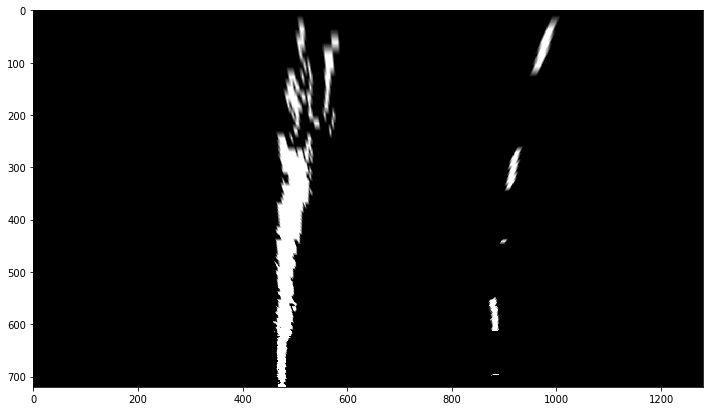

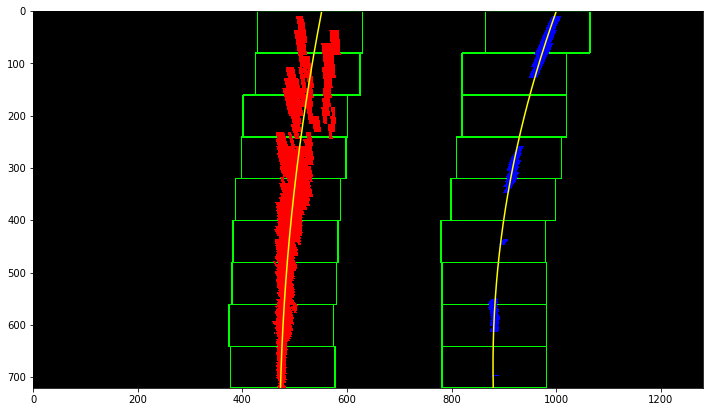

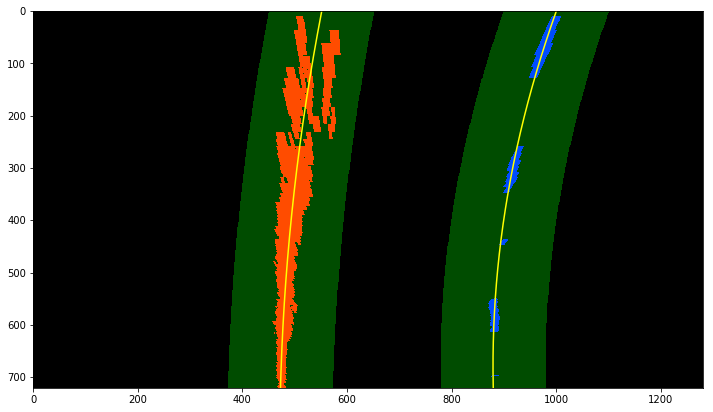

In [127]:
left_fit, right_fit, out_img = seperate_fit_first_time(warped, debug=True)
left_fit, right_fit, out_img = seperate_fit_with_reference(warped, [left_fit, right_fit], debug=True)

In [118]:
######################################################################################
###Determine the curvature of the lane and vehicle position with respect to center.###
# Define y-value where we want radius of curvature
# I'll choose the maximum y-value, corresponding to the bottom of the image
def radius(left_fit, right_fit):
    ploty = np.linspace(0, 719, num=720)
    y_eval = np.max(ploty)
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
#     print(left_curverad, right_curverad)
    # Example values: 1926.74 1908.48

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/700 # meters per pixel in y dimension
    xm_per_pix = 3.7/400 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    return left_curverad, right_curverad

left_curverad, right_curverad = radius(left_fit, right_fit)
# Now our radius of curvature is in meters
print(left_curverad, 'm', right_curverad, 'm')

858.540826579 m 377.03541324 m


In [119]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [120]:
class Line():
    def __init__(self):
        self.buffer_size = 15
        self.need_complete_search = True
        # tolerance of left and right difference, in pixels, note the diff is normalized, 0 means good
        self.lr_diff_tolerance = 500
        # tolerance of current and average difference in pixels
        self.ca_diff_tolerance = self.lr_diff_tolerance
        # was the line detected in the last iteration?
        self.detected = [False, False]  
        # x values of the last n fits of the line
        self.recent_fit = np.full((self.buffer_size, 2, 3), np.nan)
        #polynomial coefficients averaged over the last n iterations
        self.average_fit = np.array([[np.nan, np.nan, np.nan],[np.nan, np.nan, np.nan]])
        self.average_fit_middle = np.array([np.nan, np.nan, np.nan])
        #polynomial coefficients for the most recent fit
        self.current_fit = np.array([False, False])
        #radius of curvature of the line in some units
        self.radius_of_curvature = np.full((self.buffer_size,3), np.nan)
        #distance in meters of vehicle center from the line
        self.line_base_pos = None  
        self.line_base_offset = None
        #difference in fit coefficients between last and new fits
        self.pair_diff = np.array([np.nan, np.nan])
        self.average_diff = np.array([np.nan, np.nan])
        self.previous_diff = np.full((1,2,2), np.nan)
        self.top_bot_intersect_current = np.array([[np.nan, np.nan],[np.nan, np.nan]])
        self.top_bot_intersect_average = np.array([[np.nan, np.nan],[np.nan, np.nan]])
        
    def add(self, left_fit, right_fit):
        self.current_fit = np.array([[left_fit, right_fit]])
        ploty = np.array([0, 719])
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        self.top_bot_intersect_current = np.array([left_fitx, right_fitx])
        
        if False not in np.isnan(self.average_fit): # if average_fit is NaN
            if self.check_pair_diff() == 'good':  # if left and right fits difference is 'ok'
                self.add_to_recent(mask=[[0,0,0],[0,0,0]])
            else:
                pass
        else:
            left, right = self.check_previous_diff() # compare with previous average
            self.add_to_recent(mask=np.array([left, right]))
        self.update()
                               
    def add_to_recent(self, mask):
        self.recent_fit = np.append(np.delete(self.recent_fit, 0, axis=0), self.current_fit+mask, axis=0)

    def update(self):
        self.detected = np.invert(np.isnan(np.nanmean(self.current_fit, axis=1)))
        self.average_fit = np.nanmean(self.recent_fit, axis=0)
        if True in np.isnan(self.average_fit):
            self.need_complete_search = True
        else:
            self.need_complete_search = False
        left_fit, right_fit = self.average_fit
        ploty = np.array([0, 719])
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        self.top_bot_intersect_average = np.array([left_fitx, right_fitx])
        self.line_base_pos = (self.top_bot_intersect_average[0,1] + self.top_bot_intersect_average[1,1]) / 2
        self.line_base_offset = (640 - self.line_base_pos) * 3.7/400
        self.average_fit_middle = np.nanmean(self.average_fit, axis=0)
        _, _, _ = self.radius()
        
    
    def check_pair_diff(self):
        left_fitx, right_fitx = self.top_bot_intersect_current
        self.pair_diff = right_fitx - left_fitx
        if left_fitx[0] < 0 or self.pair_diff[0] < 200 or right_fitx[0]>1280 or left_fitx[1]>600 or right_fitx[1]<680:
            return 'bad' # bad result
        else:
            return 'good'  # good result
            
    def check_previous_diff(self):
        """
        create a mask for bad data
        """
        diff_left, diff_right = self.top_bot_intersect_current - self.top_bot_intersect_average
        if True in (np.absolute(diff_left) > self.ca_diff_tolerance) or (self.check_pair_diff() == 'bad'):
            left = [np.nan, np.nan, np.nan]
        else:
            left = [0,0,0]
        if True in (np.absolute(diff_right) > self.ca_diff_tolerance) or (self.check_pair_diff() == 'bad'):
            right = [np.nan, np.nan, np.nan]
        else:
            right = [0,0,0]
        return left, right
        
    def radius(self):
        left_fit, right_fit = self.average_fit
        middle_fit = self.average_fit_middle
        ploty = np.linspace(0, 719, num=720)
        y_eval = np.max(ploty)
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        middle_fitx = middle_fit[0]*ploty**2 + middle_fit[1]*ploty + middle_fit[2]

        left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
        right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    #     print(left_curverad, right_curverad)
        # Example values: 1926.74 1908.48

        # Define conversions in x and y from pixels space to meters
        ym_per_pix = 30/720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meters per pixel in x dimension
        
        self.offset_in_meters = xm_per_pix * (self.line_base_pos-1280/2)

        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
        middle_fit_cr = np.polyfit(ploty*ym_per_pix, middle_fitx*xm_per_pix, 2)
        # Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        middle_curverad = ((1 + (2*middle_fit_cr[0]*y_eval*ym_per_pix + middle_fit_cr[1])**2)**1.5) / np.absolute(2*middle_fit_cr[0])
        temp = np.delete(self.radius_of_curvature,0,axis=0)
        self.radius_of_curvature = np.append(temp, np.array([[left_curverad, right_curverad, middle_curverad]]), axis=0)
        return left_curverad, right_curverad, middle_curverad
        
line_obj = Line()

In [121]:
class Line():
    def __init__(self):
        self.buffer_size = 15
        self.need_complete_search = True
        # tolerance of left and right difference, in pixels, note the diff is normalized, 0 means good
        self.lr_diff_tolerance = 500
        # tolerance of current and average difference in pixels
        self.ca_diff_tolerance = self.lr_diff_tolerance
        # was the line detected in the last iteration?
        self.detected = [False, False]  
        # x values of the last n fits of the line
        self.recent_fit = np.full((self.buffer_size, 2, 3), np.nan)
        #polynomial coefficients averaged over the last n iterations
        self.average_fit = np.array([[np.nan, np.nan, np.nan],[np.nan, np.nan, np.nan]])
        self.average_fit_middle = np.array([np.nan, np.nan, np.nan])
        #polynomial coefficients for the most recent fit
        self.current_fit = np.array([False, False])
        #radius of curvature of the line in some units
        self.radius_of_curvature = np.full((self.buffer_size,3), np.nan)
        #distance in meters of vehicle center from the line
        self.line_base_pos = None  
        self.line_base_offset = None
        #difference in fit coefficients between last and new fits
        self.pair_diff = np.array([np.nan, np.nan])
        self.average_diff = np.array([np.nan, np.nan])
        self.previous_diff = np.full((1,2,2), np.nan)
        self.top_bot_intersect_current = np.array([[np.nan, np.nan],[np.nan, np.nan]])
        self.top_bot_intersect_average = np.array([[np.nan, np.nan],[np.nan, np.nan]])
        
    def add(self, left_fit, right_fit):
        self.current_fit = np.array([[left_fit, right_fit]])
        ploty = np.array([0, 719])
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        self.top_bot_intersect_current = np.array([left_fitx, right_fitx])
        
        if False not in np.isnan(self.average_fit): # if average_fit is NaN
            if self.check_pair_diff() == 'good':  # if left and right fits difference is 'ok'
                self.add_to_recent(mask=[[0,0,0],[0,0,0]])
            else:
                pass
        else:
            left, right = self.check_previous_diff() # compare with previous average
            self.add_to_recent(mask=np.array([left, right]))
        self.update()
                               
    def add_to_recent(self, mask):
        self.recent_fit = np.append(np.delete(self.recent_fit, 0, axis=0), self.current_fit+mask, axis=0)

    def update(self):
        self.detected = np.invert(np.isnan(np.nanmean(self.current_fit, axis=1)))
        self.average_fit = np.nanmean(self.recent_fit, axis=0)
        if True in np.isnan(self.average_fit):
            self.need_complete_search = True
        else:
            self.need_complete_search = False
        left_fit, right_fit = self.average_fit
        ploty = np.array([0, 719])
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        self.top_bot_intersect_average = np.array([left_fitx, right_fitx])
        self.line_base_pos = (self.top_bot_intersect_average[0,1] + self.top_bot_intersect_average[1,1]) / 2
        self.line_base_offset = (640 - self.line_base_pos) * 3.7/400
        self.average_fit_middle = np.nanmean(self.average_fit, axis=0)
        _, _, _ = self.radius()
        
    
    def check_pair_diff(self):
        left_fitx, right_fitx = self.top_bot_intersect_current
        self.pair_diff = right_fitx - left_fitx
        if left_fitx[0] < 0 or self.pair_diff[0] < 200 or right_fitx[0]>1280 or left_fitx[1]>600 or right_fitx[1]<680:
            return 'bad' # bad result
        else:
            return 'good'  # good result
            
    def check_previous_diff(self):
        """
        create a mask for bad data
        """
        diff_left, diff_right = self.top_bot_intersect_current - self.top_bot_intersect_average
        if True in (np.absolute(diff_left) > self.ca_diff_tolerance) or (self.check_pair_diff() == 'bad'):
            left = [np.nan, np.nan, np.nan]
        else:
            left = [0,0,0]
        if True in (np.absolute(diff_right) > self.ca_diff_tolerance) or (self.check_pair_diff() == 'bad'):
            right = [np.nan, np.nan, np.nan]
        else:
            right = [0,0,0]
        return left, right
        
    def radius(self):
        left_fit, right_fit = self.average_fit
        middle_fit = self.average_fit_middle
        ploty = np.linspace(0, 719, num=720)
        y_eval = np.max(ploty)
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        middle_fitx = middle_fit[0]*ploty**2 + middle_fit[1]*ploty + middle_fit[2]

        left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
        right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    #     print(left_curverad, right_curverad)
        # Example values: 1926.74 1908.48

        # Define conversions in x and y from pixels space to meters
        ym_per_pix = 30/720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meters per pixel in x dimension
        
        self.offset_in_meters = xm_per_pix * (self.line_base_pos-1280/2)

        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
        middle_fit_cr = np.polyfit(ploty*ym_per_pix, middle_fitx*xm_per_pix, 2)
        # Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        middle_curverad = ((1 + (2*middle_fit_cr[0]*y_eval*ym_per_pix + middle_fit_cr[1])**2)**1.5) / np.absolute(2*middle_fit_cr[0])
        temp = np.delete(self.radius_of_curvature,0,axis=0)
        self.radius_of_curvature = np.append(temp, np.array([[left_curverad, right_curverad, middle_curverad]]), axis=0)
        return left_curverad, right_curverad, middle_curverad
        
line_obj = Line()

In [124]:
M, Minv = find_matrix()

trouble_count = 0
save_trouble_pics = True
def weighted_img(img, initial_img, α=0.8, β=1., λ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + λ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, λ)
def pipeline(image):
    global trouble_count
    image = cv2.cvtColor(image,cv2.COLOR_RGB2BGR)
    img = image.copy()
    img = cv2.undistort(img, mtx, dist, None, mtx)
    binary_image = combine_color_grad(img, debug=False)
    masked = region_of_interest(binary_image)
    # masked = gaussian_blur(masked, kernel_size=5)
    warped = birds_eye(masked, M, debug=False)
    if line_obj.need_complete_search:
        left_fit, right_fit, out_img = seperate_fit_first_time(warped, debug=False)
    else:
        left_fit, right_fit, out_img = seperate_fit_with_reference(warped, line_obj, debug=False)
    if save_trouble_pics & (False in line_obj.detected):
        cv2.imwrite('./trouble/{}.jpg'.format(trouble_count), img)
        trouble_count += 1
    line_obj.add(left_fit, right_fit)
    
    out_img = draw_lane(out_img, line_obj.average_fit[0], line_obj.average_fit[1])
    
    # unwarp
    unwarp =  birds_eye(out_img, Minv, debug=False)
    output = weighted_img(unwarp, img)
    output = cv2.cvtColor(output,cv2.COLOR_BGR2RGB)
    
    center_radius = np.nanmean(line_obj.radius_of_curvature[:,2])
    radius_text = "Lane Radius = {0:.2f} m".format(center_radius)
    off_center_text = "Off Center by: {0:.2f} m".format(line_obj.line_base_offset)
    cv2.putText(output,radius_text,(50,100), cv2.FONT_HERSHEY_SIMPLEX, 1,(255,255,255),2,cv2.LINE_AA)
    cv2.putText(output,off_center_text,(50,150), cv2.FONT_HERSHEY_SIMPLEX, 1,(255,255,255),2,cv2.LINE_AA)
    
    
    return output

In [125]:
project_output = './output_videos/project_video_output111.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("project_video.mp4").subclip(0,1)
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
%time white_clip.write_videofile(project_output, audio=False)

(720, 1280)
[MoviePy] >>>> Building video ./output_videos/project_video_output111.mp4
[MoviePy] Writing video ./output_videos/project_video_output111.mp4


  0%|                                                                                         | 0/1261 [00:00<?, ?it/s]

(720, 1280)


  0%|                                                                                 | 1/1261 [00:00<08:15,  2.54it/s]

(720, 1280)


  0%|▏                                                                                | 2/1261 [00:00<08:12,  2.55it/s]

(720, 1280)


  0%|▏                                                                                | 3/1261 [00:01<08:08,  2.57it/s]

(720, 1280)


  0%|▎                                                                                | 4/1261 [00:01<08:03,  2.60it/s]

(720, 1280)


  0%|▎                                                                                | 5/1261 [00:01<07:59,  2.62it/s]

(720, 1280)


  0%|▍                                                                                | 6/1261 [00:02<07:55,  2.64it/s]

(720, 1280)


  1%|▍                                                                                | 7/1261 [00:02<08:12,  2.54it/s]

(720, 1280)


  1%|▌                                                                                | 8/1261 [00:03<08:08,  2.57it/s]

(720, 1280)


  1%|▌                                                                                | 9/1261 [00:03<08:02,  2.59it/s]

(720, 1280)


  1%|▋                                                                               | 10/1261 [00:03<07:54,  2.63it/s]

(720, 1280)


  1%|▋                                                                               | 11/1261 [00:04<07:49,  2.66it/s]

(720, 1280)


  1%|▊                                                                               | 12/1261 [00:04<08:04,  2.58it/s]

(720, 1280)


  1%|▊                                                                               | 13/1261 [00:05<08:19,  2.50it/s]

(720, 1280)


  1%|▉                                                                               | 14/1261 [00:05<08:22,  2.48it/s]

(720, 1280)


  1%|▉                                                                               | 15/1261 [00:05<08:24,  2.47it/s]

(720, 1280)


  1%|█                                                                               | 16/1261 [00:06<08:28,  2.45it/s]

(720, 1280)


  1%|█                                                                               | 17/1261 [00:06<08:34,  2.42it/s]

(720, 1280)


  1%|█▏                                                                              | 18/1261 [00:07<08:19,  2.49it/s]

(720, 1280)


  2%|█▏                                                                              | 19/1261 [00:07<08:11,  2.53it/s]

(720, 1280)


  2%|█▎                                                                              | 20/1261 [00:07<08:01,  2.58it/s]

(720, 1280)


  2%|█▎                                                                              | 21/1261 [00:08<08:17,  2.49it/s]

(720, 1280)


  2%|█▍                                                                              | 22/1261 [00:08<08:28,  2.43it/s]

(720, 1280)


  2%|█▍                                                                              | 23/1261 [00:09<08:17,  2.49it/s]

(720, 1280)


  2%|█▌                                                                              | 24/1261 [00:09<08:32,  2.41it/s]

(720, 1280)


  2%|█▌                                                                              | 25/1261 [00:09<08:35,  2.40it/s]

(720, 1280)


  2%|█▋                                                                              | 26/1261 [00:10<08:39,  2.38it/s]

(720, 1280)


  2%|█▋                                                                              | 27/1261 [00:10<08:43,  2.36it/s]

(720, 1280)


  2%|█▊                                                                              | 28/1261 [00:11<08:23,  2.45it/s]

(720, 1280)


  2%|█▊                                                                              | 29/1261 [00:11<08:11,  2.51it/s]

(720, 1280)


  2%|█▉                                                                              | 30/1261 [00:11<08:01,  2.56it/s]

(720, 1280)


  2%|█▉                                                                              | 31/1261 [00:12<07:56,  2.58it/s]

(720, 1280)


  3%|██                                                                              | 32/1261 [00:12<07:49,  2.62it/s]

(720, 1280)


  3%|██                                                                              | 33/1261 [00:13<07:55,  2.58it/s]

(720, 1280)


  3%|██▏                                                                             | 34/1261 [00:13<07:53,  2.59it/s]

(720, 1280)


  3%|██▏                                                                             | 35/1261 [00:13<07:47,  2.62it/s]

(720, 1280)


  3%|██▎                                                                             | 36/1261 [00:14<07:42,  2.65it/s]

(720, 1280)


  3%|██▎                                                                             | 37/1261 [00:14<07:41,  2.65it/s]

(720, 1280)


  3%|██▍                                                                             | 38/1261 [00:14<07:36,  2.68it/s]

(720, 1280)


  3%|██▍                                                                             | 39/1261 [00:15<07:44,  2.63it/s]

(720, 1280)


  3%|██▌                                                                             | 40/1261 [00:15<07:39,  2.66it/s]

(720, 1280)


  3%|██▌                                                                             | 41/1261 [00:16<07:32,  2.69it/s]

(720, 1280)


  3%|██▋                                                                             | 42/1261 [00:16<07:31,  2.70it/s]

(720, 1280)


  3%|██▋                                                                             | 43/1261 [00:16<07:40,  2.64it/s]

(720, 1280)


  3%|██▊                                                                             | 44/1261 [00:17<07:37,  2.66it/s]

(720, 1280)


  4%|██▊                                                                             | 45/1261 [00:17<07:38,  2.65it/s]

(720, 1280)


  4%|██▉                                                                             | 46/1261 [00:17<07:35,  2.67it/s]

(720, 1280)


  4%|██▉                                                                             | 47/1261 [00:18<07:36,  2.66it/s]

(720, 1280)


  4%|███                                                                             | 48/1261 [00:18<07:37,  2.65it/s]

(720, 1280)


  4%|███                                                                             | 49/1261 [00:19<07:37,  2.65it/s]

(720, 1280)


  4%|███▏                                                                            | 50/1261 [00:19<07:40,  2.63it/s]

(720, 1280)


  4%|███▏                                                                            | 51/1261 [00:19<07:40,  2.63it/s]

(720, 1280)


  4%|███▎                                                                            | 52/1261 [00:20<07:40,  2.62it/s]

(720, 1280)


  4%|███▎                                                                            | 53/1261 [00:20<07:40,  2.62it/s]

(720, 1280)


  4%|███▍                                                                            | 54/1261 [00:21<07:43,  2.60it/s]

(720, 1280)


  4%|███▍                                                                            | 55/1261 [00:21<07:44,  2.60it/s]

(720, 1280)


  4%|███▌                                                                            | 56/1261 [00:21<07:45,  2.59it/s]

(720, 1280)


  5%|███▌                                                                            | 57/1261 [00:22<07:43,  2.60it/s]

(720, 1280)


  5%|███▋                                                                            | 58/1261 [00:22<07:45,  2.59it/s]

(720, 1280)


  5%|███▋                                                                            | 59/1261 [00:22<07:43,  2.59it/s]

(720, 1280)


  5%|███▊                                                                            | 60/1261 [00:23<07:42,  2.60it/s]

(720, 1280)


  5%|███▊                                                                            | 61/1261 [00:23<07:45,  2.58it/s]

(720, 1280)


  5%|███▉                                                                            | 62/1261 [00:24<07:45,  2.57it/s]

(720, 1280)


  5%|███▉                                                                            | 63/1261 [00:24<07:43,  2.58it/s]

(720, 1280)


  5%|████                                                                            | 64/1261 [00:24<07:40,  2.60it/s]

(720, 1280)


  5%|████                                                                            | 65/1261 [00:25<07:40,  2.60it/s]

(720, 1280)


  5%|████▏                                                                           | 66/1261 [00:25<07:37,  2.61it/s]

(720, 1280)


  5%|████▎                                                                           | 67/1261 [00:26<07:33,  2.63it/s]

(720, 1280)


  5%|████▎                                                                           | 68/1261 [00:26<07:32,  2.64it/s]

(720, 1280)


  5%|████▍                                                                           | 69/1261 [00:26<07:33,  2.63it/s]

(720, 1280)


  6%|████▍                                                                           | 70/1261 [00:27<07:31,  2.64it/s]

(720, 1280)


  6%|████▌                                                                           | 71/1261 [00:27<07:33,  2.63it/s]

(720, 1280)


  6%|████▌                                                                           | 72/1261 [00:27<07:29,  2.64it/s]

(720, 1280)


  6%|████▋                                                                           | 73/1261 [00:28<07:28,  2.65it/s]

(720, 1280)


  6%|████▋                                                                           | 74/1261 [00:28<07:28,  2.65it/s]

(720, 1280)


  6%|████▊                                                                           | 75/1261 [00:29<07:28,  2.64it/s]

(720, 1280)


  6%|████▊                                                                           | 76/1261 [00:29<07:28,  2.64it/s]

(720, 1280)


  6%|████▉                                                                           | 77/1261 [00:29<07:30,  2.63it/s]

(720, 1280)


  6%|████▉                                                                           | 78/1261 [00:30<07:27,  2.64it/s]

(720, 1280)


  6%|█████                                                                           | 79/1261 [00:30<07:28,  2.64it/s]

(720, 1280)


  6%|█████                                                                           | 80/1261 [00:30<07:25,  2.65it/s]

(720, 1280)


  6%|█████▏                                                                          | 81/1261 [00:31<07:25,  2.65it/s]

(720, 1280)


  7%|█████▏                                                                          | 82/1261 [00:31<07:24,  2.65it/s]

(720, 1280)


  7%|█████▎                                                                          | 83/1261 [00:32<07:24,  2.65it/s]

(720, 1280)


  7%|█████▎                                                                          | 84/1261 [00:32<07:24,  2.65it/s]

(720, 1280)


  7%|█████▍                                                                          | 85/1261 [00:32<07:24,  2.65it/s]

(720, 1280)


  7%|█████▍                                                                          | 86/1261 [00:33<07:23,  2.65it/s]

(720, 1280)


  7%|█████▌                                                                          | 87/1261 [00:33<07:23,  2.65it/s]

(720, 1280)


  7%|█████▌                                                                          | 88/1261 [00:33<07:22,  2.65it/s]

(720, 1280)


  7%|█████▋                                                                          | 89/1261 [00:34<07:20,  2.66it/s]

(720, 1280)


  7%|█████▋                                                                          | 90/1261 [00:34<07:20,  2.66it/s]

(720, 1280)


  7%|█████▊                                                                          | 91/1261 [00:35<07:22,  2.65it/s]

(720, 1280)


  7%|█████▊                                                                          | 92/1261 [00:35<07:21,  2.65it/s]

(720, 1280)


  7%|█████▉                                                                          | 93/1261 [00:35<07:21,  2.65it/s]

(720, 1280)


  7%|█████▉                                                                          | 94/1261 [00:36<07:20,  2.65it/s]

(720, 1280)


  8%|██████                                                                          | 95/1261 [00:36<07:21,  2.64it/s]

(720, 1280)


  8%|██████                                                                          | 96/1261 [00:36<07:22,  2.63it/s]

(720, 1280)


  8%|██████▏                                                                         | 97/1261 [00:37<07:19,  2.65it/s]

(720, 1280)


  8%|██████▏                                                                         | 98/1261 [00:37<07:18,  2.65it/s]

(720, 1280)


  8%|██████▎                                                                         | 99/1261 [00:38<07:18,  2.65it/s]

(720, 1280)


  8%|██████▎                                                                        | 100/1261 [00:38<07:19,  2.64it/s]

(720, 1280)


  8%|██████▎                                                                        | 101/1261 [00:38<07:18,  2.64it/s]

(720, 1280)


  8%|██████▍                                                                        | 102/1261 [00:39<07:17,  2.65it/s]

(720, 1280)


  8%|██████▍                                                                        | 103/1261 [00:39<07:19,  2.64it/s]

(720, 1280)


  8%|██████▌                                                                        | 104/1261 [00:40<08:01,  2.40it/s]

(720, 1280)


  8%|██████▌                                                                        | 105/1261 [00:40<08:04,  2.39it/s]

(720, 1280)


  8%|██████▋                                                                        | 106/1261 [00:40<07:56,  2.42it/s]

(720, 1280)


  8%|██████▋                                                                        | 107/1261 [00:41<07:53,  2.44it/s]

(720, 1280)


  9%|██████▊                                                                        | 108/1261 [00:41<07:53,  2.43it/s]

(720, 1280)


  9%|██████▊                                                                        | 109/1261 [00:42<08:04,  2.38it/s]

(720, 1280)


  9%|██████▉                                                                        | 110/1261 [00:42<07:50,  2.45it/s]

(720, 1280)


  9%|██████▉                                                                        | 111/1261 [00:42<07:39,  2.50it/s]

(720, 1280)


  9%|███████                                                                        | 112/1261 [00:43<07:33,  2.54it/s]

(720, 1280)


  9%|███████                                                                        | 113/1261 [00:43<07:27,  2.57it/s]

(720, 1280)


  9%|███████▏                                                                       | 114/1261 [00:44<07:29,  2.55it/s]

(720, 1280)


  9%|███████▏                                                                       | 115/1261 [00:44<07:25,  2.57it/s]

(720, 1280)


  9%|███████▎                                                                       | 116/1261 [00:44<07:21,  2.59it/s]

(720, 1280)


  9%|███████▎                                                                       | 117/1261 [00:45<07:17,  2.62it/s]

(720, 1280)


  9%|███████▍                                                                       | 118/1261 [00:45<07:15,  2.63it/s]

(720, 1280)


  9%|███████▍                                                                       | 119/1261 [00:46<07:15,  2.62it/s]

(720, 1280)


 10%|███████▌                                                                       | 120/1261 [00:46<07:10,  2.65it/s]

(720, 1280)


 10%|███████▌                                                                       | 121/1261 [00:46<07:12,  2.64it/s]

(720, 1280)


 10%|███████▋                                                                       | 122/1261 [00:47<07:12,  2.63it/s]

(720, 1280)


 10%|███████▋                                                                       | 123/1261 [00:47<07:12,  2.63it/s]

(720, 1280)


 10%|███████▊                                                                       | 124/1261 [00:47<07:11,  2.64it/s]

(720, 1280)


 10%|███████▊                                                                       | 125/1261 [00:48<07:11,  2.63it/s]

(720, 1280)


 10%|███████▉                                                                       | 126/1261 [00:48<07:23,  2.56it/s]

(720, 1280)


 10%|███████▉                                                                       | 127/1261 [00:49<07:20,  2.57it/s]

(720, 1280)


 10%|████████                                                                       | 128/1261 [00:49<07:28,  2.53it/s]

(720, 1280)


 10%|████████                                                                       | 129/1261 [00:49<07:23,  2.55it/s]

(720, 1280)


 10%|████████▏                                                                      | 130/1261 [00:50<07:54,  2.38it/s]

(720, 1280)


 10%|████████▏                                                                      | 131/1261 [00:50<08:23,  2.24it/s]

(720, 1280)


 10%|████████▎                                                                      | 132/1261 [00:51<08:04,  2.33it/s]

(720, 1280)


 11%|████████▎                                                                      | 133/1261 [00:51<08:13,  2.28it/s]

(720, 1280)


 11%|████████▍                                                                      | 134/1261 [00:52<07:54,  2.37it/s]

(720, 1280)


 11%|████████▍                                                                      | 135/1261 [00:52<07:38,  2.46it/s]

(720, 1280)


 11%|████████▌                                                                      | 136/1261 [00:52<07:28,  2.51it/s]

(720, 1280)


 11%|████████▌                                                                      | 137/1261 [00:53<07:21,  2.54it/s]

(720, 1280)


 11%|████████▋                                                                      | 138/1261 [00:53<07:17,  2.56it/s]

(720, 1280)


 11%|████████▋                                                                      | 139/1261 [00:53<07:13,  2.59it/s]

(720, 1280)


 11%|████████▊                                                                      | 140/1261 [00:54<07:11,  2.60it/s]

(720, 1280)


 11%|████████▊                                                                      | 141/1261 [00:54<07:09,  2.61it/s]

(720, 1280)


 11%|████████▉                                                                      | 142/1261 [00:55<07:06,  2.62it/s]

(720, 1280)


 11%|████████▉                                                                      | 143/1261 [00:55<07:04,  2.63it/s]

(720, 1280)


 11%|█████████                                                                      | 144/1261 [00:55<07:02,  2.65it/s]

(720, 1280)


 11%|█████████                                                                      | 145/1261 [00:56<07:03,  2.64it/s]

(720, 1280)


 12%|█████████▏                                                                     | 146/1261 [00:56<07:02,  2.64it/s]

(720, 1280)


 12%|█████████▏                                                                     | 147/1261 [00:57<07:01,  2.64it/s]

(720, 1280)


 12%|█████████▎                                                                     | 148/1261 [00:57<07:02,  2.63it/s]

(720, 1280)


 12%|█████████▎                                                                     | 149/1261 [00:57<06:59,  2.65it/s]

(720, 1280)


 12%|█████████▍                                                                     | 150/1261 [00:58<06:58,  2.66it/s]

(720, 1280)


 12%|█████████▍                                                                     | 151/1261 [00:58<06:58,  2.65it/s]

(720, 1280)


 12%|█████████▌                                                                     | 152/1261 [00:58<06:56,  2.66it/s]

(720, 1280)


 12%|█████████▌                                                                     | 153/1261 [00:59<06:56,  2.66it/s]

(720, 1280)


 12%|█████████▋                                                                     | 154/1261 [00:59<06:57,  2.65it/s]

(720, 1280)


 12%|█████████▋                                                                     | 155/1261 [01:00<06:58,  2.64it/s]

(720, 1280)


 12%|█████████▊                                                                     | 156/1261 [01:00<06:57,  2.64it/s]

(720, 1280)


 12%|█████████▊                                                                     | 157/1261 [01:00<06:57,  2.64it/s]

(720, 1280)


 13%|█████████▉                                                                     | 158/1261 [01:01<06:57,  2.64it/s]

(720, 1280)


 13%|█████████▉                                                                     | 159/1261 [01:01<06:56,  2.65it/s]

(720, 1280)


 13%|██████████                                                                     | 160/1261 [01:01<06:57,  2.64it/s]

(720, 1280)


 13%|██████████                                                                     | 161/1261 [01:02<06:59,  2.62it/s]

(720, 1280)


 13%|██████████▏                                                                    | 162/1261 [01:02<06:57,  2.63it/s]

(720, 1280)


 13%|██████████▏                                                                    | 163/1261 [01:03<06:56,  2.64it/s]

(720, 1280)


 13%|██████████▎                                                                    | 164/1261 [01:03<06:54,  2.65it/s]

(720, 1280)


 13%|██████████▎                                                                    | 165/1261 [01:03<06:55,  2.64it/s]

(720, 1280)


 13%|██████████▍                                                                    | 166/1261 [01:04<06:54,  2.64it/s]

(720, 1280)


 13%|██████████▍                                                                    | 167/1261 [01:04<06:55,  2.64it/s]

(720, 1280)


 13%|██████████▌                                                                    | 168/1261 [01:04<06:52,  2.65it/s]

(720, 1280)


 13%|██████████▌                                                                    | 169/1261 [01:05<06:53,  2.64it/s]

(720, 1280)


 13%|██████████▋                                                                    | 170/1261 [01:05<06:52,  2.65it/s]

(720, 1280)


 14%|██████████▋                                                                    | 171/1261 [01:06<06:53,  2.63it/s]

(720, 1280)


 14%|██████████▊                                                                    | 172/1261 [01:06<06:51,  2.65it/s]

(720, 1280)


 14%|██████████▊                                                                    | 173/1261 [01:06<06:51,  2.64it/s]

(720, 1280)


 14%|██████████▉                                                                    | 174/1261 [01:07<06:50,  2.65it/s]

(720, 1280)


 14%|██████████▉                                                                    | 175/1261 [01:07<06:49,  2.65it/s]

(720, 1280)


 14%|███████████                                                                    | 176/1261 [01:07<06:51,  2.64it/s]

(720, 1280)


 14%|███████████                                                                    | 177/1261 [01:08<06:53,  2.62it/s]

(720, 1280)


 14%|███████████▏                                                                   | 178/1261 [01:08<06:52,  2.62it/s]

(720, 1280)


 14%|███████████▏                                                                   | 179/1261 [01:09<06:51,  2.63it/s]

(720, 1280)


 14%|███████████▎                                                                   | 180/1261 [01:09<06:48,  2.64it/s]

(720, 1280)


 14%|███████████▎                                                                   | 181/1261 [01:09<06:49,  2.64it/s]

(720, 1280)


 14%|███████████▍                                                                   | 182/1261 [01:10<06:49,  2.63it/s]

(720, 1280)


 15%|███████████▍                                                                   | 183/1261 [01:10<06:48,  2.64it/s]

(720, 1280)


 15%|███████████▌                                                                   | 184/1261 [01:11<06:45,  2.65it/s]

(720, 1280)


 15%|███████████▌                                                                   | 185/1261 [01:11<06:45,  2.65it/s]

(720, 1280)


 15%|███████████▋                                                                   | 186/1261 [01:11<07:06,  2.52it/s]

(720, 1280)


 15%|███████████▋                                                                   | 187/1261 [01:12<06:58,  2.57it/s]

(720, 1280)


 15%|███████████▊                                                                   | 188/1261 [01:12<06:53,  2.59it/s]

(720, 1280)


 15%|███████████▊                                                                   | 189/1261 [01:12<06:50,  2.61it/s]

(720, 1280)


 15%|███████████▉                                                                   | 190/1261 [01:13<06:50,  2.61it/s]

(720, 1280)


 15%|███████████▉                                                                   | 191/1261 [01:13<06:49,  2.61it/s]

(720, 1280)


 15%|████████████                                                                   | 192/1261 [01:14<06:47,  2.62it/s]

(720, 1280)


 15%|████████████                                                                   | 193/1261 [01:14<06:45,  2.63it/s]

(720, 1280)


 15%|████████████▏                                                                  | 194/1261 [01:14<06:44,  2.64it/s]

(720, 1280)


 15%|████████████▏                                                                  | 195/1261 [01:15<06:44,  2.63it/s]

(720, 1280)


 16%|████████████▎                                                                  | 196/1261 [01:15<06:43,  2.64it/s]

(720, 1280)


 16%|████████████▎                                                                  | 197/1261 [01:16<06:45,  2.63it/s]

(720, 1280)


 16%|████████████▍                                                                  | 198/1261 [01:16<06:45,  2.62it/s]

(720, 1280)


 16%|████████████▍                                                                  | 199/1261 [01:16<06:43,  2.63it/s]

(720, 1280)


 16%|████████████▌                                                                  | 200/1261 [01:17<06:43,  2.63it/s]

(720, 1280)


 16%|████████████▌                                                                  | 201/1261 [01:17<06:43,  2.63it/s]

(720, 1280)


 16%|████████████▋                                                                  | 202/1261 [01:17<06:43,  2.62it/s]

(720, 1280)


 16%|████████████▋                                                                  | 203/1261 [01:18<06:42,  2.63it/s]

(720, 1280)


 16%|████████████▊                                                                  | 204/1261 [01:18<06:43,  2.62it/s]

(720, 1280)


 16%|████████████▊                                                                  | 205/1261 [01:19<06:41,  2.63it/s]

(720, 1280)


 16%|████████████▉                                                                  | 206/1261 [01:19<06:41,  2.63it/s]

(720, 1280)


 16%|████████████▉                                                                  | 207/1261 [01:19<06:55,  2.54it/s]

(720, 1280)


 16%|█████████████                                                                  | 208/1261 [01:20<06:54,  2.54it/s]

(720, 1280)


 17%|█████████████                                                                  | 209/1261 [01:20<06:49,  2.57it/s]

(720, 1280)


 17%|█████████████▏                                                                 | 210/1261 [01:21<06:44,  2.60it/s]

(720, 1280)


 17%|█████████████▏                                                                 | 211/1261 [01:21<06:45,  2.59it/s]

(720, 1280)


 17%|█████████████▎                                                                 | 212/1261 [01:21<06:41,  2.61it/s]

(720, 1280)


 17%|█████████████▎                                                                 | 213/1261 [01:22<06:39,  2.62it/s]

(720, 1280)


 17%|█████████████▍                                                                 | 214/1261 [01:22<06:39,  2.62it/s]

(720, 1280)


 17%|█████████████▍                                                                 | 215/1261 [01:22<06:37,  2.63it/s]

(720, 1280)


 17%|█████████████▌                                                                 | 216/1261 [01:23<06:37,  2.63it/s]

(720, 1280)


 17%|█████████████▌                                                                 | 217/1261 [01:23<06:37,  2.63it/s]

(720, 1280)


 17%|█████████████▋                                                                 | 218/1261 [01:24<06:35,  2.64it/s]

(720, 1280)


 17%|█████████████▋                                                                 | 219/1261 [01:24<06:34,  2.64it/s]

(720, 1280)


 17%|█████████████▊                                                                 | 220/1261 [01:24<06:34,  2.64it/s]

(720, 1280)


 18%|█████████████▊                                                                 | 221/1261 [01:25<06:35,  2.63it/s]

(720, 1280)


 18%|█████████████▉                                                                 | 222/1261 [01:25<06:35,  2.63it/s]

(720, 1280)


 18%|█████████████▉                                                                 | 223/1261 [01:25<06:37,  2.61it/s]

(720, 1280)


 18%|██████████████                                                                 | 224/1261 [01:26<06:35,  2.62it/s]

(720, 1280)


 18%|██████████████                                                                 | 225/1261 [01:26<06:34,  2.63it/s]

(720, 1280)


 18%|██████████████▏                                                                | 226/1261 [01:27<06:32,  2.64it/s]

(720, 1280)


 18%|██████████████▏                                                                | 227/1261 [01:27<06:33,  2.63it/s]

(720, 1280)


 18%|██████████████▎                                                                | 228/1261 [01:27<06:31,  2.64it/s]

(720, 1280)


 18%|██████████████▎                                                                | 229/1261 [01:28<06:35,  2.61it/s]

(720, 1280)


 18%|██████████████▍                                                                | 230/1261 [01:28<06:35,  2.61it/s]

(720, 1280)


 18%|██████████████▍                                                                | 231/1261 [01:29<06:40,  2.57it/s]

(720, 1280)


 18%|██████████████▌                                                                | 232/1261 [01:29<06:38,  2.58it/s]

(720, 1280)


 18%|██████████████▌                                                                | 233/1261 [01:29<06:38,  2.58it/s]

(720, 1280)


 19%|██████████████▋                                                                | 234/1261 [01:30<06:34,  2.60it/s]

(720, 1280)


 19%|██████████████▋                                                                | 235/1261 [01:30<06:32,  2.61it/s]

(720, 1280)


 19%|██████████████▊                                                                | 236/1261 [01:30<06:30,  2.62it/s]

(720, 1280)


 19%|██████████████▊                                                                | 237/1261 [01:31<06:28,  2.64it/s]

(720, 1280)


 19%|██████████████▉                                                                | 238/1261 [01:31<06:26,  2.65it/s]

(720, 1280)


 19%|██████████████▉                                                                | 239/1261 [01:32<06:27,  2.64it/s]

(720, 1280)


 19%|███████████████                                                                | 240/1261 [01:32<06:27,  2.64it/s]

(720, 1280)


 19%|███████████████                                                                | 241/1261 [01:32<06:28,  2.62it/s]

(720, 1280)


 19%|███████████████▏                                                               | 242/1261 [01:33<06:27,  2.63it/s]

(720, 1280)


 19%|███████████████▏                                                               | 243/1261 [01:33<06:28,  2.62it/s]

(720, 1280)


 19%|███████████████▎                                                               | 244/1261 [01:33<06:27,  2.63it/s]

(720, 1280)


 19%|███████████████▎                                                               | 245/1261 [01:34<06:25,  2.63it/s]

(720, 1280)


 20%|███████████████▍                                                               | 246/1261 [01:34<06:26,  2.62it/s]

(720, 1280)


 20%|███████████████▍                                                               | 247/1261 [01:35<06:23,  2.65it/s]

(720, 1280)


 20%|███████████████▌                                                               | 248/1261 [01:35<06:23,  2.64it/s]

(720, 1280)


 20%|███████████████▌                                                               | 249/1261 [01:35<06:22,  2.65it/s]

(720, 1280)


 20%|███████████████▋                                                               | 250/1261 [01:36<06:21,  2.65it/s]

(720, 1280)


 20%|███████████████▋                                                               | 251/1261 [01:36<06:19,  2.66it/s]

(720, 1280)


 20%|███████████████▊                                                               | 252/1261 [01:36<06:20,  2.65it/s]

(720, 1280)


 20%|███████████████▊                                                               | 253/1261 [01:37<06:20,  2.65it/s]

(720, 1280)


 20%|███████████████▉                                                               | 254/1261 [01:37<06:21,  2.64it/s]

(720, 1280)


 20%|███████████████▉                                                               | 255/1261 [01:38<06:18,  2.65it/s]

(720, 1280)


 20%|████████████████                                                               | 256/1261 [01:38<06:20,  2.64it/s]

(720, 1280)


 20%|████████████████                                                               | 257/1261 [01:38<06:20,  2.64it/s]

(720, 1280)


 20%|████████████████▏                                                              | 258/1261 [01:39<06:20,  2.64it/s]

(720, 1280)


 21%|████████████████▏                                                              | 259/1261 [01:39<06:20,  2.64it/s]

(720, 1280)


 21%|████████████████▎                                                              | 260/1261 [01:40<06:21,  2.63it/s]

(720, 1280)


 21%|████████████████▎                                                              | 261/1261 [01:40<06:20,  2.63it/s]

(720, 1280)


 21%|████████████████▍                                                              | 262/1261 [01:40<06:24,  2.60it/s]

(720, 1280)


 21%|████████████████▍                                                              | 263/1261 [01:41<06:22,  2.61it/s]

(720, 1280)


 21%|████████████████▌                                                              | 264/1261 [01:41<06:20,  2.62it/s]

(720, 1280)


 21%|████████████████▌                                                              | 265/1261 [01:41<06:18,  2.63it/s]

(720, 1280)


 21%|████████████████▋                                                              | 266/1261 [01:42<06:19,  2.62it/s]

(720, 1280)


 21%|████████████████▋                                                              | 267/1261 [01:42<06:18,  2.63it/s]

(720, 1280)


 21%|████████████████▊                                                              | 268/1261 [01:43<06:19,  2.61it/s]

(720, 1280)


 21%|████████████████▊                                                              | 269/1261 [01:43<06:16,  2.63it/s]

(720, 1280)


 21%|████████████████▉                                                              | 270/1261 [01:43<06:16,  2.63it/s]

(720, 1280)


 21%|████████████████▉                                                              | 271/1261 [01:44<06:16,  2.63it/s]

(720, 1280)


 22%|█████████████████                                                              | 272/1261 [01:44<06:17,  2.62it/s]

(720, 1280)


 22%|█████████████████                                                              | 273/1261 [01:44<06:13,  2.64it/s]

(720, 1280)


 22%|█████████████████▏                                                             | 274/1261 [01:45<06:14,  2.64it/s]

(720, 1280)


 22%|█████████████████▏                                                             | 275/1261 [01:45<06:11,  2.65it/s]

(720, 1280)


 22%|█████████████████▎                                                             | 276/1261 [01:46<06:11,  2.65it/s]

(720, 1280)


 22%|█████████████████▎                                                             | 277/1261 [01:46<06:11,  2.65it/s]

(720, 1280)


 22%|█████████████████▍                                                             | 278/1261 [01:46<06:12,  2.64it/s]

(720, 1280)


 22%|█████████████████▍                                                             | 279/1261 [01:47<06:12,  2.64it/s]

(720, 1280)


 22%|█████████████████▌                                                             | 280/1261 [01:47<06:11,  2.64it/s]

(720, 1280)


 22%|█████████████████▌                                                             | 281/1261 [01:47<06:10,  2.64it/s]

(720, 1280)


 22%|█████████████████▋                                                             | 282/1261 [01:48<06:11,  2.63it/s]

(720, 1280)


 22%|█████████████████▋                                                             | 283/1261 [01:48<06:12,  2.63it/s]

(720, 1280)


 23%|█████████████████▊                                                             | 284/1261 [01:49<06:12,  2.63it/s]

(720, 1280)


 23%|█████████████████▊                                                             | 285/1261 [01:49<06:09,  2.64it/s]

(720, 1280)


 23%|█████████████████▉                                                             | 286/1261 [01:49<06:10,  2.63it/s]

(720, 1280)


 23%|█████████████████▉                                                             | 287/1261 [01:50<06:09,  2.63it/s]

(720, 1280)


 23%|██████████████████                                                             | 288/1261 [01:50<06:08,  2.64it/s]

(720, 1280)


 23%|██████████████████                                                             | 289/1261 [01:51<06:10,  2.63it/s]

(720, 1280)


 23%|██████████████████▏                                                            | 290/1261 [01:51<06:14,  2.59it/s]

(720, 1280)


 23%|██████████████████▏                                                            | 291/1261 [01:51<06:11,  2.61it/s]

(720, 1280)


 23%|██████████████████▎                                                            | 292/1261 [01:52<06:10,  2.62it/s]

(720, 1280)


 23%|██████████████████▎                                                            | 293/1261 [01:52<06:12,  2.60it/s]

(720, 1280)


 23%|██████████████████▍                                                            | 294/1261 [01:52<06:09,  2.62it/s]

(720, 1280)


 23%|██████████████████▍                                                            | 295/1261 [01:53<06:07,  2.63it/s]

(720, 1280)


 23%|██████████████████▌                                                            | 296/1261 [01:53<06:09,  2.62it/s]

(720, 1280)


 24%|██████████████████▌                                                            | 297/1261 [01:54<06:07,  2.62it/s]

(720, 1280)


 24%|██████████████████▋                                                            | 298/1261 [01:54<06:07,  2.62it/s]

(720, 1280)


 24%|██████████████████▋                                                            | 299/1261 [01:54<06:04,  2.64it/s]

(720, 1280)


 24%|██████████████████▊                                                            | 300/1261 [01:55<06:03,  2.64it/s]

(720, 1280)


 24%|██████████████████▊                                                            | 301/1261 [01:55<06:02,  2.65it/s]

(720, 1280)


 24%|██████████████████▉                                                            | 302/1261 [01:55<06:02,  2.64it/s]

(720, 1280)


 24%|██████████████████▉                                                            | 303/1261 [01:56<06:02,  2.64it/s]

(720, 1280)


 24%|███████████████████                                                            | 304/1261 [01:56<06:09,  2.59it/s]

(720, 1280)


 24%|███████████████████                                                            | 305/1261 [01:57<06:06,  2.61it/s]

(720, 1280)


 24%|███████████████████▏                                                           | 306/1261 [01:57<06:05,  2.62it/s]

(720, 1280)


 24%|███████████████████▏                                                           | 307/1261 [01:57<06:02,  2.63it/s]

(720, 1280)


 24%|███████████████████▎                                                           | 308/1261 [01:58<06:02,  2.63it/s]

(720, 1280)


 25%|███████████████████▎                                                           | 309/1261 [01:58<06:04,  2.62it/s]

(720, 1280)


 25%|███████████████████▍                                                           | 310/1261 [01:59<06:03,  2.62it/s]

(720, 1280)


 25%|███████████████████▍                                                           | 311/1261 [01:59<06:01,  2.63it/s]

(720, 1280)


 25%|███████████████████▌                                                           | 312/1261 [01:59<06:01,  2.62it/s]

(720, 1280)


 25%|███████████████████▌                                                           | 313/1261 [02:00<05:59,  2.63it/s]

(720, 1280)


 25%|███████████████████▋                                                           | 314/1261 [02:00<06:01,  2.62it/s]

(720, 1280)


 25%|███████████████████▋                                                           | 315/1261 [02:00<06:01,  2.62it/s]

(720, 1280)


 25%|███████████████████▊                                                           | 316/1261 [02:01<05:59,  2.63it/s]

(720, 1280)


 25%|███████████████████▊                                                           | 317/1261 [02:01<06:00,  2.62it/s]

(720, 1280)


 25%|███████████████████▉                                                           | 318/1261 [02:02<05:58,  2.63it/s]

(720, 1280)


 25%|███████████████████▉                                                           | 319/1261 [02:02<06:01,  2.61it/s]

(720, 1280)


 25%|████████████████████                                                           | 320/1261 [02:02<05:58,  2.62it/s]

(720, 1280)


 25%|████████████████████                                                           | 321/1261 [02:03<05:58,  2.62it/s]

(720, 1280)


 26%|████████████████████▏                                                          | 322/1261 [02:03<05:57,  2.62it/s]

(720, 1280)


 26%|████████████████████▏                                                          | 323/1261 [02:04<05:57,  2.63it/s]

(720, 1280)


 26%|████████████████████▎                                                          | 324/1261 [02:04<05:57,  2.62it/s]

(720, 1280)


 26%|████████████████████▎                                                          | 325/1261 [02:04<05:56,  2.62it/s]

(720, 1280)


 26%|████████████████████▍                                                          | 326/1261 [02:05<05:55,  2.63it/s]

(720, 1280)


 26%|████████████████████▍                                                          | 327/1261 [02:05<05:55,  2.63it/s]

(720, 1280)


 26%|████████████████████▌                                                          | 328/1261 [02:05<05:54,  2.63it/s]

(720, 1280)


 26%|████████████████████▌                                                          | 329/1261 [02:06<05:54,  2.63it/s]

(720, 1280)


 26%|████████████████████▋                                                          | 330/1261 [02:06<05:53,  2.64it/s]

(720, 1280)


 26%|████████████████████▋                                                          | 331/1261 [02:07<05:54,  2.62it/s]

(720, 1280)


 26%|████████████████████▊                                                          | 332/1261 [02:07<05:53,  2.63it/s]

(720, 1280)


 26%|████████████████████▊                                                          | 333/1261 [02:07<05:52,  2.63it/s]

(720, 1280)


 26%|████████████████████▉                                                          | 334/1261 [02:08<05:52,  2.63it/s]

(720, 1280)


 27%|████████████████████▉                                                          | 335/1261 [02:08<05:54,  2.61it/s]

(720, 1280)


 27%|█████████████████████                                                          | 336/1261 [02:08<05:52,  2.62it/s]

(720, 1280)


 27%|█████████████████████                                                          | 337/1261 [02:09<05:54,  2.61it/s]

(720, 1280)


 27%|█████████████████████▏                                                         | 338/1261 [02:09<05:59,  2.57it/s]

(720, 1280)


 27%|█████████████████████▏                                                         | 339/1261 [02:10<05:58,  2.57it/s]

(720, 1280)


 27%|█████████████████████▎                                                         | 340/1261 [02:10<05:56,  2.59it/s]

(720, 1280)


 27%|█████████████████████▎                                                         | 341/1261 [02:10<05:56,  2.58it/s]

(720, 1280)


 27%|█████████████████████▍                                                         | 342/1261 [02:11<05:53,  2.60it/s]

(720, 1280)


 27%|█████████████████████▍                                                         | 343/1261 [02:11<05:50,  2.62it/s]

(720, 1280)


 27%|█████████████████████▌                                                         | 344/1261 [02:12<05:49,  2.62it/s]

(720, 1280)


 27%|█████████████████████▌                                                         | 345/1261 [02:12<05:49,  2.62it/s]

(720, 1280)


 27%|█████████████████████▋                                                         | 346/1261 [02:12<05:47,  2.63it/s]

(720, 1280)


 28%|█████████████████████▋                                                         | 347/1261 [02:13<05:50,  2.61it/s]

(720, 1280)


 28%|█████████████████████▊                                                         | 348/1261 [02:13<05:49,  2.61it/s]

(720, 1280)


 28%|█████████████████████▊                                                         | 349/1261 [02:13<05:48,  2.61it/s]

(720, 1280)


 28%|█████████████████████▉                                                         | 350/1261 [02:14<05:47,  2.62it/s]

(720, 1280)


 28%|█████████████████████▉                                                         | 351/1261 [02:14<05:47,  2.62it/s]

(720, 1280)


 28%|██████████████████████                                                         | 352/1261 [02:15<05:46,  2.63it/s]

(720, 1280)


 28%|██████████████████████                                                         | 353/1261 [02:15<05:46,  2.62it/s]

(720, 1280)


 28%|██████████████████████▏                                                        | 354/1261 [02:15<05:46,  2.62it/s]

(720, 1280)


 28%|██████████████████████▏                                                        | 355/1261 [02:16<05:53,  2.56it/s]

(720, 1280)


 28%|██████████████████████▎                                                        | 356/1261 [02:16<06:03,  2.49it/s]

(720, 1280)


 28%|██████████████████████▎                                                        | 357/1261 [02:17<06:18,  2.39it/s]

(720, 1280)


 28%|██████████████████████▍                                                        | 358/1261 [02:17<06:08,  2.45it/s]

(720, 1280)


 28%|██████████████████████▍                                                        | 359/1261 [02:17<06:00,  2.50it/s]

(720, 1280)


 29%|██████████████████████▌                                                        | 360/1261 [02:18<05:55,  2.53it/s]

(720, 1280)


 29%|██████████████████████▌                                                        | 361/1261 [02:18<05:52,  2.55it/s]

(720, 1280)


 29%|██████████████████████▋                                                        | 362/1261 [02:19<05:48,  2.58it/s]

(720, 1280)


 29%|██████████████████████▋                                                        | 363/1261 [02:19<05:47,  2.59it/s]

(720, 1280)


 29%|██████████████████████▊                                                        | 364/1261 [02:19<05:44,  2.61it/s]

(720, 1280)


 29%|██████████████████████▊                                                        | 365/1261 [02:20<05:43,  2.61it/s]

(720, 1280)


 29%|██████████████████████▉                                                        | 366/1261 [02:20<05:42,  2.62it/s]

(720, 1280)


 29%|██████████████████████▉                                                        | 367/1261 [02:20<05:42,  2.61it/s]

(720, 1280)


 29%|███████████████████████                                                        | 368/1261 [02:21<05:42,  2.61it/s]

(720, 1280)


 29%|███████████████████████                                                        | 369/1261 [02:21<05:42,  2.60it/s]

(720, 1280)


 29%|███████████████████████▏                                                       | 370/1261 [02:22<05:41,  2.61it/s]

(720, 1280)


 29%|███████████████████████▏                                                       | 371/1261 [02:22<05:41,  2.61it/s]

(720, 1280)


 30%|███████████████████████▎                                                       | 372/1261 [02:22<05:43,  2.59it/s]

(720, 1280)


 30%|███████████████████████▎                                                       | 373/1261 [02:23<05:40,  2.61it/s]

(720, 1280)


 30%|███████████████████████▍                                                       | 374/1261 [02:23<05:40,  2.60it/s]

(720, 1280)


 30%|███████████████████████▍                                                       | 375/1261 [02:24<05:41,  2.60it/s]

(720, 1280)


 30%|███████████████████████▌                                                       | 376/1261 [02:24<05:39,  2.61it/s]

(720, 1280)


 30%|███████████████████████▌                                                       | 377/1261 [02:24<05:38,  2.61it/s]

(720, 1280)


 30%|███████████████████████▋                                                       | 378/1261 [02:25<05:38,  2.61it/s]

(720, 1280)


 30%|███████████████████████▋                                                       | 379/1261 [02:25<05:39,  2.60it/s]

(720, 1280)


 30%|███████████████████████▊                                                       | 380/1261 [02:25<05:36,  2.61it/s]

(720, 1280)


 30%|███████████████████████▊                                                       | 381/1261 [02:26<05:36,  2.61it/s]

(720, 1280)


 30%|███████████████████████▉                                                       | 382/1261 [02:26<05:38,  2.60it/s]

(720, 1280)


 30%|███████████████████████▉                                                       | 383/1261 [02:27<05:38,  2.59it/s]

(720, 1280)


 30%|████████████████████████                                                       | 384/1261 [02:27<05:37,  2.60it/s]

(720, 1280)


 31%|████████████████████████                                                       | 385/1261 [02:27<05:37,  2.59it/s]

(720, 1280)


 31%|████████████████████████▏                                                      | 386/1261 [02:28<05:35,  2.61it/s]

(720, 1280)


 31%|████████████████████████▏                                                      | 387/1261 [02:28<05:35,  2.61it/s]

(720, 1280)


 31%|████████████████████████▎                                                      | 388/1261 [02:29<05:34,  2.61it/s]

(720, 1280)


 31%|████████████████████████▎                                                      | 389/1261 [02:29<05:33,  2.61it/s]

(720, 1280)


 31%|████████████████████████▍                                                      | 390/1261 [02:29<05:31,  2.62it/s]

(720, 1280)


 31%|████████████████████████▍                                                      | 391/1261 [02:30<05:33,  2.61it/s]

(720, 1280)


 31%|████████████████████████▌                                                      | 392/1261 [02:30<05:32,  2.62it/s]

(720, 1280)


 31%|████████████████████████▌                                                      | 393/1261 [02:30<05:31,  2.62it/s]

(720, 1280)


 31%|████████████████████████▋                                                      | 394/1261 [02:31<05:30,  2.62it/s]

(720, 1280)


 31%|████████████████████████▋                                                      | 395/1261 [02:31<05:30,  2.62it/s]

(720, 1280)


 31%|████████████████████████▊                                                      | 396/1261 [02:32<05:28,  2.63it/s]

(720, 1280)


 31%|████████████████████████▊                                                      | 397/1261 [02:32<05:30,  2.62it/s]

(720, 1280)


 32%|████████████████████████▉                                                      | 398/1261 [02:32<05:30,  2.61it/s]

(720, 1280)


 32%|████████████████████████▉                                                      | 399/1261 [02:33<05:30,  2.61it/s]

(720, 1280)


 32%|█████████████████████████                                                      | 400/1261 [02:33<05:30,  2.60it/s]

(720, 1280)


 32%|█████████████████████████                                                      | 401/1261 [02:34<05:31,  2.59it/s]

(720, 1280)


 32%|█████████████████████████▏                                                     | 402/1261 [02:34<05:28,  2.61it/s]

(720, 1280)


 32%|█████████████████████████▏                                                     | 403/1261 [02:34<05:27,  2.62it/s]

(720, 1280)


 32%|█████████████████████████▎                                                     | 404/1261 [02:35<05:24,  2.64it/s]

(720, 1280)


 32%|█████████████████████████▎                                                     | 405/1261 [02:35<05:24,  2.64it/s]

(720, 1280)


 32%|█████████████████████████▍                                                     | 406/1261 [02:35<05:23,  2.64it/s]

(720, 1280)


 32%|█████████████████████████▍                                                     | 407/1261 [02:36<05:24,  2.63it/s]

(720, 1280)


 32%|█████████████████████████▌                                                     | 408/1261 [02:36<05:23,  2.64it/s]

(720, 1280)


 32%|█████████████████████████▌                                                     | 409/1261 [02:37<05:26,  2.61it/s]

(720, 1280)


 33%|█████████████████████████▋                                                     | 410/1261 [02:37<05:25,  2.61it/s]

(720, 1280)


 33%|█████████████████████████▋                                                     | 411/1261 [02:37<05:25,  2.61it/s]

(720, 1280)


 33%|█████████████████████████▊                                                     | 412/1261 [02:38<05:24,  2.61it/s]

(720, 1280)


 33%|█████████████████████████▊                                                     | 413/1261 [02:38<05:24,  2.61it/s]

(720, 1280)


 33%|█████████████████████████▉                                                     | 414/1261 [02:38<05:22,  2.63it/s]

(720, 1280)


 33%|█████████████████████████▉                                                     | 415/1261 [02:39<05:23,  2.62it/s]

(720, 1280)


 33%|██████████████████████████                                                     | 416/1261 [02:39<05:23,  2.61it/s]

(720, 1280)


 33%|██████████████████████████                                                     | 417/1261 [02:40<05:58,  2.36it/s]

(720, 1280)


 33%|██████████████████████████▏                                                    | 418/1261 [02:40<05:50,  2.40it/s]

(720, 1280)


 33%|██████████████████████████▏                                                    | 419/1261 [02:41<05:50,  2.40it/s]

(720, 1280)


 33%|██████████████████████████▎                                                    | 420/1261 [02:41<05:52,  2.39it/s]

(720, 1280)


 33%|██████████████████████████▍                                                    | 421/1261 [02:41<05:45,  2.43it/s]

(720, 1280)


 33%|██████████████████████████▍                                                    | 422/1261 [02:42<05:49,  2.40it/s]

(720, 1280)


 34%|██████████████████████████▌                                                    | 423/1261 [02:42<05:59,  2.33it/s]

(720, 1280)


 34%|██████████████████████████▌                                                    | 424/1261 [02:43<05:46,  2.41it/s]

(720, 1280)


 34%|██████████████████████████▋                                                    | 425/1261 [02:43<05:40,  2.45it/s]

(720, 1280)


 34%|██████████████████████████▋                                                    | 426/1261 [02:43<05:32,  2.51it/s]

(720, 1280)


 34%|██████████████████████████▊                                                    | 427/1261 [02:44<05:27,  2.55it/s]

(720, 1280)


 34%|██████████████████████████▊                                                    | 428/1261 [02:44<05:28,  2.53it/s]

(720, 1280)


 34%|██████████████████████████▉                                                    | 429/1261 [02:45<05:25,  2.55it/s]

(720, 1280)


 34%|██████████████████████████▉                                                    | 430/1261 [02:45<05:23,  2.57it/s]

(720, 1280)


 34%|███████████████████████████                                                    | 431/1261 [02:45<05:20,  2.59it/s]

(720, 1280)


 34%|███████████████████████████                                                    | 432/1261 [02:46<05:18,  2.61it/s]

(720, 1280)


 34%|███████████████████████████▏                                                   | 433/1261 [02:46<05:18,  2.60it/s]

(720, 1280)


 34%|███████████████████████████▏                                                   | 434/1261 [02:46<05:16,  2.62it/s]

(720, 1280)


 34%|███████████████████████████▎                                                   | 435/1261 [02:47<05:16,  2.61it/s]

(720, 1280)


 35%|███████████████████████████▎                                                   | 436/1261 [02:47<05:13,  2.63it/s]

(720, 1280)


 35%|███████████████████████████▍                                                   | 437/1261 [02:48<05:14,  2.62it/s]

(720, 1280)


 35%|███████████████████████████▍                                                   | 438/1261 [02:48<05:20,  2.57it/s]

(720, 1280)


 35%|███████████████████████████▌                                                   | 439/1261 [02:48<05:18,  2.58it/s]

(720, 1280)


 35%|███████████████████████████▌                                                   | 440/1261 [02:49<05:24,  2.53it/s]

(720, 1280)


 35%|███████████████████████████▋                                                   | 441/1261 [02:49<05:21,  2.55it/s]

(720, 1280)


 35%|███████████████████████████▋                                                   | 442/1261 [02:50<05:17,  2.58it/s]

(720, 1280)


 35%|███████████████████████████▊                                                   | 443/1261 [02:50<05:16,  2.58it/s]

(720, 1280)


 35%|███████████████████████████▊                                                   | 444/1261 [02:50<05:14,  2.60it/s]

(720, 1280)


 35%|███████████████████████████▉                                                   | 445/1261 [02:51<05:13,  2.60it/s]

(720, 1280)


 35%|███████████████████████████▉                                                   | 446/1261 [02:51<05:14,  2.59it/s]

(720, 1280)


 35%|████████████████████████████                                                   | 447/1261 [02:52<05:12,  2.60it/s]

(720, 1280)


 36%|████████████████████████████                                                   | 448/1261 [02:52<05:10,  2.61it/s]

(720, 1280)


 36%|████████████████████████████▏                                                  | 449/1261 [02:52<05:10,  2.62it/s]

(720, 1280)


 36%|████████████████████████████▏                                                  | 450/1261 [02:53<05:08,  2.63it/s]

(720, 1280)


 36%|████████████████████████████▎                                                  | 451/1261 [02:53<05:10,  2.61it/s]

(720, 1280)


 36%|████████████████████████████▎                                                  | 452/1261 [02:53<05:10,  2.61it/s]

(720, 1280)


 36%|████████████████████████████▍                                                  | 453/1261 [02:54<05:09,  2.61it/s]

(720, 1280)


 36%|████████████████████████████▍                                                  | 454/1261 [02:54<05:07,  2.62it/s]

(720, 1280)


 36%|████████████████████████████▌                                                  | 455/1261 [02:55<05:06,  2.63it/s]

(720, 1280)


 36%|████████████████████████████▌                                                  | 456/1261 [02:55<05:04,  2.64it/s]

(720, 1280)


 36%|████████████████████████████▋                                                  | 457/1261 [02:55<05:03,  2.65it/s]

(720, 1280)


 36%|████████████████████████████▋                                                  | 458/1261 [02:56<05:01,  2.66it/s]

(720, 1280)


 36%|████████████████████████████▊                                                  | 459/1261 [02:56<05:03,  2.64it/s]

(720, 1280)


 36%|████████████████████████████▊                                                  | 460/1261 [02:56<05:02,  2.65it/s]

(720, 1280)


 37%|████████████████████████████▉                                                  | 461/1261 [02:57<05:04,  2.63it/s]

(720, 1280)


 37%|████████████████████████████▉                                                  | 462/1261 [02:57<05:03,  2.64it/s]

(720, 1280)


 37%|█████████████████████████████                                                  | 463/1261 [02:58<05:04,  2.62it/s]

(720, 1280)


 37%|█████████████████████████████                                                  | 464/1261 [02:58<05:13,  2.54it/s]

(720, 1280)


 37%|█████████████████████████████▏                                                 | 465/1261 [02:58<05:10,  2.56it/s]

(720, 1280)


 37%|█████████████████████████████▏                                                 | 466/1261 [02:59<05:06,  2.59it/s]

(720, 1280)


 37%|█████████████████████████████▎                                                 | 467/1261 [02:59<05:07,  2.58it/s]

(720, 1280)


 37%|█████████████████████████████▎                                                 | 468/1261 [03:00<05:05,  2.59it/s]

(720, 1280)


 37%|█████████████████████████████▍                                                 | 469/1261 [03:00<05:06,  2.59it/s]

(720, 1280)


 37%|█████████████████████████████▍                                                 | 470/1261 [03:00<05:02,  2.61it/s]

(720, 1280)


 37%|█████████████████████████████▌                                                 | 471/1261 [03:01<05:03,  2.61it/s]

(720, 1280)


 37%|█████████████████████████████▌                                                 | 472/1261 [03:01<05:01,  2.61it/s]

(720, 1280)


 38%|█████████████████████████████▋                                                 | 473/1261 [03:01<05:00,  2.62it/s]

(720, 1280)


 38%|█████████████████████████████▋                                                 | 474/1261 [03:02<05:00,  2.62it/s]

(720, 1280)


 38%|█████████████████████████████▊                                                 | 475/1261 [03:02<04:58,  2.63it/s]

(720, 1280)


 38%|█████████████████████████████▊                                                 | 476/1261 [03:03<04:57,  2.64it/s]

(720, 1280)


 38%|█████████████████████████████▉                                                 | 477/1261 [03:03<04:59,  2.62it/s]

(720, 1280)


 38%|█████████████████████████████▉                                                 | 478/1261 [03:03<04:58,  2.63it/s]

(720, 1280)


 38%|██████████████████████████████                                                 | 479/1261 [03:04<04:58,  2.62it/s]

(720, 1280)


 38%|██████████████████████████████                                                 | 480/1261 [03:04<04:56,  2.63it/s]

(720, 1280)


 38%|██████████████████████████████▏                                                | 481/1261 [03:05<04:58,  2.61it/s]

(720, 1280)


 38%|██████████████████████████████▏                                                | 482/1261 [03:05<04:59,  2.60it/s]

(720, 1280)


 38%|██████████████████████████████▎                                                | 483/1261 [03:05<04:57,  2.61it/s]

(720, 1280)


 38%|██████████████████████████████▎                                                | 484/1261 [03:06<04:57,  2.62it/s]

(720, 1280)


 38%|██████████████████████████████▍                                                | 485/1261 [03:06<04:58,  2.60it/s]

(720, 1280)


 39%|██████████████████████████████▍                                                | 486/1261 [03:06<04:57,  2.60it/s]

(720, 1280)


 39%|██████████████████████████████▌                                                | 487/1261 [03:07<04:58,  2.59it/s]

(720, 1280)


 39%|██████████████████████████████▌                                                | 488/1261 [03:07<04:56,  2.61it/s]

(720, 1280)


 39%|██████████████████████████████▋                                                | 489/1261 [03:08<04:56,  2.60it/s]

(720, 1280)


 39%|██████████████████████████████▋                                                | 490/1261 [03:08<04:56,  2.60it/s]

(720, 1280)


 39%|██████████████████████████████▊                                                | 491/1261 [03:08<05:00,  2.56it/s]

(720, 1280)


 39%|██████████████████████████████▊                                                | 492/1261 [03:09<05:09,  2.48it/s]

(720, 1280)


 39%|██████████████████████████████▉                                                | 493/1261 [03:09<05:18,  2.41it/s]

(720, 1280)


 39%|██████████████████████████████▉                                                | 494/1261 [03:10<05:21,  2.39it/s]

(720, 1280)


 39%|███████████████████████████████                                                | 495/1261 [03:10<05:14,  2.44it/s]

(720, 1280)


 39%|███████████████████████████████                                                | 496/1261 [03:10<05:05,  2.50it/s]

(720, 1280)


 39%|███████████████████████████████▏                                               | 497/1261 [03:11<05:02,  2.52it/s]

(720, 1280)


 39%|███████████████████████████████▏                                               | 498/1261 [03:11<04:57,  2.56it/s]

(720, 1280)


 40%|███████████████████████████████▎                                               | 499/1261 [03:12<04:55,  2.58it/s]

(720, 1280)


 40%|███████████████████████████████▎                                               | 500/1261 [03:12<04:54,  2.59it/s]

(720, 1280)


 40%|███████████████████████████████▍                                               | 501/1261 [03:12<04:53,  2.59it/s]

(720, 1280)


 40%|███████████████████████████████▍                                               | 502/1261 [03:13<04:56,  2.56it/s]

(720, 1280)


 40%|███████████████████████████████▌                                               | 503/1261 [03:13<05:05,  2.48it/s]

(720, 1280)


 40%|███████████████████████████████▌                                               | 504/1261 [03:14<05:02,  2.50it/s]

(720, 1280)


 40%|███████████████████████████████▋                                               | 505/1261 [03:14<05:00,  2.52it/s]

(720, 1280)


 40%|███████████████████████████████▋                                               | 506/1261 [03:14<05:05,  2.47it/s]

(720, 1280)


 40%|███████████████████████████████▊                                               | 507/1261 [03:15<05:19,  2.36it/s]

(720, 1280)


 40%|███████████████████████████████▊                                               | 508/1261 [03:15<05:09,  2.43it/s]

(720, 1280)


 40%|███████████████████████████████▉                                               | 509/1261 [03:16<05:06,  2.45it/s]

(720, 1280)


 40%|███████████████████████████████▉                                               | 510/1261 [03:16<05:02,  2.49it/s]

(720, 1280)


 41%|████████████████████████████████                                               | 511/1261 [03:17<05:18,  2.35it/s]

(720, 1280)


 41%|████████████████████████████████                                               | 512/1261 [03:17<05:32,  2.25it/s]

(720, 1280)


 41%|████████████████████████████████▏                                              | 513/1261 [03:17<05:26,  2.29it/s]

(720, 1280)


 41%|████████████████████████████████▏                                              | 514/1261 [03:18<05:13,  2.38it/s]

(720, 1280)


 41%|████████████████████████████████▎                                              | 515/1261 [03:18<05:06,  2.44it/s]

(720, 1280)


 41%|████████████████████████████████▎                                              | 516/1261 [03:19<04:58,  2.49it/s]

(720, 1280)


 41%|████████████████████████████████▍                                              | 517/1261 [03:19<04:55,  2.52it/s]

(720, 1280)


 41%|████████████████████████████████▍                                              | 518/1261 [03:19<04:50,  2.56it/s]

(720, 1280)


 41%|████████████████████████████████▌                                              | 519/1261 [03:20<04:48,  2.57it/s]

(720, 1280)


 41%|████████████████████████████████▌                                              | 520/1261 [03:20<04:48,  2.57it/s]

(720, 1280)


 41%|████████████████████████████████▋                                              | 521/1261 [03:20<04:46,  2.58it/s]

(720, 1280)


 41%|████████████████████████████████▋                                              | 522/1261 [03:21<04:44,  2.60it/s]

(720, 1280)


 41%|████████████████████████████████▊                                              | 523/1261 [03:21<04:48,  2.56it/s]

(720, 1280)


 42%|████████████████████████████████▊                                              | 524/1261 [03:22<04:46,  2.57it/s]

(720, 1280)


 42%|████████████████████████████████▉                                              | 525/1261 [03:22<04:58,  2.47it/s]

(720, 1280)


 42%|████████████████████████████████▉                                              | 526/1261 [03:23<05:07,  2.39it/s]

(720, 1280)


 42%|█████████████████████████████████                                              | 527/1261 [03:23<05:01,  2.43it/s]

(720, 1280)


 42%|█████████████████████████████████                                              | 528/1261 [03:23<04:57,  2.46it/s]

(720, 1280)


 42%|█████████████████████████████████▏                                             | 529/1261 [03:24<04:52,  2.50it/s]

(720, 1280)


 42%|█████████████████████████████████▏                                             | 530/1261 [03:24<04:49,  2.53it/s]

(720, 1280)


 42%|█████████████████████████████████▎                                             | 531/1261 [03:25<04:47,  2.54it/s]

(720, 1280)


 42%|█████████████████████████████████▎                                             | 532/1261 [03:25<04:44,  2.57it/s]

(720, 1280)


 42%|█████████████████████████████████▍                                             | 533/1261 [03:25<04:43,  2.57it/s]

(720, 1280)


 42%|█████████████████████████████████▍                                             | 534/1261 [03:26<04:40,  2.59it/s]

(720, 1280)


 42%|█████████████████████████████████▌                                             | 535/1261 [03:26<04:38,  2.60it/s]

(720, 1280)


 43%|█████████████████████████████████▌                                             | 536/1261 [03:26<04:37,  2.61it/s]

(720, 1280)


 43%|█████████████████████████████████▋                                             | 537/1261 [03:27<04:37,  2.61it/s]

(720, 1280)


 43%|█████████████████████████████████▋                                             | 538/1261 [03:27<04:36,  2.62it/s]

(720, 1280)


 43%|█████████████████████████████████▊                                             | 539/1261 [03:28<04:36,  2.61it/s]

(720, 1280)


 43%|█████████████████████████████████▊                                             | 540/1261 [03:28<04:37,  2.60it/s]

(720, 1280)


 43%|█████████████████████████████████▉                                             | 541/1261 [03:28<04:36,  2.60it/s]

(720, 1280)


 43%|█████████████████████████████████▉                                             | 542/1261 [03:29<04:34,  2.62it/s]

(720, 1280)


 43%|██████████████████████████████████                                             | 543/1261 [03:29<04:34,  2.61it/s]

(720, 1280)


 43%|██████████████████████████████████                                             | 544/1261 [03:29<04:35,  2.60it/s]

(720, 1280)


 43%|██████████████████████████████████▏                                            | 545/1261 [03:30<04:33,  2.61it/s]

(720, 1280)


 43%|██████████████████████████████████▏                                            | 546/1261 [03:30<04:33,  2.61it/s]

(720, 1280)


 43%|██████████████████████████████████▎                                            | 547/1261 [03:31<04:32,  2.62it/s]

(720, 1280)


 43%|██████████████████████████████████▎                                            | 548/1261 [03:31<04:32,  2.62it/s]

(720, 1280)


 44%|██████████████████████████████████▍                                            | 549/1261 [03:31<04:31,  2.62it/s]

(720, 1280)


 44%|██████████████████████████████████▍                                            | 550/1261 [03:32<04:33,  2.60it/s]

(720, 1280)


 44%|██████████████████████████████████▌                                            | 551/1261 [03:32<04:33,  2.60it/s]

(720, 1280)


 44%|██████████████████████████████████▌                                            | 552/1261 [03:33<04:31,  2.61it/s]

(720, 1280)


 44%|██████████████████████████████████▋                                            | 553/1261 [03:33<04:33,  2.59it/s]

(720, 1280)


 44%|██████████████████████████████████▋                                            | 554/1261 [03:33<04:31,  2.61it/s]

(720, 1280)


 44%|██████████████████████████████████▊                                            | 555/1261 [03:34<04:30,  2.61it/s]

(720, 1280)


 44%|██████████████████████████████████▊                                            | 556/1261 [03:34<04:29,  2.62it/s]

(720, 1280)


 44%|██████████████████████████████████▉                                            | 557/1261 [03:34<04:29,  2.61it/s]

(720, 1280)


 44%|██████████████████████████████████▉                                            | 558/1261 [03:35<04:28,  2.61it/s]

(720, 1280)


 44%|███████████████████████████████████                                            | 559/1261 [03:35<04:30,  2.59it/s]

(720, 1280)


 44%|███████████████████████████████████                                            | 560/1261 [03:36<04:29,  2.60it/s]

(720, 1280)


 44%|███████████████████████████████████▏                                           | 561/1261 [03:36<04:30,  2.59it/s]

(720, 1280)


 45%|███████████████████████████████████▏                                           | 562/1261 [03:36<04:28,  2.60it/s]

(720, 1280)


 45%|███████████████████████████████████▎                                           | 563/1261 [03:37<04:29,  2.59it/s]

(720, 1280)


 45%|███████████████████████████████████▎                                           | 564/1261 [03:37<04:27,  2.60it/s]

(720, 1280)


 45%|███████████████████████████████████▍                                           | 565/1261 [03:38<04:28,  2.60it/s]

(720, 1280)


 45%|███████████████████████████████████▍                                           | 566/1261 [03:38<04:26,  2.61it/s]

(720, 1280)


 45%|███████████████████████████████████▌                                           | 567/1261 [03:38<04:25,  2.61it/s]

(720, 1280)


 45%|███████████████████████████████████▌                                           | 568/1261 [03:39<04:24,  2.62it/s]

(720, 1280)


 45%|███████████████████████████████████▋                                           | 569/1261 [03:39<04:25,  2.60it/s]

(720, 1280)


 45%|███████████████████████████████████▋                                           | 570/1261 [03:39<04:24,  2.61it/s]

(720, 1280)


 45%|███████████████████████████████████▊                                           | 571/1261 [03:40<04:25,  2.60it/s]

(720, 1280)


 45%|███████████████████████████████████▊                                           | 572/1261 [03:40<04:25,  2.60it/s]

(720, 1280)


 45%|███████████████████████████████████▉                                           | 573/1261 [03:41<04:24,  2.60it/s]

(720, 1280)


 46%|███████████████████████████████████▉                                           | 574/1261 [03:41<04:23,  2.60it/s]

(720, 1280)


 46%|████████████████████████████████████                                           | 575/1261 [03:41<04:24,  2.60it/s]

(720, 1280)


 46%|████████████████████████████████████                                           | 576/1261 [03:42<04:22,  2.61it/s]

(720, 1280)


 46%|████████████████████████████████████▏                                          | 577/1261 [03:42<04:23,  2.60it/s]

(720, 1280)


 46%|████████████████████████████████████▏                                          | 578/1261 [03:43<04:21,  2.62it/s]

(720, 1280)


 46%|████████████████████████████████████▎                                          | 579/1261 [03:43<04:21,  2.61it/s]

(720, 1280)


 46%|████████████████████████████████████▎                                          | 580/1261 [03:43<04:19,  2.63it/s]

(720, 1280)


 46%|████████████████████████████████████▍                                          | 581/1261 [03:44<04:20,  2.61it/s]

(720, 1280)


 46%|████████████████████████████████████▍                                          | 582/1261 [03:44<04:19,  2.62it/s]

(720, 1280)


 46%|████████████████████████████████████▌                                          | 583/1261 [03:44<04:19,  2.61it/s]

(720, 1280)


 46%|████████████████████████████████████▌                                          | 584/1261 [03:45<04:19,  2.60it/s]

(720, 1280)


 46%|████████████████████████████████████▋                                          | 585/1261 [03:45<04:21,  2.59it/s]

(720, 1280)


 46%|████████████████████████████████████▋                                          | 586/1261 [03:46<04:19,  2.60it/s]

(720, 1280)


 47%|████████████████████████████████████▊                                          | 587/1261 [03:46<04:20,  2.59it/s]

(720, 1280)


 47%|████████████████████████████████████▊                                          | 588/1261 [03:46<04:18,  2.60it/s]

(720, 1280)


 47%|████████████████████████████████████▉                                          | 589/1261 [03:47<04:17,  2.61it/s]

(720, 1280)


 47%|████████████████████████████████████▉                                          | 590/1261 [03:47<04:17,  2.60it/s]

(720, 1280)


 47%|█████████████████████████████████████                                          | 591/1261 [03:48<04:18,  2.59it/s]

(720, 1280)


 47%|█████████████████████████████████████                                          | 592/1261 [03:48<04:18,  2.59it/s]

(720, 1280)


 47%|█████████████████████████████████████▏                                         | 593/1261 [03:48<04:16,  2.60it/s]

(720, 1280)


 47%|█████████████████████████████████████▏                                         | 594/1261 [03:49<04:16,  2.60it/s]

(720, 1280)


 47%|█████████████████████████████████████▎                                         | 595/1261 [03:49<04:15,  2.61it/s]

(720, 1280)


 47%|█████████████████████████████████████▎                                         | 596/1261 [03:49<04:14,  2.61it/s]

(720, 1280)


 47%|█████████████████████████████████████▍                                         | 597/1261 [03:50<04:15,  2.60it/s]

(720, 1280)


 47%|█████████████████████████████████████▍                                         | 598/1261 [03:50<04:15,  2.59it/s]

(720, 1280)


 48%|█████████████████████████████████████▌                                         | 599/1261 [03:51<04:13,  2.61it/s]

(720, 1280)


 48%|█████████████████████████████████████▌                                         | 600/1261 [03:51<04:15,  2.58it/s]

(720, 1280)


 48%|█████████████████████████████████████▋                                         | 601/1261 [03:51<04:12,  2.61it/s]

(720, 1280)


 48%|█████████████████████████████████████▋                                         | 602/1261 [03:52<04:12,  2.61it/s]

(720, 1280)


 48%|█████████████████████████████████████▊                                         | 603/1261 [03:52<04:12,  2.61it/s]

(720, 1280)


 48%|█████████████████████████████████████▊                                         | 604/1261 [03:53<04:11,  2.61it/s]

(720, 1280)


 48%|█████████████████████████████████████▉                                         | 605/1261 [03:53<04:11,  2.61it/s]

(720, 1280)


 48%|█████████████████████████████████████▉                                         | 606/1261 [03:53<04:13,  2.58it/s]

(720, 1280)


 48%|██████████████████████████████████████                                         | 607/1261 [03:54<04:13,  2.58it/s]

(720, 1280)


 48%|██████████████████████████████████████                                         | 608/1261 [03:54<04:11,  2.59it/s]

(720, 1280)


 48%|██████████████████████████████████████▏                                        | 609/1261 [03:54<04:11,  2.59it/s]

(720, 1280)


 48%|██████████████████████████████████████▏                                        | 610/1261 [03:55<04:11,  2.59it/s]

(720, 1280)


 48%|██████████████████████████████████████▎                                        | 611/1261 [03:55<04:10,  2.59it/s]

(720, 1280)


 49%|██████████████████████████████████████▎                                        | 612/1261 [03:56<04:10,  2.59it/s]

(720, 1280)


 49%|██████████████████████████████████████▍                                        | 613/1261 [03:56<04:12,  2.56it/s]

(720, 1280)


 49%|██████████████████████████████████████▍                                        | 614/1261 [03:56<04:13,  2.55it/s]

(720, 1280)


 49%|██████████████████████████████████████▌                                        | 615/1261 [03:57<04:12,  2.56it/s]

(720, 1280)


 49%|██████████████████████████████████████▌                                        | 616/1261 [03:57<04:11,  2.57it/s]

(720, 1280)


 49%|██████████████████████████████████████▋                                        | 617/1261 [03:58<04:10,  2.57it/s]

(720, 1280)


 49%|██████████████████████████████████████▋                                        | 618/1261 [03:58<04:09,  2.57it/s]

(720, 1280)


 49%|██████████████████████████████████████▊                                        | 619/1261 [03:58<04:10,  2.57it/s]

(720, 1280)


 49%|██████████████████████████████████████▊                                        | 620/1261 [03:59<04:08,  2.58it/s]

(720, 1280)


 49%|██████████████████████████████████████▉                                        | 621/1261 [03:59<04:06,  2.59it/s]

(720, 1280)


 49%|██████████████████████████████████████▉                                        | 622/1261 [04:00<04:08,  2.57it/s]

(720, 1280)


 49%|███████████████████████████████████████                                        | 623/1261 [04:00<04:07,  2.58it/s]

(720, 1280)


 49%|███████████████████████████████████████                                        | 624/1261 [04:00<04:06,  2.58it/s]

(720, 1280)


 50%|███████████████████████████████████████▏                                       | 625/1261 [04:01<04:06,  2.58it/s]

(720, 1280)


 50%|███████████████████████████████████████▏                                       | 626/1261 [04:01<04:06,  2.58it/s]

(720, 1280)


 50%|███████████████████████████████████████▎                                       | 627/1261 [04:01<04:04,  2.60it/s]

(720, 1280)


 50%|███████████████████████████████████████▎                                       | 628/1261 [04:02<04:04,  2.59it/s]

(720, 1280)


 50%|███████████████████████████████████████▍                                       | 629/1261 [04:02<04:04,  2.59it/s]

(720, 1280)


 50%|███████████████████████████████████████▍                                       | 630/1261 [04:03<04:04,  2.58it/s]

(720, 1280)


 50%|███████████████████████████████████████▌                                       | 631/1261 [04:03<04:05,  2.56it/s]

(720, 1280)


 50%|███████████████████████████████████████▌                                       | 632/1261 [04:03<04:05,  2.56it/s]

(720, 1280)


 50%|███████████████████████████████████████▋                                       | 633/1261 [04:04<04:03,  2.58it/s]

(720, 1280)


 50%|███████████████████████████████████████▋                                       | 634/1261 [04:04<04:03,  2.58it/s]

(720, 1280)


 50%|███████████████████████████████████████▊                                       | 635/1261 [04:05<04:01,  2.59it/s]

(720, 1280)


 50%|███████████████████████████████████████▊                                       | 636/1261 [04:05<04:01,  2.59it/s]

(720, 1280)


 51%|███████████████████████████████████████▉                                       | 637/1261 [04:05<04:02,  2.58it/s]

(720, 1280)


 51%|███████████████████████████████████████▉                                       | 638/1261 [04:06<04:00,  2.59it/s]

(720, 1280)


 51%|████████████████████████████████████████                                       | 639/1261 [04:06<04:01,  2.58it/s]

(720, 1280)


 51%|████████████████████████████████████████                                       | 640/1261 [04:06<04:01,  2.57it/s]

(720, 1280)


 51%|████████████████████████████████████████▏                                      | 641/1261 [04:07<04:02,  2.56it/s]

(720, 1280)


 51%|████████████████████████████████████████▏                                      | 642/1261 [04:07<04:00,  2.58it/s]

(720, 1280)


 51%|████████████████████████████████████████▎                                      | 643/1261 [04:08<04:00,  2.57it/s]

(720, 1280)


 51%|████████████████████████████████████████▎                                      | 644/1261 [04:08<04:02,  2.55it/s]

(720, 1280)


 51%|████████████████████████████████████████▍                                      | 645/1261 [04:08<04:00,  2.56it/s]

(720, 1280)


 51%|████████████████████████████████████████▍                                      | 646/1261 [04:09<03:58,  2.58it/s]

(720, 1280)


 51%|████████████████████████████████████████▌                                      | 647/1261 [04:09<03:58,  2.58it/s]

(720, 1280)


 51%|████████████████████████████████████████▌                                      | 648/1261 [04:10<03:57,  2.58it/s]

(720, 1280)


 51%|████████████████████████████████████████▋                                      | 649/1261 [04:10<03:56,  2.59it/s]

(720, 1280)


 52%|████████████████████████████████████████▋                                      | 650/1261 [04:10<03:57,  2.58it/s]

(720, 1280)


 52%|████████████████████████████████████████▊                                      | 651/1261 [04:11<03:54,  2.60it/s]

(720, 1280)


 52%|████████████████████████████████████████▊                                      | 652/1261 [04:11<03:55,  2.59it/s]

(720, 1280)


 52%|████████████████████████████████████████▉                                      | 653/1261 [04:12<03:53,  2.60it/s]

(720, 1280)


 52%|████████████████████████████████████████▉                                      | 654/1261 [04:12<03:54,  2.59it/s]

(720, 1280)


 52%|█████████████████████████████████████████                                      | 655/1261 [04:12<03:52,  2.61it/s]

(720, 1280)


 52%|█████████████████████████████████████████                                      | 656/1261 [04:13<03:52,  2.60it/s]

(720, 1280)


 52%|█████████████████████████████████████████▏                                     | 657/1261 [04:13<03:53,  2.59it/s]

(720, 1280)


 52%|█████████████████████████████████████████▏                                     | 658/1261 [04:13<03:52,  2.60it/s]

(720, 1280)


 52%|█████████████████████████████████████████▎                                     | 659/1261 [04:14<03:50,  2.61it/s]

(720, 1280)


 52%|█████████████████████████████████████████▎                                     | 660/1261 [04:14<03:51,  2.60it/s]

(720, 1280)


 52%|█████████████████████████████████████████▍                                     | 661/1261 [04:15<03:50,  2.60it/s]

(720, 1280)


 52%|█████████████████████████████████████████▍                                     | 662/1261 [04:15<03:50,  2.60it/s]

(720, 1280)


 53%|█████████████████████████████████████████▌                                     | 663/1261 [04:15<03:49,  2.61it/s]

(720, 1280)


 53%|█████████████████████████████████████████▌                                     | 664/1261 [04:16<03:48,  2.61it/s]

(720, 1280)


 53%|█████████████████████████████████████████▋                                     | 665/1261 [04:16<03:48,  2.61it/s]

(720, 1280)


 53%|█████████████████████████████████████████▋                                     | 666/1261 [04:17<03:48,  2.61it/s]

(720, 1280)


 53%|█████████████████████████████████████████▊                                     | 667/1261 [04:17<03:48,  2.60it/s]

(720, 1280)


 53%|█████████████████████████████████████████▊                                     | 668/1261 [04:17<03:47,  2.61it/s]

(720, 1280)


 53%|█████████████████████████████████████████▉                                     | 669/1261 [04:18<03:47,  2.61it/s]

(720, 1280)


 53%|█████████████████████████████████████████▉                                     | 670/1261 [04:18<03:47,  2.60it/s]

(720, 1280)


 53%|██████████████████████████████████████████                                     | 671/1261 [04:18<03:46,  2.60it/s]

(720, 1280)


 53%|██████████████████████████████████████████                                     | 672/1261 [04:19<03:46,  2.60it/s]

(720, 1280)


 53%|██████████████████████████████████████████▏                                    | 673/1261 [04:19<03:45,  2.61it/s]

(720, 1280)


 53%|██████████████████████████████████████████▏                                    | 674/1261 [04:20<03:45,  2.61it/s]

(720, 1280)


 54%|██████████████████████████████████████████▎                                    | 675/1261 [04:20<03:44,  2.61it/s]

(720, 1280)


 54%|██████████████████████████████████████████▎                                    | 676/1261 [04:20<03:44,  2.61it/s]

(720, 1280)


 54%|██████████████████████████████████████████▍                                    | 677/1261 [04:21<03:43,  2.62it/s]

(720, 1280)


 54%|██████████████████████████████████████████▍                                    | 678/1261 [04:21<03:43,  2.61it/s]

(720, 1280)


 54%|██████████████████████████████████████████▌                                    | 679/1261 [04:21<03:41,  2.63it/s]

(720, 1280)


 54%|██████████████████████████████████████████▌                                    | 680/1261 [04:22<03:42,  2.61it/s]

(720, 1280)


 54%|██████████████████████████████████████████▋                                    | 681/1261 [04:22<03:41,  2.61it/s]

(720, 1280)


 54%|██████████████████████████████████████████▋                                    | 682/1261 [04:23<03:42,  2.60it/s]

(720, 1280)


 54%|██████████████████████████████████████████▊                                    | 683/1261 [04:23<03:42,  2.60it/s]

(720, 1280)


 54%|██████████████████████████████████████████▊                                    | 684/1261 [04:23<03:40,  2.61it/s]

(720, 1280)


 54%|██████████████████████████████████████████▉                                    | 685/1261 [04:24<03:40,  2.61it/s]

(720, 1280)


 54%|██████████████████████████████████████████▉                                    | 686/1261 [04:24<03:41,  2.60it/s]

(720, 1280)


 54%|███████████████████████████████████████████                                    | 687/1261 [04:25<03:40,  2.60it/s]

(720, 1280)


 55%|███████████████████████████████████████████                                    | 688/1261 [04:25<03:41,  2.59it/s]

(720, 1280)


 55%|███████████████████████████████████████████▏                                   | 689/1261 [04:25<03:41,  2.58it/s]

(720, 1280)


 55%|███████████████████████████████████████████▏                                   | 690/1261 [04:26<03:38,  2.61it/s]

(720, 1280)


 55%|███████████████████████████████████████████▎                                   | 691/1261 [04:26<03:39,  2.60it/s]

(720, 1280)


 55%|███████████████████████████████████████████▎                                   | 692/1261 [04:26<03:38,  2.60it/s]

(720, 1280)


 55%|███████████████████████████████████████████▍                                   | 693/1261 [04:27<03:36,  2.62it/s]

(720, 1280)


 55%|███████████████████████████████████████████▍                                   | 694/1261 [04:27<03:36,  2.62it/s]

(720, 1280)


 55%|███████████████████████████████████████████▌                                   | 695/1261 [04:28<03:36,  2.61it/s]

(720, 1280)


 55%|███████████████████████████████████████████▌                                   | 696/1261 [04:28<03:35,  2.62it/s]

(720, 1280)


 55%|███████████████████████████████████████████▋                                   | 697/1261 [04:28<03:36,  2.61it/s]

(720, 1280)


 55%|███████████████████████████████████████████▋                                   | 698/1261 [04:29<03:35,  2.62it/s]

(720, 1280)


 55%|███████████████████████████████████████████▊                                   | 699/1261 [04:29<03:35,  2.61it/s]

(720, 1280)


 56%|███████████████████████████████████████████▊                                   | 700/1261 [04:30<03:34,  2.61it/s]

(720, 1280)


 56%|███████████████████████████████████████████▉                                   | 701/1261 [04:30<03:35,  2.60it/s]

(720, 1280)


 56%|███████████████████████████████████████████▉                                   | 702/1261 [04:30<03:33,  2.61it/s]

(720, 1280)


 56%|████████████████████████████████████████████                                   | 703/1261 [04:31<03:33,  2.61it/s]

(720, 1280)


 56%|████████████████████████████████████████████                                   | 704/1261 [04:31<03:36,  2.57it/s]

(720, 1280)


 56%|████████████████████████████████████████████▏                                  | 705/1261 [04:31<03:34,  2.59it/s]

(720, 1280)


 56%|████████████████████████████████████████████▏                                  | 706/1261 [04:32<03:34,  2.59it/s]

(720, 1280)


 56%|████████████████████████████████████████████▎                                  | 707/1261 [04:32<03:34,  2.58it/s]

(720, 1280)


 56%|████████████████████████████████████████████▎                                  | 708/1261 [04:33<03:32,  2.60it/s]

(720, 1280)


 56%|████████████████████████████████████████████▍                                  | 709/1261 [04:33<03:30,  2.62it/s]

(720, 1280)


 56%|████████████████████████████████████████████▍                                  | 710/1261 [04:33<03:31,  2.61it/s]

(720, 1280)


 56%|████████████████████████████████████████████▌                                  | 711/1261 [04:34<03:30,  2.61it/s]

(720, 1280)


 56%|████████████████████████████████████████████▌                                  | 712/1261 [04:34<03:30,  2.60it/s]

(720, 1280)


 57%|████████████████████████████████████████████▋                                  | 713/1261 [04:35<03:29,  2.61it/s]

(720, 1280)


 57%|████████████████████████████████████████████▋                                  | 714/1261 [04:35<03:30,  2.60it/s]

(720, 1280)


 57%|████████████████████████████████████████████▊                                  | 715/1261 [04:35<03:29,  2.60it/s]

(720, 1280)


 57%|████████████████████████████████████████████▊                                  | 716/1261 [04:36<03:29,  2.60it/s]

(720, 1280)


 57%|████████████████████████████████████████████▉                                  | 717/1261 [04:36<03:28,  2.61it/s]

(720, 1280)


 57%|████████████████████████████████████████████▉                                  | 718/1261 [04:36<03:28,  2.61it/s]

(720, 1280)


 57%|█████████████████████████████████████████████                                  | 719/1261 [04:37<03:26,  2.62it/s]

(720, 1280)


 57%|█████████████████████████████████████████████                                  | 720/1261 [04:37<03:28,  2.60it/s]

(720, 1280)


 57%|█████████████████████████████████████████████▏                                 | 721/1261 [04:38<03:27,  2.60it/s]

(720, 1280)


 57%|█████████████████████████████████████████████▏                                 | 722/1261 [04:38<03:27,  2.59it/s]

(720, 1280)


 57%|█████████████████████████████████████████████▎                                 | 723/1261 [04:38<03:26,  2.60it/s]

(720, 1280)


 57%|█████████████████████████████████████████████▎                                 | 724/1261 [04:39<03:26,  2.60it/s]

(720, 1280)


 57%|█████████████████████████████████████████████▍                                 | 725/1261 [04:39<03:26,  2.60it/s]

(720, 1280)


 58%|█████████████████████████████████████████████▍                                 | 726/1261 [04:40<03:40,  2.43it/s]

(720, 1280)


 58%|█████████████████████████████████████████████▌                                 | 727/1261 [04:40<03:41,  2.41it/s]

(720, 1280)


 58%|█████████████████████████████████████████████▌                                 | 728/1261 [04:40<03:41,  2.41it/s]

(720, 1280)


 58%|█████████████████████████████████████████████▋                                 | 729/1261 [04:41<03:39,  2.43it/s]

(720, 1280)


 58%|█████████████████████████████████████████████▋                                 | 730/1261 [04:41<03:40,  2.41it/s]

(720, 1280)


 58%|█████████████████████████████████████████████▊                                 | 731/1261 [04:42<03:38,  2.43it/s]

(720, 1280)


 58%|█████████████████████████████████████████████▊                                 | 732/1261 [04:42<03:38,  2.42it/s]

(720, 1280)


 58%|█████████████████████████████████████████████▉                                 | 733/1261 [04:43<03:38,  2.42it/s]

(720, 1280)


 58%|█████████████████████████████████████████████▉                                 | 734/1261 [04:43<03:41,  2.38it/s]

(720, 1280)


 58%|██████████████████████████████████████████████                                 | 735/1261 [04:43<03:35,  2.45it/s]

(720, 1280)


 58%|██████████████████████████████████████████████                                 | 736/1261 [04:44<03:31,  2.48it/s]

(720, 1280)


 58%|██████████████████████████████████████████████▏                                | 737/1261 [04:44<03:28,  2.52it/s]

(720, 1280)


 59%|██████████████████████████████████████████████▏                                | 738/1261 [04:45<03:25,  2.54it/s]

(720, 1280)


 59%|██████████████████████████████████████████████▎                                | 739/1261 [04:45<03:27,  2.52it/s]

(720, 1280)


 59%|██████████████████████████████████████████████▎                                | 740/1261 [04:45<03:24,  2.54it/s]

(720, 1280)


 59%|██████████████████████████████████████████████▍                                | 741/1261 [04:46<03:22,  2.56it/s]

(720, 1280)


 59%|██████████████████████████████████████████████▍                                | 742/1261 [04:46<03:21,  2.57it/s]

(720, 1280)


 59%|██████████████████████████████████████████████▌                                | 743/1261 [04:46<03:19,  2.60it/s]

(720, 1280)


 59%|██████████████████████████████████████████████▌                                | 744/1261 [04:47<03:19,  2.60it/s]

(720, 1280)


 59%|██████████████████████████████████████████████▋                                | 745/1261 [04:47<03:18,  2.60it/s]

(720, 1280)


 59%|██████████████████████████████████████████████▋                                | 746/1261 [04:48<03:19,  2.59it/s]

(720, 1280)


 59%|██████████████████████████████████████████████▊                                | 747/1261 [04:48<03:20,  2.56it/s]

(720, 1280)


 59%|██████████████████████████████████████████████▊                                | 748/1261 [04:48<03:21,  2.55it/s]

(720, 1280)


 59%|██████████████████████████████████████████████▉                                | 749/1261 [04:49<03:20,  2.55it/s]

(720, 1280)


 59%|██████████████████████████████████████████████▉                                | 750/1261 [04:49<03:23,  2.51it/s]

(720, 1280)


 60%|███████████████████████████████████████████████                                | 751/1261 [04:50<03:20,  2.54it/s]

(720, 1280)


 60%|███████████████████████████████████████████████                                | 752/1261 [04:50<03:17,  2.57it/s]

(720, 1280)


 60%|███████████████████████████████████████████████▏                               | 753/1261 [04:50<03:15,  2.59it/s]

(720, 1280)


 60%|███████████████████████████████████████████████▏                               | 754/1261 [04:51<03:15,  2.59it/s]

(720, 1280)


 60%|███████████████████████████████████████████████▎                               | 755/1261 [04:51<03:16,  2.57it/s]

(720, 1280)


 60%|███████████████████████████████████████████████▎                               | 756/1261 [04:52<03:15,  2.58it/s]

(720, 1280)


 60%|███████████████████████████████████████████████▍                               | 757/1261 [04:52<03:14,  2.59it/s]

(720, 1280)


 60%|███████████████████████████████████████████████▍                               | 758/1261 [04:52<03:14,  2.59it/s]

(720, 1280)


 60%|███████████████████████████████████████████████▌                               | 759/1261 [04:53<03:12,  2.61it/s]

(720, 1280)


 60%|███████████████████████████████████████████████▌                               | 760/1261 [04:53<03:12,  2.60it/s]

(720, 1280)


 60%|███████████████████████████████████████████████▋                               | 761/1261 [04:53<03:12,  2.60it/s]

(720, 1280)


 60%|███████████████████████████████████████████████▋                               | 762/1261 [04:54<03:12,  2.60it/s]

(720, 1280)


 61%|███████████████████████████████████████████████▊                               | 763/1261 [04:54<03:11,  2.60it/s]

(720, 1280)


 61%|███████████████████████████████████████████████▊                               | 764/1261 [04:55<03:10,  2.60it/s]

(720, 1280)


 61%|███████████████████████████████████████████████▉                               | 765/1261 [04:55<03:10,  2.61it/s]

(720, 1280)


 61%|███████████████████████████████████████████████▉                               | 766/1261 [04:55<03:09,  2.61it/s]

(720, 1280)


 61%|████████████████████████████████████████████████                               | 767/1261 [04:56<03:09,  2.61it/s]

(720, 1280)


 61%|████████████████████████████████████████████████                               | 768/1261 [04:56<03:08,  2.61it/s]

(720, 1280)


 61%|████████████████████████████████████████████████▏                              | 769/1261 [04:57<03:08,  2.61it/s]

(720, 1280)


 61%|████████████████████████████████████████████████▏                              | 770/1261 [04:57<03:08,  2.60it/s]

(720, 1280)


 61%|████████████████████████████████████████████████▎                              | 771/1261 [04:57<03:07,  2.61it/s]

(720, 1280)


 61%|████████████████████████████████████████████████▎                              | 772/1261 [04:58<03:08,  2.59it/s]

(720, 1280)


 61%|████████████████████████████████████████████████▍                              | 773/1261 [04:58<03:07,  2.60it/s]

(720, 1280)


 61%|████████████████████████████████████████████████▍                              | 774/1261 [04:58<03:07,  2.60it/s]

(720, 1280)


 61%|████████████████████████████████████████████████▌                              | 775/1261 [04:59<03:06,  2.61it/s]

(720, 1280)


 62%|████████████████████████████████████████████████▌                              | 776/1261 [04:59<03:06,  2.60it/s]

(720, 1280)


 62%|████████████████████████████████████████████████▋                              | 777/1261 [05:00<03:05,  2.61it/s]

(720, 1280)


 62%|████████████████████████████████████████████████▋                              | 778/1261 [05:00<03:05,  2.60it/s]

(720, 1280)


 62%|████████████████████████████████████████████████▊                              | 779/1261 [05:00<03:05,  2.60it/s]

(720, 1280)


 62%|████████████████████████████████████████████████▊                              | 780/1261 [05:01<03:06,  2.58it/s]

(720, 1280)


 62%|████████████████████████████████████████████████▉                              | 781/1261 [05:01<03:05,  2.59it/s]

(720, 1280)


 62%|████████████████████████████████████████████████▉                              | 782/1261 [05:02<03:05,  2.58it/s]

(720, 1280)


 62%|█████████████████████████████████████████████████                              | 783/1261 [05:02<03:05,  2.58it/s]

(720, 1280)


 62%|█████████████████████████████████████████████████                              | 784/1261 [05:02<03:04,  2.58it/s]

(720, 1280)


 62%|█████████████████████████████████████████████████▏                             | 785/1261 [05:03<03:03,  2.60it/s]

(720, 1280)


 62%|█████████████████████████████████████████████████▏                             | 786/1261 [05:03<03:03,  2.59it/s]

(720, 1280)


 62%|█████████████████████████████████████████████████▎                             | 787/1261 [05:03<03:02,  2.60it/s]

(720, 1280)


 62%|█████████████████████████████████████████████████▎                             | 788/1261 [05:04<03:01,  2.60it/s]

(720, 1280)


 63%|█████████████████████████████████████████████████▍                             | 789/1261 [05:04<03:00,  2.61it/s]

(720, 1280)


 63%|█████████████████████████████████████████████████▍                             | 790/1261 [05:05<03:00,  2.60it/s]

(720, 1280)


 63%|█████████████████████████████████████████████████▌                             | 791/1261 [05:05<03:00,  2.60it/s]

(720, 1280)


 63%|█████████████████████████████████████████████████▌                             | 792/1261 [05:05<03:00,  2.59it/s]

(720, 1280)


 63%|█████████████████████████████████████████████████▋                             | 793/1261 [05:06<02:59,  2.60it/s]

(720, 1280)


 63%|█████████████████████████████████████████████████▋                             | 794/1261 [05:06<03:00,  2.59it/s]

(720, 1280)


 63%|█████████████████████████████████████████████████▊                             | 795/1261 [05:07<02:59,  2.60it/s]

(720, 1280)


 63%|█████████████████████████████████████████████████▊                             | 796/1261 [05:07<02:59,  2.59it/s]

(720, 1280)


 63%|█████████████████████████████████████████████████▉                             | 797/1261 [05:07<02:58,  2.61it/s]

(720, 1280)


 63%|█████████████████████████████████████████████████▉                             | 798/1261 [05:08<02:58,  2.60it/s]

(720, 1280)


 63%|██████████████████████████████████████████████████                             | 799/1261 [05:08<02:58,  2.60it/s]

(720, 1280)


 63%|██████████████████████████████████████████████████                             | 800/1261 [05:08<02:57,  2.59it/s]

(720, 1280)


 64%|██████████████████████████████████████████████████▏                            | 801/1261 [05:09<02:56,  2.61it/s]

(720, 1280)


 64%|██████████████████████████████████████████████████▏                            | 802/1261 [05:09<02:55,  2.61it/s]

(720, 1280)


 64%|██████████████████████████████████████████████████▎                            | 803/1261 [05:10<02:55,  2.61it/s]

(720, 1280)


 64%|██████████████████████████████████████████████████▎                            | 804/1261 [05:10<02:56,  2.59it/s]

(720, 1280)


 64%|██████████████████████████████████████████████████▍                            | 805/1261 [05:10<02:54,  2.61it/s]

(720, 1280)


 64%|██████████████████████████████████████████████████▍                            | 806/1261 [05:11<02:55,  2.59it/s]

(720, 1280)


 64%|██████████████████████████████████████████████████▌                            | 807/1261 [05:11<02:54,  2.60it/s]

(720, 1280)


 64%|██████████████████████████████████████████████████▌                            | 808/1261 [05:12<02:55,  2.58it/s]

(720, 1280)


 64%|██████████████████████████████████████████████████▋                            | 809/1261 [05:12<02:54,  2.59it/s]

(720, 1280)


 64%|██████████████████████████████████████████████████▋                            | 810/1261 [05:12<02:53,  2.59it/s]

(720, 1280)


 64%|██████████████████████████████████████████████████▊                            | 811/1261 [05:13<02:53,  2.60it/s]

(720, 1280)


 64%|██████████████████████████████████████████████████▊                            | 812/1261 [05:13<02:53,  2.58it/s]

(720, 1280)


 64%|██████████████████████████████████████████████████▉                            | 813/1261 [05:13<02:52,  2.60it/s]

(720, 1280)


 65%|██████████████████████████████████████████████████▉                            | 814/1261 [05:14<02:51,  2.60it/s]

(720, 1280)


 65%|███████████████████████████████████████████████████                            | 815/1261 [05:14<02:50,  2.61it/s]

(720, 1280)


 65%|███████████████████████████████████████████████████                            | 816/1261 [05:15<02:51,  2.59it/s]

(720, 1280)


 65%|███████████████████████████████████████████████████▏                           | 817/1261 [05:15<02:51,  2.59it/s]

(720, 1280)


 65%|███████████████████████████████████████████████████▏                           | 818/1261 [05:15<02:50,  2.59it/s]

(720, 1280)


 65%|███████████████████████████████████████████████████▎                           | 819/1261 [05:16<02:49,  2.60it/s]

(720, 1280)


 65%|███████████████████████████████████████████████████▎                           | 820/1261 [05:16<02:49,  2.61it/s]

(720, 1280)


 65%|███████████████████████████████████████████████████▍                           | 821/1261 [05:17<02:48,  2.62it/s]

(720, 1280)


 65%|███████████████████████████████████████████████████▍                           | 822/1261 [05:17<02:48,  2.60it/s]

(720, 1280)


 65%|███████████████████████████████████████████████████▌                           | 823/1261 [05:17<02:48,  2.60it/s]

(720, 1280)


 65%|███████████████████████████████████████████████████▌                           | 824/1261 [05:18<02:48,  2.59it/s]

(720, 1280)


 65%|███████████████████████████████████████████████████▋                           | 825/1261 [05:18<02:47,  2.60it/s]

(720, 1280)


 66%|███████████████████████████████████████████████████▋                           | 826/1261 [05:18<02:48,  2.58it/s]

(720, 1280)


 66%|███████████████████████████████████████████████████▊                           | 827/1261 [05:19<02:48,  2.58it/s]

(720, 1280)


 66%|███████████████████████████████████████████████████▊                           | 828/1261 [05:19<02:48,  2.57it/s]

(720, 1280)


 66%|███████████████████████████████████████████████████▉                           | 829/1261 [05:20<02:47,  2.57it/s]

(720, 1280)


 66%|███████████████████████████████████████████████████▉                           | 830/1261 [05:20<02:47,  2.58it/s]

(720, 1280)


 66%|████████████████████████████████████████████████████                           | 831/1261 [05:20<02:46,  2.58it/s]

(720, 1280)


 66%|████████████████████████████████████████████████████                           | 832/1261 [05:21<02:46,  2.57it/s]

(720, 1280)


 66%|████████████████████████████████████████████████████▏                          | 833/1261 [05:21<02:44,  2.60it/s]

(720, 1280)


 66%|████████████████████████████████████████████████████▏                          | 834/1261 [05:22<02:44,  2.59it/s]

(720, 1280)


 66%|████████████████████████████████████████████████████▎                          | 835/1261 [05:22<02:43,  2.60it/s]

(720, 1280)


 66%|████████████████████████████████████████████████████▎                          | 836/1261 [05:22<02:44,  2.59it/s]

(720, 1280)


 66%|████████████████████████████████████████████████████▍                          | 837/1261 [05:23<02:42,  2.60it/s]

(720, 1280)


 66%|████████████████████████████████████████████████████▍                          | 838/1261 [05:23<02:42,  2.60it/s]

(720, 1280)


 67%|████████████████████████████████████████████████████▌                          | 839/1261 [05:23<02:41,  2.61it/s]

(720, 1280)


 67%|████████████████████████████████████████████████████▌                          | 840/1261 [05:24<02:41,  2.60it/s]

(720, 1280)


 67%|████████████████████████████████████████████████████▋                          | 841/1261 [05:24<02:41,  2.60it/s]

(720, 1280)


 67%|████████████████████████████████████████████████████▊                          | 842/1261 [05:25<02:41,  2.60it/s]

(720, 1280)


 67%|████████████████████████████████████████████████████▊                          | 843/1261 [05:25<02:41,  2.59it/s]

(720, 1280)


 67%|████████████████████████████████████████████████████▉                          | 844/1261 [05:25<02:41,  2.59it/s]

(720, 1280)


 67%|████████████████████████████████████████████████████▉                          | 845/1261 [05:26<02:39,  2.60it/s]

(720, 1280)


 67%|█████████████████████████████████████████████████████                          | 846/1261 [05:26<02:39,  2.60it/s]

(720, 1280)


 67%|█████████████████████████████████████████████████████                          | 847/1261 [05:27<02:38,  2.62it/s]

(720, 1280)


 67%|█████████████████████████████████████████████████████▏                         | 848/1261 [05:27<02:38,  2.60it/s]

(720, 1280)


 67%|█████████████████████████████████████████████████████▏                         | 849/1261 [05:27<02:37,  2.62it/s]

(720, 1280)


 67%|█████████████████████████████████████████████████████▎                         | 850/1261 [05:28<02:37,  2.61it/s]

(720, 1280)


 67%|█████████████████████████████████████████████████████▎                         | 851/1261 [05:28<02:37,  2.60it/s]

(720, 1280)


 68%|█████████████████████████████████████████████████████▍                         | 852/1261 [05:28<02:38,  2.59it/s]

(720, 1280)


 68%|█████████████████████████████████████████████████████▍                         | 853/1261 [05:29<02:37,  2.60it/s]

(720, 1280)


 68%|█████████████████████████████████████████████████████▌                         | 854/1261 [05:29<02:36,  2.60it/s]

(720, 1280)


 68%|█████████████████████████████████████████████████████▌                         | 855/1261 [05:30<02:37,  2.57it/s]

(720, 1280)


 68%|█████████████████████████████████████████████████████▋                         | 856/1261 [05:30<02:40,  2.52it/s]

(720, 1280)


 68%|█████████████████████████████████████████████████████▋                         | 857/1261 [05:30<02:39,  2.53it/s]

(720, 1280)


 68%|█████████████████████████████████████████████████████▊                         | 858/1261 [05:31<02:40,  2.51it/s]

(720, 1280)


 68%|█████████████████████████████████████████████████████▊                         | 859/1261 [05:31<02:38,  2.54it/s]

(720, 1280)


 68%|█████████████████████████████████████████████████████▉                         | 860/1261 [05:32<02:37,  2.54it/s]

(720, 1280)


 68%|█████████████████████████████████████████████████████▉                         | 861/1261 [05:32<02:37,  2.53it/s]

(720, 1280)


 68%|██████████████████████████████████████████████████████                         | 862/1261 [05:32<02:38,  2.52it/s]

(720, 1280)


 68%|██████████████████████████████████████████████████████                         | 863/1261 [05:33<02:37,  2.53it/s]

(720, 1280)


 69%|██████████████████████████████████████████████████████▏                        | 864/1261 [05:33<02:38,  2.51it/s]

(720, 1280)


 69%|██████████████████████████████████████████████████████▏                        | 865/1261 [05:34<02:38,  2.49it/s]

(720, 1280)


 69%|██████████████████████████████████████████████████████▎                        | 866/1261 [05:34<02:39,  2.47it/s]

(720, 1280)


 69%|██████████████████████████████████████████████████████▎                        | 867/1261 [05:34<02:42,  2.43it/s]

(720, 1280)


 69%|██████████████████████████████████████████████████████▍                        | 868/1261 [05:35<02:39,  2.46it/s]

(720, 1280)


 69%|██████████████████████████████████████████████████████▍                        | 869/1261 [05:35<02:41,  2.43it/s]

(720, 1280)


 69%|██████████████████████████████████████████████████████▌                        | 870/1261 [05:36<02:42,  2.40it/s]

(720, 1280)


 69%|██████████████████████████████████████████████████████▌                        | 871/1261 [05:36<02:44,  2.38it/s]

(720, 1280)


 69%|██████████████████████████████████████████████████████▋                        | 872/1261 [05:37<02:49,  2.30it/s]

(720, 1280)


 69%|██████████████████████████████████████████████████████▋                        | 873/1261 [05:37<02:44,  2.35it/s]

(720, 1280)


 69%|██████████████████████████████████████████████████████▊                        | 874/1261 [05:37<02:41,  2.40it/s]

(720, 1280)


 69%|██████████████████████████████████████████████████████▊                        | 875/1261 [05:38<02:38,  2.43it/s]

(720, 1280)


 69%|██████████████████████████████████████████████████████▉                        | 876/1261 [05:38<02:37,  2.44it/s]

(720, 1280)


 70%|██████████████████████████████████████████████████████▉                        | 877/1261 [05:39<02:34,  2.48it/s]

(720, 1280)


 70%|███████████████████████████████████████████████████████                        | 878/1261 [05:39<02:35,  2.47it/s]

(720, 1280)


 70%|███████████████████████████████████████████████████████                        | 879/1261 [05:39<02:34,  2.48it/s]

(720, 1280)


 70%|███████████████████████████████████████████████████████▏                       | 880/1261 [05:40<02:33,  2.47it/s]

(720, 1280)


 70%|███████████████████████████████████████████████████████▏                       | 881/1261 [05:40<02:33,  2.47it/s]

(720, 1280)


 70%|███████████████████████████████████████████████████████▎                       | 882/1261 [05:41<02:31,  2.49it/s]

(720, 1280)


 70%|███████████████████████████████████████████████████████▎                       | 883/1261 [05:41<02:29,  2.53it/s]

(720, 1280)


 70%|███████████████████████████████████████████████████████▍                       | 884/1261 [05:41<02:28,  2.54it/s]

(720, 1280)


 70%|███████████████████████████████████████████████████████▍                       | 885/1261 [05:42<02:26,  2.57it/s]

(720, 1280)


 70%|███████████████████████████████████████████████████████▌                       | 886/1261 [05:42<02:26,  2.56it/s]

(720, 1280)


 70%|███████████████████████████████████████████████████████▌                       | 887/1261 [05:43<02:28,  2.52it/s]

(720, 1280)


 70%|███████████████████████████████████████████████████████▋                       | 888/1261 [05:43<02:27,  2.54it/s]

(720, 1280)


 70%|███████████████████████████████████████████████████████▋                       | 889/1261 [05:43<02:34,  2.40it/s]

(720, 1280)


 71%|███████████████████████████████████████████████████████▊                       | 890/1261 [05:44<02:33,  2.42it/s]

(720, 1280)


 71%|███████████████████████████████████████████████████████▊                       | 891/1261 [05:44<02:32,  2.43it/s]

(720, 1280)


 71%|███████████████████████████████████████████████████████▉                       | 892/1261 [05:45<02:29,  2.48it/s]

(720, 1280)


 71%|███████████████████████████████████████████████████████▉                       | 893/1261 [05:45<02:27,  2.50it/s]

(720, 1280)


 71%|████████████████████████████████████████████████████████                       | 894/1261 [05:45<02:27,  2.49it/s]

(720, 1280)


 71%|████████████████████████████████████████████████████████                       | 895/1261 [05:46<02:26,  2.50it/s]

(720, 1280)


 71%|████████████████████████████████████████████████████████▏                      | 896/1261 [05:46<02:27,  2.47it/s]

(720, 1280)


 71%|████████████████████████████████████████████████████████▏                      | 897/1261 [05:47<02:26,  2.49it/s]

(720, 1280)


 71%|████████████████████████████████████████████████████████▎                      | 898/1261 [05:47<02:25,  2.50it/s]

(720, 1280)


 71%|████████████████████████████████████████████████████████▎                      | 899/1261 [05:47<02:24,  2.51it/s]

(720, 1280)


 71%|████████████████████████████████████████████████████████▍                      | 900/1261 [05:48<02:24,  2.50it/s]

(720, 1280)


 71%|████████████████████████████████████████████████████████▍                      | 901/1261 [05:48<02:24,  2.49it/s]

(720, 1280)


 72%|████████████████████████████████████████████████████████▌                      | 902/1261 [05:49<02:24,  2.48it/s]

(720, 1280)


 72%|████████████████████████████████████████████████████████▌                      | 903/1261 [05:49<02:23,  2.50it/s]

(720, 1280)


 72%|████████████████████████████████████████████████████████▋                      | 904/1261 [05:49<02:23,  2.49it/s]

(720, 1280)


 72%|████████████████████████████████████████████████████████▋                      | 905/1261 [05:50<02:21,  2.52it/s]

(720, 1280)


 72%|████████████████████████████████████████████████████████▊                      | 906/1261 [05:50<02:19,  2.54it/s]

(720, 1280)


 72%|████████████████████████████████████████████████████████▊                      | 907/1261 [05:51<02:17,  2.57it/s]

(720, 1280)


 72%|████████████████████████████████████████████████████████▉                      | 908/1261 [05:51<02:18,  2.55it/s]

(720, 1280)


 72%|████████████████████████████████████████████████████████▉                      | 909/1261 [05:51<02:16,  2.57it/s]

(720, 1280)


 72%|█████████████████████████████████████████████████████████                      | 910/1261 [05:52<02:15,  2.59it/s]

(720, 1280)


 72%|█████████████████████████████████████████████████████████                      | 911/1261 [05:52<02:15,  2.58it/s]

(720, 1280)


 72%|█████████████████████████████████████████████████████████▏                     | 912/1261 [05:53<02:15,  2.58it/s]

(720, 1280)


 72%|█████████████████████████████████████████████████████████▏                     | 913/1261 [05:53<02:14,  2.59it/s]

(720, 1280)


 72%|█████████████████████████████████████████████████████████▎                     | 914/1261 [05:53<02:14,  2.58it/s]

(720, 1280)


 73%|█████████████████████████████████████████████████████████▎                     | 915/1261 [05:54<02:13,  2.59it/s]

(720, 1280)


 73%|█████████████████████████████████████████████████████████▍                     | 916/1261 [05:54<02:13,  2.58it/s]

(720, 1280)


 73%|█████████████████████████████████████████████████████████▍                     | 917/1261 [05:54<02:12,  2.59it/s]

(720, 1280)


 73%|█████████████████████████████████████████████████████████▌                     | 918/1261 [05:55<02:13,  2.57it/s]

(720, 1280)


 73%|█████████████████████████████████████████████████████████▌                     | 919/1261 [05:55<02:12,  2.59it/s]

(720, 1280)


 73%|█████████████████████████████████████████████████████████▋                     | 920/1261 [05:56<02:11,  2.59it/s]

(720, 1280)


 73%|█████████████████████████████████████████████████████████▋                     | 921/1261 [05:56<02:11,  2.59it/s]

(720, 1280)


 73%|█████████████████████████████████████████████████████████▊                     | 922/1261 [05:56<02:13,  2.53it/s]

(720, 1280)


 73%|█████████████████████████████████████████████████████████▊                     | 923/1261 [05:57<02:11,  2.56it/s]

(720, 1280)


 73%|█████████████████████████████████████████████████████████▉                     | 924/1261 [05:57<02:11,  2.56it/s]

(720, 1280)


 73%|█████████████████████████████████████████████████████████▉                     | 925/1261 [05:58<02:10,  2.57it/s]

(720, 1280)


 73%|██████████████████████████████████████████████████████████                     | 926/1261 [05:58<02:10,  2.56it/s]

(720, 1280)


 74%|██████████████████████████████████████████████████████████                     | 927/1261 [05:58<02:09,  2.58it/s]

(720, 1280)


 74%|██████████████████████████████████████████████████████████▏                    | 928/1261 [05:59<02:08,  2.59it/s]

(720, 1280)


 74%|██████████████████████████████████████████████████████████▏                    | 929/1261 [05:59<02:08,  2.59it/s]

(720, 1280)


 74%|██████████████████████████████████████████████████████████▎                    | 930/1261 [06:00<02:08,  2.58it/s]

(720, 1280)


 74%|██████████████████████████████████████████████████████████▎                    | 931/1261 [06:00<02:07,  2.58it/s]

(720, 1280)


 74%|██████████████████████████████████████████████████████████▍                    | 932/1261 [06:00<02:07,  2.57it/s]

(720, 1280)


 74%|██████████████████████████████████████████████████████████▍                    | 933/1261 [06:01<02:07,  2.57it/s]

(720, 1280)


 74%|██████████████████████████████████████████████████████████▌                    | 934/1261 [06:01<02:07,  2.57it/s]

(720, 1280)


 74%|██████████████████████████████████████████████████████████▌                    | 935/1261 [06:01<02:05,  2.59it/s]

(720, 1280)


 74%|██████████████████████████████████████████████████████████▋                    | 936/1261 [06:02<02:06,  2.57it/s]

(720, 1280)


 74%|██████████████████████████████████████████████████████████▋                    | 937/1261 [06:02<02:05,  2.58it/s]

(720, 1280)


 74%|██████████████████████████████████████████████████████████▊                    | 938/1261 [06:03<02:05,  2.58it/s]

(720, 1280)


 74%|██████████████████████████████████████████████████████████▊                    | 939/1261 [06:03<02:04,  2.59it/s]

(720, 1280)


 75%|██████████████████████████████████████████████████████████▉                    | 940/1261 [06:03<02:03,  2.59it/s]

(720, 1280)


 75%|██████████████████████████████████████████████████████████▉                    | 941/1261 [06:04<02:03,  2.60it/s]

(720, 1280)


 75%|███████████████████████████████████████████████████████████                    | 942/1261 [06:04<02:03,  2.59it/s]

(720, 1280)


 75%|███████████████████████████████████████████████████████████                    | 943/1261 [06:05<02:02,  2.61it/s]

(720, 1280)


 75%|███████████████████████████████████████████████████████████▏                   | 944/1261 [06:05<02:02,  2.60it/s]

(720, 1280)


 75%|███████████████████████████████████████████████████████████▏                   | 945/1261 [06:05<02:01,  2.60it/s]

(720, 1280)


 75%|███████████████████████████████████████████████████████████▎                   | 946/1261 [06:06<02:01,  2.58it/s]

(720, 1280)


 75%|███████████████████████████████████████████████████████████▎                   | 947/1261 [06:06<02:01,  2.58it/s]

(720, 1280)


 75%|███████████████████████████████████████████████████████████▍                   | 948/1261 [06:06<02:02,  2.56it/s]

(720, 1280)


 75%|███████████████████████████████████████████████████████████▍                   | 949/1261 [06:07<02:00,  2.58it/s]

(720, 1280)


 75%|███████████████████████████████████████████████████████████▌                   | 950/1261 [06:07<02:01,  2.56it/s]

(720, 1280)


 75%|███████████████████████████████████████████████████████████▌                   | 951/1261 [06:08<02:00,  2.57it/s]

(720, 1280)


 75%|███████████████████████████████████████████████████████████▋                   | 952/1261 [06:08<02:00,  2.56it/s]

(720, 1280)


 76%|███████████████████████████████████████████████████████████▋                   | 953/1261 [06:08<01:59,  2.57it/s]

(720, 1280)


 76%|███████████████████████████████████████████████████████████▊                   | 954/1261 [06:09<01:59,  2.57it/s]

(720, 1280)


 76%|███████████████████████████████████████████████████████████▊                   | 955/1261 [06:09<01:59,  2.56it/s]

(720, 1280)


 76%|███████████████████████████████████████████████████████████▉                   | 956/1261 [06:10<01:58,  2.56it/s]

(720, 1280)


 76%|███████████████████████████████████████████████████████████▉                   | 957/1261 [06:10<01:57,  2.58it/s]

(720, 1280)


 76%|████████████████████████████████████████████████████████████                   | 958/1261 [06:10<01:57,  2.57it/s]

(720, 1280)


 76%|████████████████████████████████████████████████████████████                   | 959/1261 [06:11<01:56,  2.58it/s]

(720, 1280)


 76%|████████████████████████████████████████████████████████████▏                  | 960/1261 [06:11<01:56,  2.57it/s]

(720, 1280)


 76%|████████████████████████████████████████████████████████████▏                  | 961/1261 [06:12<01:56,  2.57it/s]

(720, 1280)


 76%|████████████████████████████████████████████████████████████▎                  | 962/1261 [06:12<01:57,  2.55it/s]

(720, 1280)


 76%|████████████████████████████████████████████████████████████▎                  | 963/1261 [06:12<01:57,  2.55it/s]

(720, 1280)


 76%|████████████████████████████████████████████████████████████▍                  | 964/1261 [06:13<01:58,  2.51it/s]

(720, 1280)


 77%|████████████████████████████████████████████████████████████▍                  | 965/1261 [06:13<01:57,  2.53it/s]

(720, 1280)


 77%|████████████████████████████████████████████████████████████▌                  | 966/1261 [06:14<01:56,  2.52it/s]

(720, 1280)


 77%|████████████████████████████████████████████████████████████▌                  | 967/1261 [06:14<01:56,  2.53it/s]

(720, 1280)


 77%|████████████████████████████████████████████████████████████▋                  | 968/1261 [06:14<01:55,  2.53it/s]

(720, 1280)


 77%|████████████████████████████████████████████████████████████▋                  | 969/1261 [06:15<01:55,  2.54it/s]

(720, 1280)


 77%|████████████████████████████████████████████████████████████▊                  | 970/1261 [06:15<01:54,  2.53it/s]

(720, 1280)


 77%|████████████████████████████████████████████████████████████▊                  | 971/1261 [06:16<01:54,  2.54it/s]

(720, 1280)


 77%|████████████████████████████████████████████████████████████▉                  | 972/1261 [06:16<01:54,  2.53it/s]

(720, 1280)


 77%|████████████████████████████████████████████████████████████▉                  | 973/1261 [06:16<01:53,  2.53it/s]

(720, 1280)


 77%|█████████████████████████████████████████████████████████████                  | 974/1261 [06:17<01:53,  2.53it/s]

(720, 1280)


 77%|█████████████████████████████████████████████████████████████                  | 975/1261 [06:17<01:52,  2.54it/s]

(720, 1280)


 77%|█████████████████████████████████████████████████████████████▏                 | 976/1261 [06:17<01:52,  2.54it/s]

(720, 1280)


 77%|█████████████████████████████████████████████████████████████▏                 | 977/1261 [06:18<01:52,  2.52it/s]

(720, 1280)


 78%|█████████████████████████████████████████████████████████████▎                 | 978/1261 [06:18<01:51,  2.54it/s]

(720, 1280)


 78%|█████████████████████████████████████████████████████████████▎                 | 979/1261 [06:19<01:51,  2.54it/s]

(720, 1280)


 78%|█████████████████████████████████████████████████████████████▍                 | 980/1261 [06:19<01:50,  2.54it/s]

(720, 1280)


 78%|█████████████████████████████████████████████████████████████▍                 | 981/1261 [06:19<01:50,  2.53it/s]

(720, 1280)


 78%|█████████████████████████████████████████████████████████████▌                 | 982/1261 [06:20<01:50,  2.53it/s]

(720, 1280)


 78%|█████████████████████████████████████████████████████████████▌                 | 983/1261 [06:20<01:50,  2.52it/s]

(720, 1280)


 78%|█████████████████████████████████████████████████████████████▋                 | 984/1261 [06:21<01:49,  2.54it/s]

(720, 1280)


 78%|█████████████████████████████████████████████████████████████▋                 | 985/1261 [06:21<01:48,  2.54it/s]

(720, 1280)


 78%|█████████████████████████████████████████████████████████████▊                 | 986/1261 [06:21<01:47,  2.56it/s]

(720, 1280)


 78%|█████████████████████████████████████████████████████████████▊                 | 987/1261 [06:22<01:47,  2.54it/s]

(720, 1280)


 78%|█████████████████████████████████████████████████████████████▉                 | 988/1261 [06:22<01:46,  2.57it/s]

(720, 1280)


 78%|█████████████████████████████████████████████████████████████▉                 | 989/1261 [06:23<01:46,  2.55it/s]

(720, 1280)


 79%|██████████████████████████████████████████████████████████████                 | 990/1261 [06:23<01:45,  2.56it/s]

(720, 1280)


 79%|██████████████████████████████████████████████████████████████                 | 991/1261 [06:23<01:45,  2.56it/s]

(720, 1280)


 79%|██████████████████████████████████████████████████████████████▏                | 992/1261 [06:24<01:45,  2.55it/s]

(720, 1280)


 79%|██████████████████████████████████████████████████████████████▏                | 993/1261 [06:24<01:45,  2.53it/s]

(720, 1280)


 79%|██████████████████████████████████████████████████████████████▎                | 994/1261 [06:25<01:44,  2.55it/s]

(720, 1280)


 79%|██████████████████████████████████████████████████████████████▎                | 995/1261 [06:25<01:44,  2.54it/s]

(720, 1280)


 79%|██████████████████████████████████████████████████████████████▍                | 996/1261 [06:25<01:44,  2.54it/s]

(720, 1280)


 79%|██████████████████████████████████████████████████████████████▍                | 997/1261 [06:26<01:44,  2.53it/s]

(720, 1280)


 79%|██████████████████████████████████████████████████████████████▌                | 998/1261 [06:26<01:44,  2.52it/s]

(720, 1280)


 79%|██████████████████████████████████████████████████████████████▌                | 999/1261 [06:27<01:43,  2.53it/s]

(720, 1280)


 79%|█████████████████████████████████████████████████████████████▊                | 1000/1261 [06:27<01:42,  2.54it/s]

(720, 1280)


 79%|█████████████████████████████████████████████████████████████▉                | 1001/1261 [06:27<01:42,  2.53it/s]

(720, 1280)


 79%|█████████████████████████████████████████████████████████████▉                | 1002/1261 [06:28<01:42,  2.53it/s]

(720, 1280)


 80%|██████████████████████████████████████████████████████████████                | 1003/1261 [06:28<01:42,  2.52it/s]

(720, 1280)


 80%|██████████████████████████████████████████████████████████████                | 1004/1261 [06:29<01:41,  2.53it/s]

(720, 1280)


 80%|██████████████████████████████████████████████████████████████▏               | 1005/1261 [06:29<01:41,  2.52it/s]

(720, 1280)


 80%|██████████████████████████████████████████████████████████████▏               | 1006/1261 [06:29<01:40,  2.53it/s]

(720, 1280)


 80%|██████████████████████████████████████████████████████████████▎               | 1007/1261 [06:30<01:40,  2.52it/s]

(720, 1280)


 80%|██████████████████████████████████████████████████████████████▎               | 1008/1261 [06:30<01:39,  2.53it/s]

(720, 1280)


 80%|██████████████████████████████████████████████████████████████▍               | 1009/1261 [06:30<01:39,  2.52it/s]

(720, 1280)


 80%|██████████████████████████████████████████████████████████████▍               | 1010/1261 [06:31<01:39,  2.52it/s]

(720, 1280)


 80%|██████████████████████████████████████████████████████████████▌               | 1011/1261 [06:31<01:39,  2.50it/s]

(720, 1280)


 80%|██████████████████████████████████████████████████████████████▌               | 1012/1261 [06:32<01:39,  2.51it/s]

(720, 1280)


 80%|██████████████████████████████████████████████████████████████▋               | 1013/1261 [06:32<01:39,  2.50it/s]

(720, 1280)


 80%|██████████████████████████████████████████████████████████████▋               | 1014/1261 [06:32<01:38,  2.51it/s]

(720, 1280)


 80%|██████████████████████████████████████████████████████████████▊               | 1015/1261 [06:33<01:39,  2.48it/s]

(720, 1280)


 81%|██████████████████████████████████████████████████████████████▊               | 1016/1261 [06:33<01:38,  2.49it/s]

(720, 1280)


 81%|██████████████████████████████████████████████████████████████▉               | 1017/1261 [06:34<01:38,  2.48it/s]

(720, 1280)


 81%|██████████████████████████████████████████████████████████████▉               | 1018/1261 [06:34<01:37,  2.49it/s]

(720, 1280)


 81%|███████████████████████████████████████████████████████████████               | 1019/1261 [06:35<01:37,  2.48it/s]

(720, 1280)


 81%|███████████████████████████████████████████████████████████████               | 1020/1261 [06:35<01:37,  2.48it/s]

(720, 1280)


 81%|███████████████████████████████████████████████████████████████▏              | 1021/1261 [06:35<01:36,  2.48it/s]

(720, 1280)


 81%|███████████████████████████████████████████████████████████████▏              | 1022/1261 [06:36<01:35,  2.49it/s]

(720, 1280)


 81%|███████████████████████████████████████████████████████████████▎              | 1023/1261 [06:36<01:35,  2.48it/s]

(720, 1280)


 81%|███████████████████████████████████████████████████████████████▎              | 1024/1261 [06:37<01:35,  2.48it/s]

(720, 1280)


 81%|███████████████████████████████████████████████████████████████▍              | 1025/1261 [06:37<01:34,  2.49it/s]

(720, 1280)


 81%|███████████████████████████████████████████████████████████████▍              | 1026/1261 [06:37<01:34,  2.48it/s]

(720, 1280)


 81%|███████████████████████████████████████████████████████████████▌              | 1027/1261 [06:38<01:33,  2.49it/s]

(720, 1280)


 82%|███████████████████████████████████████████████████████████████▌              | 1028/1261 [06:38<01:33,  2.48it/s]

(720, 1280)


 82%|███████████████████████████████████████████████████████████████▋              | 1029/1261 [06:39<01:33,  2.49it/s]

(720, 1280)


 82%|███████████████████████████████████████████████████████████████▋              | 1030/1261 [06:39<01:32,  2.49it/s]

(720, 1280)


 82%|███████████████████████████████████████████████████████████████▊              | 1031/1261 [06:39<01:33,  2.47it/s]

(720, 1280)


 82%|███████████████████████████████████████████████████████████████▊              | 1032/1261 [06:40<01:40,  2.28it/s]

(720, 1280)


 82%|███████████████████████████████████████████████████████████████▉              | 1033/1261 [06:40<01:38,  2.31it/s]

(720, 1280)


 82%|███████████████████████████████████████████████████████████████▉              | 1034/1261 [06:41<01:38,  2.31it/s]

(720, 1280)


 82%|████████████████████████████████████████████████████████████████              | 1035/1261 [06:41<01:38,  2.30it/s]

(720, 1280)


 82%|████████████████████████████████████████████████████████████████              | 1036/1261 [06:42<01:35,  2.36it/s]

(720, 1280)


 82%|████████████████████████████████████████████████████████████████▏             | 1037/1261 [06:42<01:32,  2.42it/s]

(720, 1280)


 82%|████████████████████████████████████████████████████████████████▏             | 1038/1261 [06:42<01:29,  2.49it/s]

(720, 1280)


 82%|████████████████████████████████████████████████████████████████▎             | 1039/1261 [06:43<01:28,  2.50it/s]

(720, 1280)


 82%|████████████████████████████████████████████████████████████████▎             | 1040/1261 [06:43<01:29,  2.48it/s]

(720, 1280)


 83%|████████████████████████████████████████████████████████████████▍             | 1041/1261 [06:44<01:30,  2.44it/s]

(720, 1280)


 83%|████████████████████████████████████████████████████████████████▍             | 1042/1261 [06:44<01:29,  2.45it/s]

(720, 1280)


 83%|████████████████████████████████████████████████████████████████▌             | 1043/1261 [06:44<01:32,  2.35it/s]

(720, 1280)


 83%|████████████████████████████████████████████████████████████████▌             | 1044/1261 [06:45<01:30,  2.40it/s]

(720, 1280)


 83%|████████████████████████████████████████████████████████████████▋             | 1045/1261 [06:45<01:28,  2.44it/s]

(720, 1280)


 83%|████████████████████████████████████████████████████████████████▋             | 1046/1261 [06:46<01:27,  2.47it/s]

(720, 1280)


 83%|████████████████████████████████████████████████████████████████▊             | 1047/1261 [06:46<01:25,  2.50it/s]

(720, 1280)


 83%|████████████████████████████████████████████████████████████████▊             | 1048/1261 [06:46<01:25,  2.49it/s]

(720, 1280)


 83%|████████████████████████████████████████████████████████████████▉             | 1049/1261 [06:47<01:24,  2.52it/s]

(720, 1280)


 83%|████████████████████████████████████████████████████████████████▉             | 1050/1261 [06:47<01:23,  2.52it/s]

(720, 1280)


 83%|█████████████████████████████████████████████████████████████████             | 1051/1261 [06:48<01:23,  2.52it/s]

(720, 1280)


 83%|█████████████████████████████████████████████████████████████████             | 1052/1261 [06:48<01:25,  2.45it/s]

(720, 1280)


 84%|█████████████████████████████████████████████████████████████████▏            | 1053/1261 [06:48<01:24,  2.47it/s]

(720, 1280)


 84%|█████████████████████████████████████████████████████████████████▏            | 1054/1261 [06:49<01:24,  2.44it/s]

(720, 1280)


 84%|█████████████████████████████████████████████████████████████████▎            | 1055/1261 [06:49<01:23,  2.48it/s]

(720, 1280)


 84%|█████████████████████████████████████████████████████████████████▎            | 1056/1261 [06:50<01:21,  2.51it/s]

(720, 1280)


 84%|█████████████████████████████████████████████████████████████████▍            | 1057/1261 [06:50<01:20,  2.53it/s]

(720, 1280)


 84%|█████████████████████████████████████████████████████████████████▍            | 1058/1261 [06:50<01:20,  2.53it/s]

(720, 1280)


 84%|█████████████████████████████████████████████████████████████████▌            | 1059/1261 [06:51<01:19,  2.53it/s]

(720, 1280)


 84%|█████████████████████████████████████████████████████████████████▌            | 1060/1261 [06:51<01:19,  2.52it/s]

(720, 1280)


 84%|█████████████████████████████████████████████████████████████████▋            | 1061/1261 [06:52<01:19,  2.50it/s]

(720, 1280)


 84%|█████████████████████████████████████████████████████████████████▋            | 1062/1261 [06:52<01:18,  2.52it/s]

(720, 1280)


 84%|█████████████████████████████████████████████████████████████████▊            | 1063/1261 [06:52<01:18,  2.53it/s]

(720, 1280)


 84%|█████████████████████████████████████████████████████████████████▊            | 1064/1261 [06:53<01:17,  2.53it/s]

(720, 1280)


 84%|█████████████████████████████████████████████████████████████████▉            | 1065/1261 [06:53<01:17,  2.53it/s]

(720, 1280)


 85%|█████████████████████████████████████████████████████████████████▉            | 1066/1261 [06:54<01:17,  2.51it/s]

(720, 1280)


 85%|██████████████████████████████████████████████████████████████████            | 1067/1261 [06:54<01:16,  2.52it/s]

(720, 1280)


 85%|██████████████████████████████████████████████████████████████████            | 1068/1261 [06:54<01:16,  2.52it/s]

(720, 1280)


 85%|██████████████████████████████████████████████████████████████████            | 1069/1261 [06:55<01:15,  2.53it/s]

(720, 1280)


 85%|██████████████████████████████████████████████████████████████████▏           | 1070/1261 [06:55<01:16,  2.51it/s]

(720, 1280)


 85%|██████████████████████████████████████████████████████████████████▏           | 1071/1261 [06:56<01:15,  2.53it/s]

(720, 1280)


 85%|██████████████████████████████████████████████████████████████████▎           | 1072/1261 [06:56<01:14,  2.52it/s]

(720, 1280)


 85%|██████████████████████████████████████████████████████████████████▎           | 1073/1261 [06:56<01:14,  2.53it/s]

(720, 1280)


 85%|██████████████████████████████████████████████████████████████████▍           | 1074/1261 [06:57<01:13,  2.53it/s]

(720, 1280)


 85%|██████████████████████████████████████████████████████████████████▍           | 1075/1261 [06:57<01:13,  2.54it/s]

(720, 1280)


 85%|██████████████████████████████████████████████████████████████████▌           | 1076/1261 [06:58<01:12,  2.54it/s]

(720, 1280)


 85%|██████████████████████████████████████████████████████████████████▌           | 1077/1261 [06:58<01:12,  2.54it/s]

(720, 1280)


 85%|██████████████████████████████████████████████████████████████████▋           | 1078/1261 [06:58<01:12,  2.53it/s]

(720, 1280)


 86%|██████████████████████████████████████████████████████████████████▋           | 1079/1261 [06:59<01:11,  2.55it/s]

(720, 1280)


 86%|██████████████████████████████████████████████████████████████████▊           | 1080/1261 [06:59<01:11,  2.52it/s]

(720, 1280)


 86%|██████████████████████████████████████████████████████████████████▊           | 1081/1261 [06:59<01:10,  2.54it/s]

(720, 1280)


 86%|██████████████████████████████████████████████████████████████████▉           | 1082/1261 [07:00<01:11,  2.50it/s]

(720, 1280)


 86%|██████████████████████████████████████████████████████████████████▉           | 1083/1261 [07:00<01:10,  2.51it/s]

(720, 1280)


 86%|███████████████████████████████████████████████████████████████████           | 1084/1261 [07:01<01:10,  2.52it/s]

(720, 1280)


 86%|███████████████████████████████████████████████████████████████████           | 1085/1261 [07:01<01:10,  2.51it/s]

(720, 1280)


 86%|███████████████████████████████████████████████████████████████████▏          | 1086/1261 [07:01<01:09,  2.51it/s]

(720, 1280)


 86%|███████████████████████████████████████████████████████████████████▏          | 1087/1261 [07:02<01:08,  2.53it/s]

(720, 1280)


 86%|███████████████████████████████████████████████████████████████████▎          | 1088/1261 [07:02<01:08,  2.53it/s]

(720, 1280)


 86%|███████████████████████████████████████████████████████████████████▎          | 1089/1261 [07:03<01:08,  2.53it/s]

(720, 1280)


 86%|███████████████████████████████████████████████████████████████████▍          | 1090/1261 [07:03<01:07,  2.54it/s]

(720, 1280)


 87%|███████████████████████████████████████████████████████████████████▍          | 1091/1261 [07:03<01:06,  2.54it/s]

(720, 1280)


 87%|███████████████████████████████████████████████████████████████████▌          | 1092/1261 [07:04<01:06,  2.53it/s]

(720, 1280)


 87%|███████████████████████████████████████████████████████████████████▌          | 1093/1261 [07:04<01:06,  2.54it/s]

(720, 1280)


 87%|███████████████████████████████████████████████████████████████████▋          | 1094/1261 [07:05<01:05,  2.54it/s]

(720, 1280)


 87%|███████████████████████████████████████████████████████████████████▋          | 1095/1261 [07:05<01:05,  2.54it/s]

(720, 1280)


 87%|███████████████████████████████████████████████████████████████████▊          | 1096/1261 [07:05<01:04,  2.54it/s]

(720, 1280)


 87%|███████████████████████████████████████████████████████████████████▊          | 1097/1261 [07:06<01:04,  2.55it/s]

(720, 1280)


 87%|███████████████████████████████████████████████████████████████████▉          | 1098/1261 [07:06<01:03,  2.56it/s]

(720, 1280)


 87%|███████████████████████████████████████████████████████████████████▉          | 1099/1261 [07:07<01:03,  2.55it/s]

(720, 1280)


 87%|████████████████████████████████████████████████████████████████████          | 1100/1261 [07:07<01:02,  2.56it/s]

(720, 1280)


 87%|████████████████████████████████████████████████████████████████████          | 1101/1261 [07:07<01:02,  2.56it/s]

(720, 1280)


 87%|████████████████████████████████████████████████████████████████████▏         | 1102/1261 [07:08<01:02,  2.55it/s]

(720, 1280)


 87%|████████████████████████████████████████████████████████████████████▏         | 1103/1261 [07:08<01:02,  2.53it/s]

(720, 1280)


 88%|████████████████████████████████████████████████████████████████████▎         | 1104/1261 [07:09<01:02,  2.53it/s]

(720, 1280)


 88%|████████████████████████████████████████████████████████████████████▎         | 1105/1261 [07:09<01:01,  2.53it/s]

(720, 1280)


 88%|████████████████████████████████████████████████████████████████████▍         | 1106/1261 [07:09<01:00,  2.54it/s]

(720, 1280)


 88%|████████████████████████████████████████████████████████████████████▍         | 1107/1261 [07:10<01:00,  2.54it/s]

(720, 1280)


 88%|████████████████████████████████████████████████████████████████████▌         | 1108/1261 [07:10<00:59,  2.56it/s]

(720, 1280)


 88%|████████████████████████████████████████████████████████████████████▌         | 1109/1261 [07:11<00:59,  2.55it/s]

(720, 1280)


 88%|████████████████████████████████████████████████████████████████████▋         | 1110/1261 [07:11<00:59,  2.53it/s]

(720, 1280)


 88%|████████████████████████████████████████████████████████████████████▋         | 1111/1261 [07:11<00:59,  2.53it/s]

(720, 1280)


 88%|████████████████████████████████████████████████████████████████████▊         | 1112/1261 [07:12<00:58,  2.53it/s]

(720, 1280)


 88%|████████████████████████████████████████████████████████████████████▊         | 1113/1261 [07:12<01:01,  2.40it/s]

(720, 1280)


 88%|████████████████████████████████████████████████████████████████████▉         | 1114/1261 [07:13<01:00,  2.41it/s]

(720, 1280)


 88%|████████████████████████████████████████████████████████████████████▉         | 1115/1261 [07:13<01:00,  2.42it/s]

(720, 1280)


 89%|█████████████████████████████████████████████████████████████████████         | 1116/1261 [07:13<00:59,  2.43it/s]

(720, 1280)


 89%|█████████████████████████████████████████████████████████████████████         | 1117/1261 [07:14<00:58,  2.47it/s]

(720, 1280)


 89%|█████████████████████████████████████████████████████████████████████▏        | 1118/1261 [07:14<00:57,  2.49it/s]

(720, 1280)


 89%|█████████████████████████████████████████████████████████████████████▏        | 1119/1261 [07:15<00:56,  2.51it/s]

(720, 1280)


 89%|█████████████████████████████████████████████████████████████████████▎        | 1120/1261 [07:15<00:56,  2.51it/s]

(720, 1280)


 89%|█████████████████████████████████████████████████████████████████████▎        | 1121/1261 [07:15<00:55,  2.52it/s]

(720, 1280)


 89%|█████████████████████████████████████████████████████████████████████▍        | 1122/1261 [07:16<00:55,  2.53it/s]

(720, 1280)


 89%|█████████████████████████████████████████████████████████████████████▍        | 1123/1261 [07:16<00:55,  2.50it/s]

(720, 1280)


 89%|█████████████████████████████████████████████████████████████████████▌        | 1124/1261 [07:17<00:54,  2.51it/s]

(720, 1280)


 89%|█████████████████████████████████████████████████████████████████████▌        | 1125/1261 [07:17<00:53,  2.52it/s]

(720, 1280)


 89%|█████████████████████████████████████████████████████████████████████▋        | 1126/1261 [07:17<00:53,  2.53it/s]

(720, 1280)


 89%|█████████████████████████████████████████████████████████████████████▋        | 1127/1261 [07:18<00:52,  2.53it/s]

(720, 1280)


 89%|█████████████████████████████████████████████████████████████████████▊        | 1128/1261 [07:18<00:52,  2.52it/s]

(720, 1280)


 90%|█████████████████████████████████████████████████████████████████████▊        | 1129/1261 [07:19<00:52,  2.54it/s]

(720, 1280)


 90%|█████████████████████████████████████████████████████████████████████▉        | 1130/1261 [07:19<00:51,  2.55it/s]

(720, 1280)


 90%|█████████████████████████████████████████████████████████████████████▉        | 1131/1261 [07:19<00:51,  2.54it/s]

(720, 1280)


 90%|██████████████████████████████████████████████████████████████████████        | 1132/1261 [07:20<00:50,  2.55it/s]

(720, 1280)


 90%|██████████████████████████████████████████████████████████████████████        | 1133/1261 [07:20<00:50,  2.54it/s]

(720, 1280)


 90%|██████████████████████████████████████████████████████████████████████▏       | 1134/1261 [07:21<00:49,  2.57it/s]

(720, 1280)


 90%|██████████████████████████████████████████████████████████████████████▏       | 1135/1261 [07:21<00:49,  2.56it/s]

(720, 1280)


 90%|██████████████████████████████████████████████████████████████████████▎       | 1136/1261 [07:21<00:48,  2.58it/s]

(720, 1280)


 90%|██████████████████████████████████████████████████████████████████████▎       | 1137/1261 [07:22<00:48,  2.57it/s]

(720, 1280)


 90%|██████████████████████████████████████████████████████████████████████▍       | 1138/1261 [07:22<00:47,  2.57it/s]

(720, 1280)


 90%|██████████████████████████████████████████████████████████████████████▍       | 1139/1261 [07:22<00:47,  2.56it/s]

(720, 1280)


 90%|██████████████████████████████████████████████████████████████████████▌       | 1140/1261 [07:23<00:47,  2.57it/s]

(720, 1280)


 90%|██████████████████████████████████████████████████████████████████████▌       | 1141/1261 [07:23<00:46,  2.57it/s]

(720, 1280)


 91%|██████████████████████████████████████████████████████████████████████▋       | 1142/1261 [07:24<00:46,  2.58it/s]

(720, 1280)


 91%|██████████████████████████████████████████████████████████████████████▋       | 1143/1261 [07:24<00:45,  2.57it/s]

(720, 1280)


 91%|██████████████████████████████████████████████████████████████████████▊       | 1144/1261 [07:24<00:45,  2.57it/s]

(720, 1280)


 91%|██████████████████████████████████████████████████████████████████████▊       | 1145/1261 [07:25<00:45,  2.56it/s]

(720, 1280)


 91%|██████████████████████████████████████████████████████████████████████▉       | 1146/1261 [07:25<00:44,  2.57it/s]

(720, 1280)


 91%|██████████████████████████████████████████████████████████████████████▉       | 1147/1261 [07:26<00:44,  2.56it/s]

(720, 1280)


 91%|███████████████████████████████████████████████████████████████████████       | 1148/1261 [07:26<00:43,  2.57it/s]

(720, 1280)


 91%|███████████████████████████████████████████████████████████████████████       | 1149/1261 [07:26<00:43,  2.55it/s]

(720, 1280)


 91%|███████████████████████████████████████████████████████████████████████▏      | 1150/1261 [07:27<00:43,  2.57it/s]

(720, 1280)


 91%|███████████████████████████████████████████████████████████████████████▏      | 1151/1261 [07:27<00:42,  2.57it/s]

(720, 1280)


 91%|███████████████████████████████████████████████████████████████████████▎      | 1152/1261 [07:28<00:42,  2.57it/s]

(720, 1280)


 91%|███████████████████████████████████████████████████████████████████████▎      | 1153/1261 [07:28<00:42,  2.56it/s]

(720, 1280)


 92%|███████████████████████████████████████████████████████████████████████▍      | 1154/1261 [07:28<00:42,  2.53it/s]

(720, 1280)


 92%|███████████████████████████████████████████████████████████████████████▍      | 1155/1261 [07:29<00:41,  2.55it/s]

(720, 1280)


 92%|███████████████████████████████████████████████████████████████████████▌      | 1156/1261 [07:29<00:41,  2.56it/s]

(720, 1280)


 92%|███████████████████████████████████████████████████████████████████████▌      | 1157/1261 [07:29<00:40,  2.55it/s]

(720, 1280)


 92%|███████████████████████████████████████████████████████████████████████▋      | 1158/1261 [07:30<00:40,  2.57it/s]

(720, 1280)


 92%|███████████████████████████████████████████████████████████████████████▋      | 1159/1261 [07:30<00:39,  2.58it/s]

(720, 1280)


 92%|███████████████████████████████████████████████████████████████████████▊      | 1160/1261 [07:31<00:39,  2.57it/s]

(720, 1280)


 92%|███████████████████████████████████████████████████████████████████████▊      | 1161/1261 [07:31<00:38,  2.57it/s]

(720, 1280)


 92%|███████████████████████████████████████████████████████████████████████▉      | 1162/1261 [07:31<00:38,  2.57it/s]

(720, 1280)


 92%|███████████████████████████████████████████████████████████████████████▉      | 1163/1261 [07:32<00:38,  2.58it/s]

(720, 1280)


 92%|████████████████████████████████████████████████████████████████████████      | 1164/1261 [07:32<00:37,  2.56it/s]

(720, 1280)


 92%|████████████████████████████████████████████████████████████████████████      | 1165/1261 [07:33<00:37,  2.57it/s]

(720, 1280)


 92%|████████████████████████████████████████████████████████████████████████      | 1166/1261 [07:33<00:37,  2.55it/s]

(720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▏     | 1167/1261 [07:33<00:36,  2.57it/s]

(720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▏     | 1168/1261 [07:34<00:36,  2.56it/s]

(720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▎     | 1169/1261 [07:34<00:35,  2.57it/s]

(720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▎     | 1170/1261 [07:35<00:35,  2.57it/s]

(720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▍     | 1171/1261 [07:35<00:35,  2.57it/s]

(720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▍     | 1172/1261 [07:35<00:34,  2.56it/s]

(720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▌     | 1173/1261 [07:36<00:34,  2.54it/s]

(720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▌     | 1174/1261 [07:36<00:34,  2.52it/s]

(720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▋     | 1175/1261 [07:37<00:34,  2.51it/s]

(720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▋     | 1176/1261 [07:37<00:35,  2.42it/s]

(720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▊     | 1177/1261 [07:37<00:35,  2.39it/s]

(720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▊     | 1178/1261 [07:38<00:34,  2.43it/s]

(720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▉     | 1179/1261 [07:38<00:33,  2.47it/s]

(720, 1280)


 94%|████████████████████████████████████████████████████████████████████████▉     | 1180/1261 [07:39<00:32,  2.49it/s]

(720, 1280)


 94%|█████████████████████████████████████████████████████████████████████████     | 1181/1261 [07:39<00:32,  2.46it/s]

(720, 1280)


 94%|█████████████████████████████████████████████████████████████████████████     | 1182/1261 [07:39<00:32,  2.44it/s]

(720, 1280)


 94%|█████████████████████████████████████████████████████████████████████████▏    | 1183/1261 [07:40<00:32,  2.44it/s]

(720, 1280)


 94%|█████████████████████████████████████████████████████████████████████████▏    | 1184/1261 [07:40<00:32,  2.34it/s]

(720, 1280)


 94%|█████████████████████████████████████████████████████████████████████████▎    | 1185/1261 [07:41<00:32,  2.36it/s]

(720, 1280)


 94%|█████████████████████████████████████████████████████████████████████████▎    | 1186/1261 [07:41<00:31,  2.37it/s]

(720, 1280)


 94%|█████████████████████████████████████████████████████████████████████████▍    | 1187/1261 [07:42<00:30,  2.40it/s]

(720, 1280)


 94%|█████████████████████████████████████████████████████████████████████████▍    | 1188/1261 [07:42<00:29,  2.45it/s]

(720, 1280)


 94%|█████████████████████████████████████████████████████████████████████████▌    | 1189/1261 [07:42<00:28,  2.50it/s]

(720, 1280)


 94%|█████████████████████████████████████████████████████████████████████████▌    | 1190/1261 [07:43<00:28,  2.52it/s]

(720, 1280)


 94%|█████████████████████████████████████████████████████████████████████████▋    | 1191/1261 [07:43<00:27,  2.50it/s]

(720, 1280)


 95%|█████████████████████████████████████████████████████████████████████████▋    | 1192/1261 [07:44<00:27,  2.47it/s]

(720, 1280)


 95%|█████████████████████████████████████████████████████████████████████████▊    | 1193/1261 [07:44<00:27,  2.50it/s]

(720, 1280)


 95%|█████████████████████████████████████████████████████████████████████████▊    | 1194/1261 [07:44<00:26,  2.51it/s]

(720, 1280)


 95%|█████████████████████████████████████████████████████████████████████████▉    | 1195/1261 [07:45<00:26,  2.53it/s]

(720, 1280)


 95%|█████████████████████████████████████████████████████████████████████████▉    | 1196/1261 [07:45<00:25,  2.52it/s]

(720, 1280)


 95%|██████████████████████████████████████████████████████████████████████████    | 1197/1261 [07:45<00:25,  2.54it/s]

(720, 1280)


 95%|██████████████████████████████████████████████████████████████████████████    | 1198/1261 [07:46<00:24,  2.54it/s]

(720, 1280)


 95%|██████████████████████████████████████████████████████████████████████████▏   | 1199/1261 [07:46<00:24,  2.56it/s]

(720, 1280)


 95%|██████████████████████████████████████████████████████████████████████████▏   | 1200/1261 [07:47<00:23,  2.56it/s]

(720, 1280)


 95%|██████████████████████████████████████████████████████████████████████████▎   | 1201/1261 [07:47<00:23,  2.56it/s]

(720, 1280)


 95%|██████████████████████████████████████████████████████████████████████████▎   | 1202/1261 [07:47<00:23,  2.56it/s]

(720, 1280)


 95%|██████████████████████████████████████████████████████████████████████████▍   | 1203/1261 [07:48<00:22,  2.57it/s]

(720, 1280)


 95%|██████████████████████████████████████████████████████████████████████████▍   | 1204/1261 [07:48<00:22,  2.57it/s]

(720, 1280)


 96%|██████████████████████████████████████████████████████████████████████████▌   | 1205/1261 [07:49<00:22,  2.51it/s]

(720, 1280)


 96%|██████████████████████████████████████████████████████████████████████████▌   | 1206/1261 [07:49<00:22,  2.47it/s]

(720, 1280)


 96%|██████████████████████████████████████████████████████████████████████████▋   | 1207/1261 [07:49<00:21,  2.46it/s]

(720, 1280)


 96%|██████████████████████████████████████████████████████████████████████████▋   | 1208/1261 [07:50<00:21,  2.43it/s]

(720, 1280)


 96%|██████████████████████████████████████████████████████████████████████████▊   | 1209/1261 [07:50<00:20,  2.48it/s]

(720, 1280)


 96%|██████████████████████████████████████████████████████████████████████████▊   | 1210/1261 [07:51<00:20,  2.50it/s]

(720, 1280)


 96%|██████████████████████████████████████████████████████████████████████████▉   | 1211/1261 [07:51<00:19,  2.51it/s]

(720, 1280)


 96%|██████████████████████████████████████████████████████████████████████████▉   | 1212/1261 [07:51<00:19,  2.52it/s]

(720, 1280)


 96%|███████████████████████████████████████████████████████████████████████████   | 1213/1261 [07:52<00:18,  2.54it/s]

(720, 1280)


 96%|███████████████████████████████████████████████████████████████████████████   | 1214/1261 [07:52<00:18,  2.55it/s]

(720, 1280)


 96%|███████████████████████████████████████████████████████████████████████████▏  | 1215/1261 [07:53<00:17,  2.56it/s]

(720, 1280)


 96%|███████████████████████████████████████████████████████████████████████████▏  | 1216/1261 [07:53<00:17,  2.56it/s]

(720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▎  | 1217/1261 [07:53<00:17,  2.57it/s]

(720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▎  | 1218/1261 [07:54<00:16,  2.56it/s]

(720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▍  | 1219/1261 [07:54<00:16,  2.57it/s]

(720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▍  | 1220/1261 [07:55<00:15,  2.57it/s]

(720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▌  | 1221/1261 [07:55<00:15,  2.57it/s]

(720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▌  | 1222/1261 [07:55<00:15,  2.57it/s]

(720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▋  | 1223/1261 [07:56<00:14,  2.59it/s]

(720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▋  | 1224/1261 [07:56<00:14,  2.52it/s]

(720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▊  | 1225/1261 [07:57<00:14,  2.53it/s]

(720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▊  | 1226/1261 [07:57<00:13,  2.54it/s]

(720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▉  | 1227/1261 [07:57<00:13,  2.55it/s]

(720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▉  | 1228/1261 [07:58<00:12,  2.54it/s]

(720, 1280)


 97%|████████████████████████████████████████████████████████████████████████████  | 1229/1261 [07:58<00:12,  2.57it/s]

(720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████  | 1230/1261 [07:58<00:12,  2.57it/s]

(720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▏ | 1231/1261 [07:59<00:11,  2.58it/s]

(720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▏ | 1232/1261 [07:59<00:11,  2.57it/s]

(720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▎ | 1233/1261 [08:00<00:10,  2.58it/s]

(720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▎ | 1234/1261 [08:00<00:10,  2.57it/s]

(720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▍ | 1235/1261 [08:00<00:10,  2.58it/s]

(720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▍ | 1236/1261 [08:01<00:09,  2.58it/s]

(720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▌ | 1237/1261 [08:01<00:09,  2.59it/s]

(720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▌ | 1238/1261 [08:02<00:08,  2.60it/s]

(720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▋ | 1239/1261 [08:02<00:08,  2.60it/s]

(720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▋ | 1240/1261 [08:02<00:08,  2.60it/s]

(720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▊ | 1241/1261 [08:03<00:07,  2.61it/s]

(720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▊ | 1242/1261 [08:03<00:07,  2.61it/s]

(720, 1280)


 99%|████████████████████████████████████████████████████████████████████████████▉ | 1243/1261 [08:03<00:06,  2.58it/s]

(720, 1280)


 99%|████████████████████████████████████████████████████████████████████████████▉ | 1244/1261 [08:04<00:06,  2.59it/s]

(720, 1280)


 99%|█████████████████████████████████████████████████████████████████████████████ | 1245/1261 [08:04<00:06,  2.60it/s]

(720, 1280)


 99%|█████████████████████████████████████████████████████████████████████████████ | 1246/1261 [08:05<00:05,  2.60it/s]

(720, 1280)


 99%|█████████████████████████████████████████████████████████████████████████████▏| 1247/1261 [08:05<00:05,  2.59it/s]

(720, 1280)


 99%|█████████████████████████████████████████████████████████████████████████████▏| 1248/1261 [08:05<00:05,  2.58it/s]

(720, 1280)


 99%|█████████████████████████████████████████████████████████████████████████████▎| 1249/1261 [08:06<00:04,  2.59it/s]

(720, 1280)


 99%|█████████████████████████████████████████████████████████████████████████████▎| 1250/1261 [08:06<00:04,  2.59it/s]

(720, 1280)


 99%|█████████████████████████████████████████████████████████████████████████████▍| 1251/1261 [08:07<00:03,  2.60it/s]

(720, 1280)


 99%|█████████████████████████████████████████████████████████████████████████████▍| 1252/1261 [08:07<00:03,  2.60it/s]

(720, 1280)


 99%|█████████████████████████████████████████████████████████████████████████████▌| 1253/1261 [08:07<00:03,  2.62it/s]

(720, 1280)


 99%|█████████████████████████████████████████████████████████████████████████████▌| 1254/1261 [08:08<00:02,  2.60it/s]

(720, 1280)


100%|█████████████████████████████████████████████████████████████████████████████▋| 1255/1261 [08:08<00:02,  2.61it/s]

(720, 1280)


100%|█████████████████████████████████████████████████████████████████████████████▋| 1256/1261 [08:08<00:01,  2.61it/s]

(720, 1280)


100%|█████████████████████████████████████████████████████████████████████████████▊| 1257/1261 [08:09<00:01,  2.61it/s]

(720, 1280)


100%|█████████████████████████████████████████████████████████████████████████████▊| 1258/1261 [08:09<00:01,  2.60it/s]

(720, 1280)


100%|█████████████████████████████████████████████████████████████████████████████▉| 1259/1261 [08:10<00:00,  2.61it/s]

(720, 1280)


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [08:10<00:00,  2.60it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./output_videos/project_video_output111.mp4 

Wall time: 8min 12s


In [128]:
project_output = './output_videos/chanllenge_video_output111.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("project_video.mp4").subclip(0,1)
clip1 = VideoFileClip("challenge_video.mp4")
white_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
%time white_clip.write_videofile(project_output, audio=False)

(720, 1280)
[MoviePy] >>>> Building video ./output_videos/chanllenge_video_output111.mp4
[MoviePy] Writing video ./output_videos/chanllenge_video_output111.mp4


  0%|                                                                                          | 0/485 [00:00<?, ?it/s]

(720, 1280)


  0%|▏                                                                                 | 1/485 [00:00<04:21,  1.85it/s]

(720, 1280)


  0%|▎                                                                                 | 2/485 [00:01<04:14,  1.90it/s]

(720, 1280)


  1%|▌                                                                                 | 3/485 [00:01<04:11,  1.92it/s]

(720, 1280)


  1%|▋                                                                                 | 4/485 [00:01<03:59,  2.01it/s]

(720, 1280)


  1%|▊                                                                                 | 5/485 [00:02<03:56,  2.03it/s]

(720, 1280)


  1%|█                                                                                 | 6/485 [00:02<03:55,  2.03it/s]

(720, 1280)


  1%|█▏                                                                                | 7/485 [00:03<03:53,  2.05it/s]

(720, 1280)


  2%|█▎                                                                                | 8/485 [00:03<03:48,  2.09it/s]

(720, 1280)


  2%|█▌                                                                                | 9/485 [00:04<03:42,  2.14it/s]

(720, 1280)


  2%|█▋                                                                               | 10/485 [00:04<03:43,  2.13it/s]

(720, 1280)


  2%|█▊                                                                               | 11/485 [00:05<03:44,  2.11it/s]

(720, 1280)


  2%|██                                                                               | 12/485 [00:05<03:45,  2.09it/s]

(720, 1280)


  3%|██▏                                                                              | 13/485 [00:06<03:42,  2.12it/s]

(720, 1280)


  3%|██▎                                                                              | 14/485 [00:06<03:59,  1.96it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
466
488
893
893
[481 482 483 484 485 486 487 488 489 480 481 482 483 484 485 486 479 480
 481 482 483 484 485 486 487 478 479 480 481 482 483 484 485 486 487 478
 479 480 481 482 483 484 485 486 487 488 479 480 481 482 483 484 485 486
 487 488 489 478 479 480 481 482 483 484 485 486 477 478 479 480 481 482
 483 484 485 486 477 478 479 480 481 482 477 478 479 480 481 476 477 478
 479 480 481 476 477 478 479 480 481 482 475 476 477 478 479 480 481 475
 476 477 478 479 480 481 482 473 474 475 476 477 478 479 480 481 474 475
 476 477 478 479 480 473 474 475 476 477 478 479 480 473 474 475 476 477
 478 479 480 471 472 473 474 475 476 477 478 479 480 481 472 473 474 475
 476 477 478 479 480 481 470 471 472 473 474 475 476 477 478 479 480 470
 471 472 473 474 475 476 477 478 479 480 481 471 472 473 474 475 476 477
 478 470 471 472 473 474 475 476 477 478 479 470 471 472 473 474 475 476
 477 470 471 472 473 474 475 476 477 478 470 471 472 473 474 475 476 

  3%|██▌                                                                              | 15/485 [00:07<04:01,  1.95it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
465
488
869
869
[479 480 481 482 483 484 485 486 487 488 489 480 481 482 483 484 485 486
 479 480 481 482 483 484 485 486 487 478 479 480 481 482 483 484 485 486
 487 478 479 480 481 482 483 484 485 486 487 488 479 480 481 482 483 484
 485 486 487 488 489 478 479 480 481 482 483 477 478 479 480 481 482 483
 477 478 479 480 481 482 476 477 478 479 480 481 482 476 477 478 479 480
 481 482 483 477 478 479 480 481 482 483 484 474 475 476 477 478 479 480
 475 476 477 478 474 475 476 477 478 479 474 475 476 477 478 479 473 474
 475 476 477 478 479 472 473 474 475 476 477 478 479 471 472 473 474 475
 476 477 478 479 480 472 473 474 475 476 477 478 479 469 470 471 472 473
 474 475 476 477 478 469 470 471 472 473 474 475 476 477 478 479 469 470
 471 472 473 474 475 476 477 478 469 470 471 472 473 474 475 476 477 478
 479 469 470 471 472 473 474 475 476 477 478 468 469 470 471 472 473 474
 475 476 477 478 479 469 470 471 472 473 474 475 476 477 467 468 469 

  3%|██▋                                                                              | 16/485 [00:07<04:01,  1.94it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
464
487
848
848
[479 480 481 482 483 484 485 486 487 488 489 480 481 482 483 484 480 481
 482 483 484 478 479 480 481 482 478 479 480 481 482 483 477 478 479 480
 481 482 483 484 477 478 479 480 481 482 477 478 479 480 481 482 483 476
 477 478 479 480 481 482 476 477 478 479 480 475 476 477 478 479 480 481
 475 476 477 478 479 480 474 475 476 477 478 479 474 475 476 477 478 479
 473 474 475 476 477 478 473 474 475 476 477 478 471 472 473 474 475 476
 477 478 472 473 474 475 476 477 478 471 472 473 474 475 476 477 478 472
 473 474 475 476 477 478 479 469 470 471 472 473 474 475 476 469 470 471
 472 473 474 475 476 477 469 470 471 472 473 474 475 476 468 469 470 471
 472 473 474 475 476 477 468 469 470 471 472 473 474 475 476 477 468 469
 470 471 472 473 474 475 476 477 478 468 469 470 471 472 473 474 475 476
 477 466 467 468 469 470 471 472 473 474 466 467 468 469 470 471 472 473
 474 475 466 467 468 469 470 471 472 473 474 475 466 467 468 469 470 

  4%|██▊                                                                              | 17/485 [00:08<03:55,  1.99it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
464
488
805
805
[480 481 482 483 484 485 486 487 481 482 483 484 485 479 480 481 482 483
 484 485 478 479 480 481 482 483 484 485 478 479 480 481 482 483 484 485
 486 477 478 479 480 481 482 483 484 485 486 487 478 479 480 481 482 483
 484 485 486 478 479 480 481 482 483 484 485 486 478 479 480 481 482 483
 477 478 479 480 481 482 483 484 477 478 479 480 481 482 476 477 478 479
 480 475 476 477 478 479 480 475 476 477 478 479 480 474 475 476 477 478
 474 475 476 477 478 479 472 473 474 475 476 477 478 479 472 473 474 475
 476 477 478 479 471 472 473 474 475 476 477 478 472 473 474 475 476 477
 478 469 470 471 472 473 474 475 476 469 470 471 472 473 474 475 476 477
 470 471 472 473 474 475 476 469 470 471 472 473 474 475 476 477 469 470
 471 472 473 474 475 468 469 470 471 472 473 474 475 476 469 470 471 472
 473 474 475 476 477 468 469 470 471 472 473 474 467 468 469 470 471 472
 473 474 475 467 468 469 470 471 472 473 474 467 468 469 470 471 472 

  4%|███                                                                              | 18/485 [00:08<03:51,  2.01it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
463
486
790
790
[479 480 481 482 483 484 485 486 487 480 481 482 483 484 477 478 479 480
 481 482 483 478 479 480 481 478 479 480 481 482 477 478 479 480 481 482
 483 477 478 479 480 481 482 477 478 479 480 481 482 483 476 477 478 479
 480 481 482 475 476 477 478 479 480 481 482 475 476 477 478 479 480 481
 475 476 477 478 479 480 474 475 476 477 478 479 475 476 477 478 479 472
 473 474 475 476 477 478 479 472 473 474 475 476 477 478 471 472 473 474
 475 476 477 478 472 473 474 475 476 477 469 470 471 472 473 474 475 476
 470 471 472 473 474 475 476 477 469 470 471 472 473 474 475 476 469 470
 471 472 473 474 475 476 477 468 469 470 471 472 473 474 475 467 468 469
 470 471 472 473 474 475 468 469 470 471 472 473 474 475 468 469 470 471
 472 473 474 475 469 470 471 472 473 474 475 466 467 468 469 470 471 472
 473 466 467 468 469 470 471 472 473 466 467 468 469 470 471 472 466 467
 468 469 470 471 472 473 465 466 467 468 469 470 471 464 465 466 467 

  4%|███▏                                                                             | 19/485 [00:09<03:50,  2.02it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
464
487
786
786
[479 480 481 482 483 484 485 486 487 480 481 482 483 484 477 478 479 480
 481 482 483 484 485 477 478 479 480 481 482 477 478 479 480 481 482 476
 477 478 479 480 481 482 483 476 477 478 479 480 481 482 475 476 477 478
 479 480 481 482 475 476 477 478 479 480 481 482 474 475 476 477 478 479
 480 481 482 474 475 476 477 478 479 480 474 475 476 477 478 479 480 473
 474 475 476 477 478 479 474 475 476 477 478 479 480 473 474 475 476 477
 478 479 473 474 475 476 477 478 479 471 472 473 474 475 476 477 478 479
 472 473 474 475 476 477 478 479 471 472 473 474 475 476 477 478 479 472
 473 474 475 476 477 469 470 471 472 473 474 475 476 469 470 471 472 473
 474 475 476 477 469 470 471 472 473 474 475 469 470 471 472 473 474 475
 476 468 469 470 471 472 473 474 475 468 469 470 471 472 473 474 475 476
 468 469 470 471 472 473 474 466 467 468 469 470 471 472 473 466 467 468
 469 470 471 472 473 474 466 467 468 469 470 471 472 473 466 467 468 

  4%|███▎                                                                             | 20/485 [00:09<03:54,  1.98it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
463
489
817
817
[477 478 479 480 481 482 483 477 478 479 480 481 482 477 478 479 480 481
 482 478 479 480 481 478 479 480 481 482 475 476 477 478 479 480 481 482
 483 475 476 477 478 479 480 481 474 475 476 477 478 479 480 481 474 475
 476 477 478 479 480 473 474 475 476 477 478 479 480 473 474 475 476 477
 478 479 472 473 474 475 476 477 478 479 480 471 472 473 474 475 476 477
 478 472 473 474 475 476 477 478 471 472 473 474 475 476 477 471 472 473
 474 475 476 477 470 471 472 473 474 475 476 477 478 470 471 472 473 474
 475 476 477 469 470 471 472 473 474 475 476 477 478 470 471 472 473 474
 475 469 470 471 472 473 474 475 467 468 469 470 471 472 473 474 475 476
 468 469 470 471 472 473 474 475 467 468 469 470 471 472 473 474 475 476
 467 468 469 470 471 472 473 474 475 467 468 469 470 471 472 473 474 475
 476 467 468 469 470 471 472 473 465 466 467 468 469 470 471 466 467 468
 469 470 471 472 465 466 467 468 469 470 471 472 465 466 467 468 469 

  4%|███▌                                                                             | 21/485 [00:10<03:50,  2.01it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
463
487
727
727
[479 480 481 482 483 480 481 482 477 478 479 480 481 482 483 478 479 480
 481 478 479 480 481 475 476 477 478 479 480 481 482 475 476 477 478 479
 480 474 475 476 477 478 479 480 481 474 475 476 477 478 479 480 473 474
 475 476 477 478 479 480 473 474 475 476 477 478 479 473 474 475 476 477
 478 479 480 472 473 474 475 476 477 478 472 473 474 475 476 477 478 471
 472 473 474 475 476 477 472 473 474 475 476 477 470 471 472 473 474 475
 476 477 478 471 472 473 474 475 476 471 472 473 474 475 476 470 471 472
 473 474 475 469 470 471 472 473 474 475 469 470 471 472 473 474 475 468
 469 470 471 472 473 474 475 468 469 470 471 472 473 474 468 469 470 471
 472 473 468 469 470 471 472 473 468 469 470 471 472 473 465 466 467 468
 469 470 471 472 466 467 468 469 470 471 472 473 465 466 467 468 469 470
 471 472 465 466 467 468 469 470 471 472 465 466 467 468 469 470 471 464
 465 466 467 468 469 470 471 472 465 466 467 468 469 470 463 464 465 

  5%|███▋                                                                             | 22/485 [00:10<03:58,  1.94it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
461
484
807
807
[475 476 477 478 479 480 481 476 477 478 479 480 474 475 476 477 478 479
 474 475 476 477 478 474 475 476 477 478 474 475 476 477 478 479 474 475
 476 477 478 479 473 474 475 476 477 478 479 472 473 474 475 476 477 478
 471 472 473 474 475 476 477 478 470 471 472 473 474 475 476 477 471 472
 473 474 475 476 477 470 471 472 473 474 475 476 470 471 472 473 474 475
 476 469 470 471 472 473 474 475 470 471 472 473 474 475 468 469 470 471
 472 473 474 475 468 469 470 471 472 473 474 475 468 469 470 471 472 473
 474 475 469 470 471 472 473 474 468 469 470 471 472 466 467 468 469 470
 471 472 466 467 468 469 470 471 472 473 465 466 467 468 469 470 471 472
 473 474 466 467 468 469 470 471 473 465 466 467 468 469 470 471 472 473
 474 465 466 467 468 469 470 471 472 464 465 466 467 468 469 470 471 464
 465 466 467 468 469 470 471 472 464 465 466 467 468 469 470 471 464 465
 466 467 468 469 470 462 463 464 465 466 467 468 469 461 462 463 464 

  5%|███▊                                                                             | 23/485 [00:11<03:56,  1.96it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
462
484
838
838
[476 477 478 479 480 481 476 477 478 479 480 481 475 476 477 478 479 480
 481 475 476 477 478 479 480 481 475 476 477 478 479 480 481 482 473 474
 475 476 477 478 479 480 481 482 483 473 474 475 476 477 478 479 480 473
 474 475 476 477 478 479 480 473 474 475 476 477 478 479 473 474 475 476
 477 478 479 471 472 473 474 475 476 477 478 471 472 473 474 475 476 477
 470 471 472 473 474 475 476 477 471 472 473 474 475 476 477 470 471 472
 473 474 475 476 470 471 472 473 474 475 476 469 470 471 472 473 474 475
 476 470 471 472 473 474 475 469 470 471 472 473 474 475 469 470 471 472
 473 474 475 468 469 470 471 472 473 474 475 466 467 468 469 470 471 472
 473 474 475 476 466 467 468 469 470 471 472 473 466 467 468 469 470 471
 472 473 474 466 467 468 469 470 471 472 473 466 467 468 469 470 471 472
 473 474 466 467 468 469 470 471 472 464 465 466 467 468 469 470 471 465
 466 467 468 469 470 471 464 465 466 467 468 469 470 471 465 466 467 

  5%|████                                                                             | 24/485 [00:11<03:58,  1.93it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
463
484
890
890
[475 476 477 478 479 480 481 482 483 475 476 477 478 479 480 481 482 483
 484 473 474 475 476 477 478 479 480 481 482 483 484 485 474 475 476 477
 478 479 480 481 482 483 474 475 476 477 478 479 480 481 482 483 484 474
 475 476 477 478 479 480 481 482 483 484 485 474 475 476 477 478 479 480
 481 482 473 474 475 476 477 478 479 480 481 482 483 472 473 474 475 476
 477 478 479 480 472 473 474 475 476 477 478 479 480 472 473 474 475 476
 477 478 472 473 474 475 476 477 478 471 472 473 474 475 476 477 471 472
 473 474 475 476 477 470 471 472 473 474 475 476 477 470 471 472 473 474
 475 476 469 470 471 472 473 474 475 476 470 471 472 473 474 475 476 468
 469 470 471 472 473 474 475 476 469 470 471 472 473 474 475 468 469 470
 471 472 473 474 475 467 468 469 470 471 472 473 474 475 476 468 469 470
 471 472 473 474 475 466 467 468 469 470 471 472 473 474 475 476 466 467
 468 469 470 471 472 466 467 468 469 470 471 472 466 467 468 469 470 

  5%|████▏                                                                            | 25/485 [00:12<03:51,  1.99it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
464
491
941
941
[477 478 479 480 481 482 483 484 485 476 477 478 479 480 481 482 483 484
 475 476 477 478 479 480 481 482 483 484 485 476 477 478 479 480 481 482
 483 476 477 478 479 480 481 482 483 484 475 476 477 478 479 480 481 482
 483 484 485 474 475 476 477 478 479 480 481 482 483 475 476 477 478 479
 480 481 482 483 475 476 477 478 479 480 481 482 475 476 477 478 479 480
 481 482 474 475 476 477 478 479 480 473 474 475 476 477 478 479 473 474
 475 476 477 478 479 472 473 474 475 476 477 478 479 470 471 472 473 474
 475 476 477 478 479 470 471 472 473 474 475 476 477 478 479 469 470 471
 472 473 474 475 476 477 478 470 471 472 473 474 475 476 477 478 469 470
 471 472 473 474 475 476 477 478 470 471 472 473 474 475 476 477 468 469
 470 471 472 473 474 475 476 467 468 469 470 471 472 473 474 475 476 468
 469 470 471 472 473 474 475 476 467 468 469 470 471 472 473 474 475 476
 477 468 469 470 471 472 473 474 475 468 469 470 471 472 473 474 475 

  5%|████▎                                                                            | 26/485 [00:12<03:55,  1.95it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
464
489
967
967
[477 478 479 480 481 482 483 484 485 476 477 478 479 480 481 482 483 484
 475 476 477 478 479 480 481 482 483 484 485 475 476 477 478 479 480 481
 475 476 477 478 479 480 481 482 474 475 476 477 478 479 480 481 482 483
 474 475 476 477 478 479 480 481 482 474 475 476 477 478 479 480 481 482
 483 474 475 476 477 478 479 480 481 474 475 476 477 478 479 480 473 474
 475 476 477 478 479 473 474 475 476 477 478 479 472 473 474 475 476 477
 478 472 473 474 475 476 477 478 469 470 471 472 473 474 475 476 477 478
 470 471 472 473 474 475 476 477 478 469 470 471 472 473 474 475 476 477
 478 470 471 472 473 474 475 476 477 468 469 470 471 472 473 474 475 476
 477 469 470 471 472 473 474 475 476 477 468 469 470 471 472 473 474 475
 466 467 468 469 470 471 472 473 474 475 476 466 467 468 469 470 471 472
 473 474 475 465 466 467 468 469 470 471 472 473 474 475 476 466 467 468
 469 470 471 472 473 474 475 465 466 467 468 469 470 471 472 473 474 

  6%|████▌                                                                            | 27/485 [00:13<03:56,  1.93it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
464
489
913
913
[477 478 479 480 481 482 483 484 476 477 478 479 480 481 482 483 484 476
 477 478 479 480 481 482 483 484 485 476 477 478 479 480 481 482 476 477
 478 479 480 481 482 475 476 477 478 479 480 481 482 483 475 476 477 478
 479 480 481 482 475 476 477 478 479 480 481 482 483 475 476 477 478 479
 480 481 482 475 476 477 478 479 480 481 482 474 475 476 477 478 479 480
 473 474 475 476 477 478 479 480 473 474 475 476 477 478 479 473 474 475
 476 477 478 479 471 472 473 474 475 476 477 478 479 472 473 474 475 476
 477 478 479 471 472 473 474 475 476 477 478 479 472 473 474 475 476 477
 478 470 471 472 473 474 475 476 477 478 470 471 472 473 474 475 476 477
 469 470 471 472 473 474 475 476 467 468 469 470 471 472 473 474 475 476
 477 468 469 470 471 472 473 474 475 476 467 468 469 470 471 472 473 474
 475 476 467 468 469 470 471 472 473 474 475 467 468 469 470 471 472 473
 474 475 476 467 468 469 470 471 472 473 474 475 465 466 467 468 469 

  6%|████▋                                                                            | 28/485 [00:13<03:59,  1.91it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
463
487
887
887
[477 478 479 480 481 482 483 484 476 477 478 479 480 481 482 483 484 476
 477 478 479 480 481 482 483 484 485 476 477 478 479 480 481 476 477 478
 479 480 481 482 475 476 477 478 479 480 481 482 483 475 476 477 478 479
 480 481 482 475 476 477 478 479 480 481 482 483 475 476 477 478 479 480
 481 482 475 476 477 478 479 480 481 482 474 475 476 477 478 479 473 474
 475 476 477 478 479 472 473 474 475 476 477 478 471 472 473 474 475 476
 477 478 471 472 473 474 475 476 477 478 471 472 473 474 475 476 477 478
 470 471 472 473 474 475 476 477 478 470 471 472 473 474 475 476 477 469
 470 471 472 473 474 475 476 477 478 470 471 472 473 474 475 476 477 468
 469 470 471 472 473 474 475 476 467 468 469 470 471 472 473 474 475 476
 468 469 470 471 472 473 474 475 467 468 469 470 471 472 473 474 475 476
 468 469 470 471 472 473 474 475 467 468 469 470 471 472 473 474 475 476
 467 468 469 470 471 472 473 465 466 467 468 469 470 471 472 473 465 

  6%|████▊                                                                            | 29/485 [00:14<04:01,  1.89it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
462
486
851
851
[476 477 478 479 480 481 482 483 476 477 478 479 480 481 482 483 475 476
 477 478 479 480 481 482 483 476 477 478 479 480 481 476 477 478 479 480
 481 482 475 476 477 478 479 480 481 482 483 475 476 477 478 479 480 481
 482 475 476 477 478 479 480 481 482 474 475 476 477 478 479 480 481 482
 475 476 477 478 479 480 481 482 473 474 475 476 477 478 479 473 474 475
 476 477 478 472 473 474 475 476 477 478 471 472 473 474 475 476 477 478
 471 472 473 474 475 476 477 478 471 472 473 474 475 476 477 478 470 471
 472 473 474 475 476 477 478 470 471 472 473 474 475 476 477 469 470 471
 472 473 474 475 476 477 470 471 472 473 474 475 476 468 469 470 471 472
 473 474 475 467 468 469 470 471 472 473 474 475 468 469 470 471 472 473
 474 465 466 467 468 469 470 471 472 473 474 466 467 468 469 470 471 472
 473 474 475 466 467 468 469 470 471 472 473 474 475 476 466 467 468 469
 470 471 472 473 464 465 466 467 468 469 470 471 472 464 465 466 467 

  6%|█████                                                                            | 30/485 [00:15<03:59,  1.90it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
463
490
1120
1120
[477 478 479 ..., 482 483 484]


  6%|█████▏                                                                           | 31/485 [00:15<04:00,  1.89it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
462
484
935
935
[476 477 478 479 480 481 482 483 476 477 478 479 480 481 482 475 476 477
 478 479 480 481 482 483 475 476 477 478 479 480 481 475 476 477 478 479
 480 481 473 474 475 476 477 478 479 480 481 482 474 475 476 477 478 479
 480 481 473 474 475 476 477 478 479 480 481 472 473 474 475 476 477 478
 479 480 472 473 474 475 476 477 478 479 480 472 473 474 475 476 477 478
 479 472 473 474 475 476 477 478 479 471 472 473 474 475 476 477 478 471
 472 473 474 475 476 477 478 470 471 472 473 474 475 476 477 478 470 471
 472 473 474 475 476 477 469 470 471 472 473 474 475 476 477 478 470 471
 472 473 474 475 476 477 478 479 468 469 470 471 472 473 474 475 476 477
 478 469 470 471 472 473 474 475 468 469 470 471 472 473 474 475 465 466
 467 468 469 470 471 472 473 474 475 476 466 467 468 469 470 471 472 473
 474 475 465 466 467 468 469 470 471 472 473 474 475 476 466 467 468 469
 470 471 472 473 466 467 468 469 470 471 472 473 474 485 486 466 467 

  7%|█████▎                                                                           | 32/485 [00:16<04:03,  1.86it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
463
484
926
926
[476 477 478 479 480 481 482 483 476 477 478 479 480 481 482 475 476 477
 478 479 480 481 482 475 476 477 478 479 480 481 475 476 477 478 479 480
 481 475 476 477 478 479 480 481 482 474 475 476 477 478 479 480 473 474
 475 476 477 478 479 480 481 472 473 474 475 476 477 478 479 480 472 473
 474 475 476 477 478 479 480 472 473 474 475 476 477 478 479 472 473 474
 475 476 477 478 479 471 472 473 474 475 476 477 478 470 471 472 473 474
 475 476 477 478 469 470 471 472 473 474 475 476 477 470 471 472 473 474
 475 476 477 469 470 471 472 473 474 475 476 477 478 469 470 471 472 473
 474 475 476 468 469 470 471 472 473 474 475 476 469 470 471 472 473 474
 475 466 467 468 469 470 471 472 473 474 475 466 467 468 469 470 471 472
 473 474 475 476 466 467 468 469 470 471 472 473 474 475 465 466 467 468
 469 470 471 472 473 474 475 476 466 467 468 469 470 471 472 473 466 467
 468 469 470 471 472 473 474 466 467 468 469 470 471 472 473 464 465 

  7%|█████▌                                                                           | 33/485 [00:16<04:06,  1.83it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
462
484
888
888
[475 476 477 478 479 480 481 482 483 476 477 478 479 480 481 475 476 477
 478 479 480 481 474 475 476 477 478 479 474 475 476 477 478 479 480 474
 475 476 477 478 479 480 481 474 475 476 477 478 479 480 473 474 475 476
 477 478 479 480 472 473 474 475 476 477 478 479 472 473 474 475 476 477
 478 479 471 472 473 474 475 476 477 478 471 472 473 474 475 476 477 470
 471 472 473 474 475 476 477 470 471 472 473 474 475 476 477 469 470 471
 472 473 474 475 476 470 471 472 473 474 475 468 469 470 471 472 473 474
 475 476 468 469 470 471 472 473 474 475 468 469 470 471 472 473 474 475
 469 470 471 472 473 474 475 466 467 468 469 470 471 472 473 474 475 465
 466 467 468 469 470 471 472 473 474 475 476 466 467 468 469 470 471 472
 473 474 475 465 466 467 468 469 470 471 472 473 474 475 476 465 466 467
 468 469 470 471 472 473 474 475 465 466 467 468 469 470 471 472 473 474
 475 476 465 466 467 468 469 470 471 472 464 465 466 467 468 469 470 

  7%|█████▋                                                                           | 34/485 [00:17<04:07,  1.82it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
462
483
890
890
[475 476 477 478 479 480 481 482 483 484 485 476 477 478 479 480 481 482
 475 476 477 478 479 480 481 482 483 474 475 476 477 478 479 480 474 475
 476 477 478 479 480 473 474 475 476 477 478 479 480 481 474 475 476 477
 478 479 480 473 474 475 476 477 478 479 480 481 473 474 475 476 477 478
 479 480 472 473 474 475 476 477 478 479 471 472 473 474 475 476 477 478
 471 472 473 474 475 476 477 470 471 472 473 474 475 476 477 470 471 472
 473 474 475 476 477 469 470 471 472 473 474 475 476 477 469 470 471 472
 473 474 475 476 467 468 469 470 471 472 473 474 475 476 468 469 470 471
 472 473 474 475 468 469 470 471 472 473 474 475 469 470 471 472 473 474
 466 467 468 469 470 471 472 474 475 465 466 467 468 469 470 471 472 475
 476 465 466 467 468 469 470 471 472 473 465 466 467 468 469 470 471 472
 473 474 465 466 467 468 469 470 471 472 473 465 466 467 468 469 470 471
 472 473 474 464 465 466 467 468 469 470 471 472 463 464 465 466 467 

  7%|█████▊                                                                           | 35/485 [00:17<04:06,  1.82it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
462
484
842
842
[477 478 479 480 481 482 483 484 485 476 477 478 479 480 481 482 476 477
 478 479 480 481 482 483 476 477 478 479 480 481 476 477 478 479 480 481
 482 475 476 477 478 479 480 481 482 483 474 475 476 477 478 479 480 481
 474 475 476 477 478 479 480 481 474 475 476 477 478 479 480 473 474 475
 476 477 478 479 480 473 474 475 476 477 478 473 474 475 476 477 478 472
 473 474 475 476 477 478 472 473 474 475 476 477 478 479 470 471 472 473
 474 475 476 477 470 471 472 473 474 475 476 469 470 471 472 473 474 475
 476 470 471 472 473 474 475 476 469 470 471 472 473 474 475 476 470 471
 472 473 474 475 476 477 468 469 470 471 472 473 474 475 467 468 469 470
 471 472 473 474 475 476 468 469 470 471 472 473 474 475 466 467 468 469
 470 471 472 473 474 475 476 466 467 468 469 470 471 472 473 466 467 468
 469 470 471 472 473 474 466 467 468 469 470 471 472 464 465 466 467 468
 469 470 471 464 465 466 467 468 469 470 471 472 464 465 466 467 468 

  7%|██████                                                                           | 36/485 [00:18<04:01,  1.86it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
462
484
828
828
[477 478 479 480 481 482 483 484 478 479 480 481 482 483 484 477 478 479
 480 481 482 483 477 478 479 480 481 482 477 478 479 480 481 482 475 476
 477 478 479 480 481 482 483 475 476 477 478 479 480 481 482 475 476 477
 478 479 480 481 482 483 474 475 476 477 478 479 480 481 482 474 475 476
 477 478 479 480 481 474 475 476 477 478 479 474 475 476 477 478 479 472
 473 474 475 476 477 478 479 472 473 474 475 476 477 478 479 480 471 472
 473 474 475 476 477 478 472 473 474 475 476 477 478 471 472 473 474 475
 476 477 478 470 471 472 473 474 475 476 477 469 470 471 472 473 474 475
 476 477 470 471 472 473 474 475 476 477 469 470 471 472 473 474 475 468
 469 470 471 472 473 474 475 476 468 469 470 471 472 473 467 468 469 470
 471 472 473 474 468 469 470 471 472 473 474 475 467 468 469 470 471 472
 473 474 475 476 466 467 468 469 470 471 472 473 464 465 466 467 468 469
 470 471 472 465 466 467 468 469 470 471 472 464 465 466 467 468 469 

  8%|██████▏                                                                          | 37/485 [00:18<03:58,  1.88it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
463
482
804
804
[477 478 479 480 481 482 483 484 485 477 478 479 480 481 482 483 484 476
 477 478 479 480 481 482 483 484 485 476 477 478 479 480 481 482 483 476
 477 478 479 480 481 482 475 476 477 478 479 480 481 482 483 475 476 477
 478 479 480 481 482 475 476 477 478 479 480 481 482 475 476 477 478 479
 480 481 482 475 476 477 478 479 480 474 475 476 477 478 479 473 474 475
 476 477 478 479 480 472 473 474 475 476 477 478 473 474 475 476 477 478
 479 472 473 474 475 476 477 478 479 472 473 474 475 476 477 478 471 472
 473 474 475 476 477 478 472 473 474 475 476 477 469 470 471 472 473 474
 475 476 477 478 470 471 472 473 474 475 476 477 469 470 471 472 473 474
 475 476 467 468 469 470 471 472 473 474 475 476 477 468 469 470 471 472
 473 474 475 467 468 469 470 471 472 473 474 475 476 468 469 470 471 472
 473 474 475 467 468 469 470 471 472 473 474 475 476 466 467 468 469 470
 471 472 473 474 475 465 466 467 468 469 470 471 472 473 466 467 468 

  8%|██████▎                                                                          | 38/485 [00:19<03:59,  1.86it/s]

(720, 1280)


  8%|██████▌                                                                          | 39/485 [00:19<03:55,  1.89it/s]

(720, 1280)


  8%|██████▋                                                                          | 40/485 [00:20<03:54,  1.90it/s]

(720, 1280)


  8%|██████▊                                                                          | 41/485 [00:20<03:53,  1.90it/s]

(720, 1280)


  9%|███████                                                                          | 42/485 [00:21<03:52,  1.90it/s]

(720, 1280)


  9%|███████▏                                                                         | 43/485 [00:22<03:58,  1.85it/s]

(720, 1280)


  9%|███████▎                                                                         | 44/485 [00:22<03:56,  1.86it/s]

(720, 1280)


  9%|███████▌                                                                         | 45/485 [00:23<03:55,  1.87it/s]

(720, 1280)


  9%|███████▋                                                                         | 46/485 [00:23<03:51,  1.89it/s]

(720, 1280)


 10%|███████▊                                                                         | 47/485 [00:24<03:52,  1.88it/s]

(720, 1280)


 10%|████████                                                                         | 48/485 [00:24<03:48,  1.91it/s]

(720, 1280)


 10%|████████▏                                                                        | 49/485 [00:25<03:48,  1.91it/s]

(720, 1280)


 10%|████████▎                                                                        | 50/485 [00:25<03:45,  1.93it/s]

(720, 1280)


 11%|████████▌                                                                        | 51/485 [00:26<03:49,  1.89it/s]

(720, 1280)


 11%|████████▋                                                                        | 52/485 [00:26<03:44,  1.92it/s]

(720, 1280)


 11%|████████▊                                                                        | 53/485 [00:27<03:46,  1.91it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
448
561
561
[465 466 467 468 469 465 466 467 468 469 463 464 465 466 467 468 469 463
 464 465 466 464 465 466 467 463 464 465 466 467 463 464 465 466 467 463
 464 465 466 467 462 464 465 461 462 463 464 465 461 462 463 462 463 464
 460 461 462 463 464 461 462 463 460 461 462 463 464 461 462 463 464 457
 458 459 460 456 457 458 459 460 461 457 458 459 460 461 458 459 460 455
 456 457 458 459 456 457 458 459 460 455 456 457 458 459 460 454 455 456
 457 458 459 454 455 456 457 458 459 455 456 457 458 459 460 454 455 456
 457 458 459 453 454 455 456 457 458 453 454 455 456 457 458 452 453 454
 455 456 457 454 455 456 457 452 453 454 455 456 450 451 452 453 454 455
 456 457 451 452 453 454 449 450 451 452 453 454 449 450 451 452 453 454
 450 451 452 453 454 455 448 449 450 451 452 453 454 448 449 450 451 452
 453 454 449 450 451 452 453 454 448 449 450 451 452 453 448 449 450 451
 452 453 446 447 448 449 450 451 445 446 447 448 449 450 446 447 448 449


 11%|█████████                                                                        | 54/485 [00:27<03:50,  1.87it/s]

(720, 1280)


 11%|█████████▏                                                                       | 55/485 [00:28<03:48,  1.88it/s]

(720, 1280)


 12%|█████████▎                                                                       | 56/485 [00:28<03:47,  1.88it/s]

(720, 1280)


 12%|█████████▌                                                                       | 57/485 [00:29<03:45,  1.90it/s]

(720, 1280)


 12%|█████████▋                                                                       | 58/485 [00:29<03:41,  1.93it/s]

(720, 1280)


 12%|█████████▊                                                                       | 59/485 [00:30<03:44,  1.90it/s]

(720, 1280)


 12%|██████████                                                                       | 60/485 [00:30<03:44,  1.90it/s]

(720, 1280)


 13%|██████████▏                                                                      | 61/485 [00:31<03:43,  1.90it/s]

(720, 1280)


 13%|██████████▎                                                                      | 62/485 [00:32<03:39,  1.92it/s]

(720, 1280)


 13%|██████████▌                                                                      | 63/485 [00:32<03:33,  1.97it/s]

(720, 1280)


 13%|██████████▋                                                                      | 64/485 [00:32<03:30,  2.00it/s]

(720, 1280)


 13%|██████████▊                                                                      | 65/485 [00:33<03:34,  1.96it/s]

(720, 1280)


 14%|███████████                                                                      | 66/485 [00:34<03:34,  1.95it/s]

(720, 1280)


 14%|███████████▏                                                                     | 67/485 [00:34<03:35,  1.94it/s]

(720, 1280)


 14%|███████████▎                                                                     | 68/485 [00:35<03:33,  1.96it/s]

(720, 1280)


 14%|███████████▌                                                                     | 69/485 [00:35<03:35,  1.93it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
453
458
458
[471 472 473 472 473 474 469 470 471 469 470 471 472 465 466 467 468 469
 470 471 466 467 468 469 470 471 472 465 466 467 468 469 470 471 472 466
 467 468 469 470 471 472 465 466 467 468 469 470 471 472 465 466 467 468
 469 470 464 465 466 467 468 469 465 466 467 468 469 470 462 463 464 465
 466 467 468 461 462 463 464 465 466 467 468 461 462 463 464 462 463 464
 465 461 462 463 464 462 463 460 461 462 459 460 461 462 463 458 459 460
 461 462 463 457 458 459 460 461 462 463 464 457 458 459 460 461 462 463
 464 456 457 458 459 460 461 455 456 457 458 459 460 461 462 455 456 457
 458 459 460 461 462 455 456 457 458 459 460 455 456 457 458 459 460 461
 462 455 456 457 458 459 460 453 454 455 456 457 458 453 454 455 456 457
 458 459 452 453 454 455 456 457 458 451 452 453 454 455 456 457 458 450
 451 452 453 454 455 456 450 451 452 453 454 455 456 457 449 450 451 452
 453 454 455 456 449 450 451 452 453 454 455 456 457 448 449 450 451 452


 14%|███████████▋                                                                     | 70/485 [00:36<03:38,  1.90it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
452
516
516
[479 480 481 474 475 475 476 468 469 470 471 472 468 469 470 471 472 473
 467 468 469 470 471 472 473 468 469 470 471 472 473 474 467 468 469 470
 471 472 473 467 468 469 470 471 466 467 468 469 470 471 467 468 464 465
 466 467 468 463 464 465 466 467 468 463 464 465 466 467 464 465 466 467
 463 464 465 464 465 462 463 460 461 462 463 464 460 461 462 463 464 465
 457 458 459 460 461 462 463 464 465 466 459 460 461 462 463 464 465 466
 457 458 459 460 461 462 463 457 458 459 460 461 462 463 464 457 458 459
 460 461 462 463 456 457 458 459 460 461 462 455 456 457 458 459 460 461
 462 456 457 458 459 460 461 455 456 457 458 459 460 454 455 456 457 458
 459 460 461 453 454 455 456 457 458 459 452 453 454 455 456 457 458 459
 453 454 455 456 457 458 452 453 454 455 456 457 451 452 453 454 455 456
 457 450 451 452 453 454 455 456 457 458 450 451 452 453 454 455 456 457
 450 451 452 453 454 455 456 449 450 451 452 453 454 455 449 450 451 452


 15%|███████████▊                                                                     | 71/485 [00:36<03:40,  1.88it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
457
615
615
[477 478 479 480 481 482 483 484 485 486 487 488 489 490 491 492 493 476
 477 486 487 488 489 490 491 492 493 494 475 476 477 478 487 488 489 490
 491 492 493 494 474 475 476 487 488 489 490 491 492 493 494 495 474 475
 488 489 490 491 492 493 494 495 496 475 476 489 490 491 492 493 494 495
 496 497 474 475 475 476 472 473 471 472 473 474 469 470 471 472 473 474
 469 470 471 472 473 474 475 467 468 469 470 471 472 473 474 467 468 469
 470 471 472 473 474 467 468 469 470 471 472 473 468 469 470 471 472 466
 467 468 469 470 471 472 467 468 469 470 464 465 466 467 468 469 470 465
 466 467 468 469 470 464 465 466 467 468 463 464 465 466 467 468 469 463
 464 465 466 463 464 465 466 463 464 465 464 465 466 460 461 462 463 460
 461 462 463 464 460 461 462 463 464 460 461 462 463 464 465 458 459 460
 461 462 463 457 458 459 460 461 462 457 458 459 460 461 462 463 455 456
 457 458 459 460 461 455 456 457 458 459 460 461 462 455 456 457 458 459


 15%|████████████                                                                     | 72/485 [00:37<03:41,  1.87it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
457
599
599
[476 477 479 480 481 476 477 478 475 476 477 478 479 474 475 476 477 478
 474 475 476 477 478 473 474 475 476 477 478 479 474 475 476 477 478 473
 474 475 476 477 478 471 472 473 474 475 476 477 471 472 473 474 475 476
 477 470 471 472 473 474 475 476 477 478 471 472 473 474 475 476 477 478
 479 480 469 470 471 472 473 474 475 476 477 478 479 480 481 482 468 469
 470 471 472 473 474 475 476 477 478 479 480 481 482 483 484 485 467 468
 469 470 471 472 473 475 476 477 478 479 480 481 482 483 484 485 486 468
 469 470 471 472 473 474 480 481 482 483 484 485 486 487 466 467 468 469
 470 471 472 473 482 483 484 485 486 487 488 467 468 469 470 471 472 485
 486 487 488 489 466 467 468 469 470 471 466 467 468 469 470 466 467 468
 463 464 465 466 467 468 469 463 464 465 466 467 463 464 465 466 467 463
 464 465 464 465 466 459 460 461 462 463 460 461 462 463 464 459 460 461
 462 463 464 459 460 461 462 463 464 465 458 459 460 461 462 463 457 458


 15%|████████████▏                                                                    | 73/485 [00:37<03:44,  1.83it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
455
570
570
[471 472 473 472 473 474 470 471 471 472 467 468 469 470 471 472 473 466
 467 468 469 470 471 472 473 474 466 467 468 469 470 471 472 474 475 467
 468 469 470 471 472 466 467 468 469 470 471 472 467 468 469 470 471 466
 467 468 469 470 471 463 464 465 466 467 468 469 470 471 472 464 465 466
 467 468 469 470 471 462 463 464 465 466 467 468 469 470 471 472 462 463
 464 465 466 467 468 469 470 471 472 473 474 462 463 464 465 466 469 470
 471 472 473 474 475 476 461 462 463 464 465 466 467 470 471 472 473 474
 475 476 477 478 459 460 461 462 463 464 465 472 473 474 475 476 477 478
 479 480 460 461 462 463 464 465 474 475 476 477 478 479 480 481 459 460
 461 462 463 464 465 476 477 478 479 480 481 482 483 459 460 461 462 463
 464 465 466 477 478 479 480 481 482 483 484 458 459 460 461 462 463 457
 458 459 460 461 462 463 464 458 459 460 461 462 463 457 458 459 460 461
 462 455 456 457 458 459 460 461 462 456 457 458 459 460 461 462 455 456


 15%|████████████▎                                                                    | 74/485 [00:38<03:44,  1.83it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
455
568
568
[472 473 471 472 473 474 475 471 472 473 474 475 476 471 472 473 474 475
 472 473 474 475 476 470 471 472 473 474 475 476 471 472 473 474 470 471
 471 472 466 467 468 469 467 468 469 470 466 467 468 469 467 468 469 464
 465 466 463 464 465 466 467 463 464 465 466 467 462 463 464 465 466 467
 462 463 464 465 466 467 460 461 462 463 464 465 460 461 462 463 464 465
 459 460 461 462 463 464 465 466 460 461 462 463 464 465 466 458 459 460
 461 462 463 464 458 459 460 461 462 463 464 459 460 461 462 463 457 458
 459 460 461 462 463 457 458 459 460 461 462 463 464 457 458 459 460 461
 462 463 455 456 457 458 459 460 461 462 463 456 457 458 459 460 461 462
 463 464 454 455 456 457 458 459 460 461 462 463 464 465 466 467 468 454
 455 456 457 458 459 460 463 464 465 466 467 468 469 470 455 456 457 458
 459 465 466 467 468 469 470 471 472 473 453 454 455 456 457 458 459 466
 467 468 469 470 471 472 473 474 475 452 453 454 455 456 457 458 459 468


 15%|████████████▌                                                                    | 75/485 [00:38<03:46,  1.81it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
456
581
581
[475 476 477 478 479 476 477 478 479 480 473 474 475 476 477 478 479 480
 474 475 476 477 478 479 474 475 476 477 478 479 473 474 475 476 477 478
 479 480 474 475 476 477 478 479 480 475 476 477 478 479 473 474 472 473
 474 475 476 471 472 473 474 475 476 477 471 472 473 474 475 476 477 471
 472 473 474 475 476 472 473 474 475 476 470 471 472 473 474 475 471 472
 473 468 469 470 471 472 469 470 471 472 473 470 471 472 473 466 467 468
 469 465 466 467 468 469 464 465 466 467 468 469 470 465 466 467 468 469
 470 464 465 466 467 464 465 466 467 463 464 465 466 467 462 463 464 465
 461 462 463 464 465 466 461 462 463 464 465 466 462 463 464 465 466 460
 461 462 463 464 459 460 461 462 463 464 460 461 462 463 464 465 457 458
 459 460 461 462 463 458 459 460 461 462 463 458 459 460 461 462 463 456
 457 458 459 460 461 456 457 458 459 460 461 456 457 458 459 460 454 455
 456 457 458 459 460 455 456 457 458 459 454 455 456 457 458 459 453 454


 16%|████████████▋                                                                    | 76/485 [00:39<03:47,  1.80it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
455
567
567
[476 477 476 477 478 475 476 477 478 479 474 475 476 477 478 475 476 477
 478 473 474 475 470 471 472 473 474 475 476 470 471 472 473 474 475 476
 477 470 471 472 473 474 475 476 470 471 472 473 474 475 476 477 469 470
 471 472 473 474 475 469 470 471 472 473 474 469 470 471 472 473 468 469
 470 471 472 466 467 468 469 470 471 472 473 467 468 469 470 471 472 473
 466 467 468 469 470 471 465 466 467 468 469 470 471 472 464 465 466 467
 468 469 470 465 466 467 468 469 470 471 465 466 467 468 469 466 467 461
 462 463 461 462 463 464 465 461 462 463 464 465 462 463 464 465 460 461
 462 463 464 459 460 461 462 463 464 460 461 462 463 464 465 458 459 460
 461 462 463 458 459 460 461 462 463 464 458 459 460 461 462 463 456 457
 458 459 460 461 462 457 458 459 460 461 462 463 456 457 458 459 460 461
 455 456 457 458 459 460 461 456 457 458 459 460 461 455 456 457 458 459
 460 454 455 456 457 458 459 453 454 455 456 457 458 459 453 454 455 456


 16%|████████████▊                                                                    | 77/485 [00:40<03:50,  1.77it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
454
456
456
[470 471 472 473 470 471 472 473 474 468 469 470 471 472 473 474 468 469
 470 471 472 473 474 468 469 470 471 472 473 469 470 471 472 473 474 466
 467 468 469 470 471 467 468 469 470 471 464 465 466 467 468 469 465 466
 467 468 469 465 466 467 468 469 470 463 464 465 466 467 468 469 470 471
 463 464 465 466 467 468 461 462 463 464 465 466 467 461 462 463 464 465
 466 467 468 461 462 463 464 465 466 467 468 461 462 463 464 465 466 467
 468 460 461 462 463 464 465 466 458 459 460 461 462 463 464 465 460 461
 462 463 464 465 466 458 459 460 461 462 463 458 459 460 461 462 463 464
 457 458 459 460 461 462 463 456 457 458 459 460 461 457 458 459 460 461
 457 458 459 460 461 457 458 459 460 461 456 457 458 459 460 456 457 458
 459 460 454 455 456 457 458 453 454 455 456 457 458 453 454 455 456 457
 458 459 453 454 455 456 457 458 459 453 454 455 456 457 458 451 452 453
 454 455 456 457 453 454 455 456 457 452 453 454 455 456 457 450 451 452


 16%|█████████████                                                                    | 78/485 [00:40<03:50,  1.77it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
453
413
413
[468 469 466 467 469 470 466 467 468 462 463 464 465 466 467 468 469 462
 463 464 465 466 467 468 469 461 462 463 464 465 466 467 468 462 463 464
 465 466 467 468 461 462 463 464 465 466 467 468 461 462 463 464 465 466
 467 462 463 464 465 466 467 461 462 463 464 465 466 459 460 461 462 463
 464 465 466 460 461 462 463 464 458 459 460 461 462 463 464 457 458 459
 460 461 462 463 464 465 456 457 458 459 460 461 462 456 457 458 459 460
 461 462 463 456 457 458 459 460 461 462 455 456 457 458 459 460 461 462
 454 455 456 457 458 459 460 461 455 456 457 458 459 460 461 453 454 455
 456 457 458 459 460 461 453 454 455 456 457 458 459 453 454 455 456 457
 458 451 452 453 454 455 456 457 458 453 454 455 456 457 458 459 460 452
 453 454 455 456 457 450 451 452 453 454 455 456 457 450 451 452 453 454
 455 456 457 458 450 451 452 453 454 455 456 457 458 449 450 451 452 453
 454 455 456 457 449 450 451 452 453 454 455 456 449 450 451 452 453 454


 16%|█████████████▏                                                                   | 79/485 [00:41<03:50,  1.76it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
450
319
319
[474 475 475 476 462 461 462 463 459 460 461 462 463 457 458 459 460 461
 462 463 456 457 458 459 460 461 462 456 457 458 459 460 461 462 463 455
 456 457 458 459 460 455 456 457 458 459 460 461 455 456 457 458 459 460
 461 455 456 457 458 459 460 461 453 454 455 456 457 458 459 453 454 455
 456 457 458 459 453 454 455 456 457 458 459 460 452 453 454 455 456 457
 450 451 452 453 454 455 456 457 450 451 452 453 454 455 456 457 458 450
 451 452 453 454 455 456 457 449 450 451 452 453 454 455 456 449 450 451
 452 453 454 455 456 450 451 452 453 454 455 456 449 450 451 452 453 454
 448 449 450 451 452 453 454 446 447 448 449 450 451 452 453 454 447 448
 449 450 451 452 453 446 447 448 449 450 451 452 453 445 446 447 448 449
 450 451 452 453 445 446 447 448 449 450 451 452 445 446 447 448 449 450
 451 452 453 445 446 447 448 449 450 451 452 444 445 446 447 448 449 450
 443 444 445 446 447 448 449 450 451 443 444 445 446 447 448 449 450 442


 16%|█████████████▎                                                                   | 80/485 [00:41<03:50,  1.76it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
450
255
255
[465 466 467 468 466 467 468 469 464 465 466 464 465 466 467 463 464 465
 466 467 464 465 466 467 464 465 466 467 464 454 455 456 457 458 459 453
 454 455 456 457 458 452 453 454 455 456 457 458 459 460 451 452 453 454
 455 456 457 449 450 451 452 453 454 455 456 457 449 450 451 452 453 454
 455 456 457 449 450 451 452 453 454 455 449 450 451 452 453 454 449 450
 451 452 453 454 447 448 449 450 451 452 453 454 447 448 449 450 451 452
 453 454 446 447 448 449 450 451 452 453 454 446 447 448 449 450 451 452
 446 447 448 449 450 451 452 453 446 447 448 449 450 451 452 453 445 446
 447 448 449 450 451 445 446 447 448 449 450 451 444 445 446 447 448 449
 450 451 443 444 445 446 447 448 449 450 443 444 445 446 447 448 449 450
 442 443 444 445 446 447 448 449 450 442 443 444 445 446 447 448 449 442
 443 444 445 446 447 448 449 441 442 443 444 445 446 447 448 449 440 441
 442 443 444 445 446 447 439 440 441 442 443 444 445 446 447 439 440 441


 17%|█████████████▌                                                                   | 81/485 [00:42<03:49,  1.76it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
448
170
170
[459 460 458 459 460 461 462 457 458 459 460 461 462 457 458 459 460 461
 462 458 459 460 461 456 457 458 459 460 461 454 455 456 457 458 459 460
 456 457 458 459 460 455 456 455 456 457 456 457 458 449 450 448 449 450
 451 452 446 447 448 449 450 451 444 445 446 447 448 449 450 443 444 445
 446 447 448 449 450 451 443 444 445 446 447 448 449 450 451 452 442 443
 444 445 446 447 448 449 441 442 443 444 445 446 447 448 441 442 443 444
 445 446 447 441 442 443 444 445 446 447 441 442 443 444 445 446 447 440
 441 442 443 444 445 446 447 440 441 442 443 444 445 446 447 439 440 441
 442 443 444 445 446 439 440 441 442 443 444 445 439 440 441 442 443 444
 445 439 440 441 442 443 444 445]


 17%|█████████████▋                                                                   | 82/485 [00:42<03:48,  1.76it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
450
70
70
[452 453 454 453 454 455 453 454 455 451 452 453 454 450 451 452 453 454
 455 456 450 451 452 453 454 449 450 451 452 453 454 449 450 451 452 453
 449 450 451 452 453 447 448 449 450 451 452 448 449 450 451 445 446 447
 448 449 450 446 447 448 449 450 448 441 442 443 444 441 442 443]


 17%|█████████████▊                                                                   | 83/485 [00:43<03:49,  1.75it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
446
121
121
[467 468 469 467 468 469 470 468 452 453 453 454 453 454 453 454 454 455
 452 453 445 446 447 448 447 448 449 445 446 447 448 449 450 445 446 447
 448 449 450 444 445 446 447 448 449 450 443 444 445 446 447 448 442 443
 444 445 446 447 441 442 443 444 445 446 447 441 442 443 444 445 446 447
 441 442 443 444 445 446 447 441 442 443 444 445 439 440 441 442 443 444
 445 440 441 442 443 444 440 441 442 443 444 440 441 442 443 444 437 438
 439 440 441 442 443 438 439 440 441 442 440 441 442]


 17%|██████████████                                                                   | 84/485 [00:44<03:46,  1.77it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
454
71
71
[462 463 464 460 461 462 463 464 465 461 462 463 464 465 461 462 463 464
 465 462 463 464 465 459 460 461 462 460 461 462 463 460 461 462 459 460
 461 462 463 459 460 461 456 457 447 446 447 448 449 447 448 442 443 444
 445 446 443 444 445 446 447 440 441 439 440 441 442 440 441 442 443]


 18%|██████████████▏                                                                  | 85/485 [00:44<03:44,  1.78it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
453
104
104
[460 461 462 457 458 459 460 456 457 458 459 456 457 458 459 460 456 457
 458 459 460 454 455 456 457 458 459 460 456 457 458 456 457 454 455 456
 457 454 455 456 457 458 455 456 457 455 456 457 453 454 455 456 454 455
 454 452 453 454 451 452 453 454 455 452 453 454 449 450 451 448 449 447
 448 449 440 441 442 443 439 440 441 442 443 475 476 477 478 488 489 476
 477 478 479 489 490 477 478 479 480 490 491 477 478 479]


 18%|██████████████▎                                                                  | 86/485 [00:45<03:43,  1.79it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
463
134
134
[472 473 474 482 483 484 485 473 474 475 482 483 484 485 486 472 473 474
 475 483 484 485 486 487 488 489 473 474 484 485 486 487 488 489 486 487
 488 487 488 489 488 489 490 489 490 466 467 468 466 467 468 469 467 468
 469 464 465 462 463 464 462 463 464 465 463 464 464 465 453 454 455 452
 453 454 455 456 452 453 454 455 456 451 452 453 454 451 452 453 454 449
 450 451 452 449 450 451 452 448 449 450 451 447 448 449 450 451 448 449
 450 451 448 450 447 448 449 450 448 449 445 446 447 446 447 448 444 445
 446 447 448 447 445 443 442 443]


 18%|██████████████▌                                                                  | 87/485 [00:45<03:40,  1.81it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
460
254
254
[479 480 481 482 483 466 467 468 469 470 471 466 467 468 469 470 466 467
 468 469 470 471 467 468 469 470 471 468 469 465 466 477 478 479 480 481
 482 483 463 464 465 466 467 477 478 479 480 481 482 483 484 462 463 464
 465 466 478 479 480 481 482 483 484 485 462 463 464 465 466 467 479 480
 481 482 483 484 485 486 463 464 465 466 467 479 480 481 482 483 484 485
 486 487 463 464 465 466 467 483 484 464 465 460 461 462 463 464 460 461
 462 463 464 465 461 462 463 460 461 459 460 461 457 458 459 460 461 458
 459 460 461 458 459 460 461 456 457 458 459 455 456 457 458 459 460 461
 455 456 457 458 459 460 461 455 456 457 458 459 460 456 457 458 459 447
 446 447 448 445 446 447 448 449 443 444 445 446 447 448 449 450 444 445
 446 447 448 449 442 443 444 445 446 447 448 441 442 443 444 445 446 447
 448 442 443 444 445 446 447 441 442 443 444 445 446 447 441 442 443 444
 445 446 447 440 441 442 443 444 445 446 441 442 443 444 446 441 442 443


 18%|██████████████▋                                                                  | 88/485 [00:46<03:40,  1.80it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
463
233
233
[479 480 481 482 480 481 482 483 477 478 479 480 481 482 483 478 479 480
 478 479 480 475 476 477 478 479 480 481 475 476 477 478 479 480 476 477
 478 479 480 481 471 472 473 474 472 473 474 475 460 461 462 463 461 462
 463 464 461 462 463 460 461 461 462 457 458 459 460 458 459 460 471 456
 457 458 459 460 461 470 471 472 473 474 475 476 455 456 457 458 459 460
 469 470 471 472 473 474 475 476 477 455 456 457 458 459 460 461 469 470
 471 472 473 474 475 476 477 478 455 456 457 458 459 460 471 472 473 474
 475 476 477 478 456 457 458 459 460 472 473 474 475 476 477 478 479 456
 457 458 453 454 455 453 454 455 456 453 454 455 456 457 452 453 454 455
 456 450 451 452 453 454 455 456 452 453 454 455 456 451 452 453 454 455
 456 451 452 453 454 455 451 452 453 454 449 450 451 452 453 449 450 451
 452 453 448 449 450 451 452 453 447 448 449 450 451 452 446 447 448 449
 450 451 452 448 449 450 451 448 449 450 451 481 482 483 482 483 484]


 18%|██████████████▊                                                                  | 89/485 [00:46<03:42,  1.78it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
455
294
294
[471 472 473 471 472 473 474 469 470 471 472 473 474 470 471 472 473 474
 471 472 473 474 472 473 474 466 467 468 469 470 471 466 467 468 469 470
 466 467 468 469 470 471 467 468 469 470 471 463 464 465 466 464 465 466
 467 464 465 466 465 466 453 454 455 456 457 458 451 452 453 454 455 456
 457 458 453 454 455 456 457 458 451 452 453 454 455 456 450 451 452 453
 454 455 450 451 452 453 454 455 456 452 453 454 451 452 450 451 449 450
 451 452 463 464 465 466 467 447 448 449 450 451 452 453 462 463 464 465
 466 467 468 448 449 450 451 452 453 461 462 463 464 465 466 467 468 469
 470 446 447 448 449 450 451 452 462 463 464 465 466 467 468 469 470 446
 447 448 449 450 451 452 463 464 465 466 467 468 469 470 471 446 447 448
 449 450 451 465 466 467 468 469 470 471 472 447 448 449 450 451 447 448
 449 450 447 448 449 447 448 449 450 444 445 446 447 448 449 443 444 445
 446 447 448 449 443 444 445 446 447 448 449 442 443 444 445 446 447 442


 19%|███████████████                                                                  | 90/485 [00:47<03:41,  1.79it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
456
487
419
419
[468 469 466 467 468 469 470 466 467 468 469 470 471 467 468 469 470 471
 472 466 467 468 469 470 471 466 467 468 469 470 471 472 463 464 465 466
 467 468 469 470 471 464 465 466 467 468 469 470 463 464 465 466 467 468
 469 470 462 463 464 465 466 467 468 469 470 464 465 466 467 468 469 470
 461 462 463 464 465 466 467 468 460 461 462 463 464 465 466 467 468 469
 460 461 462 463 464 465 466 467 461 462 463 464 459 460 461 462 463 464
 465 466 459 460 461 462 463 459 460 461 462 463 464 459 460 461 462 463
 464 465 457 458 459 460 461 462 463 457 458 459 460 461 462 463 456 457
 458 459 460 461 462 456 457 458 459 460 461 462 456 457 458 459 460 461
 462 456 457 458 459 460 461 462 457 458 459 460 449 450 447 448 449 450
 451 446 447 448 449 450 451 445 446 447 448 449 450 451 452 444 445 446
 447 448 449 450 451 452 442 443 444 445 446 447 448 449 450 452 443 444
 445 446 447 448 449 450 443 444 445 446 447 448 449 450 441 442 443 

 19%|███████████████▏                                                                 | 91/485 [00:47<03:39,  1.79it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
460
223
223
[483 484 484 485 479 480 481 482 483 478 479 480 481 482 483 478 479 480
 481 482 483 478 479 480 481 482 483 484 478 479 480 481 482 479 480 481
 461 462 463 461 462 463 464 459 460 461 462 463 464 465 466 460 461 462
 463 464 459 460 461 462 463 464 465 459 460 461 462 463 464 465 466 459
 460 461 462 463 464 457 458 459 460 461 462 463 456 457 458 459 460 461
 462 457 458 459 460 461 462 463 456 457 458 459 460 461 462 456 457 458
 459 460 461 462 463 454 455 456 457 458 459 460 461 462 455 456 457 458
 459 460 461 453 454 455 456 457 458 459 452 453 454 455 456 457 458 453
 454 455 456 457 458 459 453 454 455 456 457 458 451 452 453 454 455 456
 450 451 452 453 454 455 456 451 452 453 454 455 456 457 451 452 453 454
 455 456 451 452 453 454 455 456 449 450 451 452 453 454 455 449 450 451
 452 453 454 448 449 450 451 452 453 454 449 450 451 452 453 450 451 452
 441 442 443 440 441 442 443]


 19%|███████████████▎                                                                 | 92/485 [00:48<03:37,  1.81it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
451
223
223
[478 479 479 480 469 470 471 472 473 469 470 471 472 473 470 471 471 466
 467 468 466 467 468 469 466 467 468 469 467 468 454 455 456 453 454 455
 456 457 453 454 455 456 457 458 453 454 455 456 457 452 453 454 455 456
 451 452 453 454 455 456 451 452 453 454 455 456 451 452 453 454 455 456
 450 451 452 453 454 455 456 449 450 451 452 453 454 449 450 451 452 453
 454 448 449 450 451 452 453 448 449 450 451 452 453 454 447 448 449 450
 451 452 446 447 448 449 450 451 452 447 448 449 450 451 446 447 448 449
 450 451 445 446 447 448 449 450 451 452 444 445 446 447 448 449 450 451
 443 444 445 446 447 448 449 450 443 444 445 446 447 448 449 444 445 446
 447 448 442 443 444 445 446 447 443 444 445 446 447 442 443 444 445 446
 447 441 442 443 444 445 446 447 441 442 443 444 445 446 447 440 441 442
 443 444 445 446 447 440 441 442 443 444 445 446 439 440 441 442 443 444
 445 440 441 442 443 444 443]


 19%|███████████████▌                                                                 | 93/485 [00:49<03:39,  1.79it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
454
232
232
[471 472 472 473 467 465 466 467 468 463 464 465 466 467 468 469 463 464
 465 466 467 468 469 470 462 463 464 465 466 467 468 469 462 463 464 465
 466 467 468 469 461 462 463 464 465 466 467 468 469 462 463 464 465 466
 467 468 462 463 464 465 466 467 461 462 463 464 465 461 462 463 464 465
 466 461 462 463 464 465 459 460 461 462 463 458 459 460 461 462 463 464
 459 460 461 462 463 464 458 459 460 461 462 463 458 459 460 461 462 458
 459 460 461 462 463 456 457 458 459 460 457 458 459 460 446 447 448 449
 450 446 447 448 449 450 446 447 448 449 450 444 445 446 447 448 449 444
 445 446 447 448 449 450 444 445 446 447 448 449 441 442 443 444 445 446
 447 442 443 444 445 446 447 442 443 444 445 446 447 442 443 444 445 446
 447 441 442 443 444 445 446 447 441 442 443 444 445 446 447 440 441 442
 443 444 445 446 447 439 440 441 442 443 444 445 438 439 440 441 442 443
 444 445 439 440 441 442 443 444 445 446 439 440 441 442 443 444]


 19%|███████████████▋                                                                 | 94/485 [00:49<03:36,  1.80it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
458
152
152
[462 463 464 465 466 461 462 463 464 465 466 461 462 463 464 465 466 467
 461 462 463 464 465 461 462 463 464 465 466 467 461 462 463 464 465 460
 461 462 463 464 461 462 463 464 459 460 461 462 457 458 459 460 461 462
 463 458 459 460 461 462 463 456 457 458 459 460 461 462 463 457 458 459
 460 461 462 456 457 458 459 460 461 462 454 455 456 457 458 459 460 455
 456 457 458 459 460 461 454 455 456 457 458 459 460 455 456 457 458 459
 454 455 456 457 458 459 453 454 455 456 457 458 452 453 454 455 456 457
 453 454 455 456 457 453 454 455 456 454 455 451 452 453 450 451 452 453
 444 445 446 447 448 446 443 444]


 20%|███████████████▊                                                                 | 95/485 [00:50<03:34,  1.82it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
459
208
208
[480 481 479 480 481 482 478 479 480 481 482 477 478 479 480 481 482 483
 476 477 478 479 480 481 482 476 477 478 479 480 481 476 477 478 479 480
 481 476 477 478 479 480 477 478 479 474 475 476 475 476 464 465 466 463
 464 465 466 463 464 462 463 464 465 457 455 456 457 458 459 460 455 456
 457 458 459 460 461 455 456 457 458 459 460 461 453 454 455 456 457 458
 459 460 453 454 455 456 457 458 459 453 454 455 456 457 458 453 454 455
 456 457 452 453 454 455 456 452 453 454 455 456 457 451 452 453 454 455
 456 449 450 451 452 453 454 455 456 449 450 451 452 453 449 450 451 452
 453 454 450 451 452 453 454 455 449 450 451 452 453 454 455 447 448 449
 450 451 452 453 454 448 449 450 451 452 453 448 449 450 451 452 448 449
 450 447 448 449 448 445 446 447 448 449 445 446 447 448 449 444 445 446
 447 448 449 443 444 445 446 447 448 447]


 20%|████████████████                                                                 | 96/485 [00:50<03:34,  1.81it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
464
272
272
[480 481 482 483 481 482 483 479 480 481 482 483 477 478 479 480 481 482
 478 479 480 481 482 478 479 480 481 482 479 480 476 477 478 479 480 477
 478 479 480 481 475 476 477 478 479 474 475 476 477 478 479 475 476 477
 478 479 476 477 472 473 474 472 473 474 475 469 470 471 472 473 474 469
 470 471 472 473 469 470 471 472 473 474 469 470 471 472 469 470 471 472
 473 466 467 468 469 470 471 466 467 468 469 470 466 467 468 469 470 466
 467 468 469 470 463 464 465 466 467 468 469 464 465 466 467 468 469 464
 465 466 467 468 466 467 468 467 468 459 460 461 457 458 459 460 461 462
 457 458 459 460 461 462 457 458 459 460 461 458 459 456 457 458 454 455
 454 455 456 452 453 454 455 452 453 454 455 456 452 453 454 455 456 451
 452 453 454 455 451 452 453 454 450 451 452 453 454 449 450 451 452 453
 454 455 456 448 449 450 451 452 453 454 455 449 450 451 452 453 447 448
 449 450 451 452 453 447 448 449 450 451 452 453 447 448 449 450 451 446


 20%|████████████████▏                                                                | 97/485 [00:51<03:35,  1.80it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
471
322
322
[492 493 494 495 496 497 498 492 493 494 495 496 490 491 492 493 494 495
 490 491 492 493 494 495 491 492 493 494 495 496 491 492 493 494 495 496
 497 492 493 494 495 488 489 490 492 493 494 495 489 490 491 490 491 492
 488 489 490 487 488 489 490 488 489 490 491 485 486 485 486 487 484 485
 486 487 488 485 486 487 486 487 478 479 477 478 479 480 477 478 479 480
 481 478 479 480 475 476 477 476 477 478 473 474 475 476 473 474 475 476
 477 474 475 476 477 471 472 473 471 472 473 474 470 471 472 473 474 475
 470 471 472 473 474 469 470 471 472 473 474 468 469 470 471 472 473 474
 468 469 470 471 472 473 468 469 470 471 472 473 466 467 468 469 470 471
 472 466 467 468 469 470 471 472 473 465 466 467 468 469 470 471 465 466
 467 468 469 470 471 464 465 466 467 468 469 470 463 464 465 466 467 468
 469 462 463 464 465 466 467 468 462 463 464 465 466 467 468 461 462 463
 464 465 466 467 461 462 463 464 465 466 461 462 463 464 465 466 460 461


 20%|████████████████▎                                                                | 98/485 [00:51<03:32,  1.82it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
471
413
413
[492 493 494 495 492 493 494 495 496 493 494 495 496 491 492 490 491 492
 489 490 491 492 489 490 491 492 493 490 491 492 487 488 491 492 493 486
 487 488 489 485 486 487 488 489 490 485 486 487 488 489 490 485 486 487
 488 489 490 491 484 485 486 487 488 483 484 485 486 487 488 483 484 485
 486 487 481 482 483 484 485 486 487 482 483 484 485 486 487 481 482 483
 484 485 486 487 488 482 483 484 485 480 481 482 483 484 485 479 480 481
 482 483 484 485 478 479 480 481 482 483 484 485 478 479 480 481 482 483
 484 485 477 478 479 480 481 482 483 478 479 480 481 482 483 479 480 481
 482 483 471 472 473 474 475 470 471 472 473 474 475 470 471 472 473 474
 475 469 470 471 472 473 474 470 471 472 473 474 475 468 469 470 471 472
 473 474 468 469 470 471 472 473 468 469 470 471 472 473 467 468 469 470
 471 472 465 466 467 468 469 470 471 465 466 467 468 469 470 471 465 466
 467 468 469 470 465 466 467 468 469 470 463 464 465 466 467 468 469 470


 20%|████████████████▌                                                                | 99/485 [00:52<03:31,  1.82it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
474
502
480
480
[496 497 498 499 500 496 497 498 499 500 501 494 495 496 497 498 499 500
 501 495 496 497 498 499 500 501 502 503 498 499 501 502 503 504 499 501
 502 503 504 507 508 509 510 511 508 509 510 511 508 509 510 511 512 489
 490 491 488 489 490 491 492 489 490 491 492 488 489 489 490 488 489 489
 490 485 486 487 484 485 486 487 488 484 485 486 487 485 486 487 488 481
 482 483 484 482 483 484 485 480 481 482 483 484 485 479 480 481 482 483
 484 485 480 481 482 483 484 485 479 480 481 482 483 484 478 479 480 481
 482 483 478 479 480 481 482 483 479 480 481 482 483 477 478 479 480 476
 477 478 479 480 481 476 477 478 479 480 481 476 477 478 479 480 474 475
 476 477 478 479 480 473 474 475 476 477 478 479 474 475 476 477 478 473
 474 475 476 477 472 473 474 475 476 477 478 471 472 473 474 475 476 471
 472 473 474 475 469 470 471 472 473 474 475 476 470 471 472 473 474 475
 476 468 469 470 471 472 473 474 475 469 470 471 472 473 471 472 473 

 21%|████████████████▍                                                               | 100/485 [00:52<03:37,  1.77it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
475
430
430
[494 495 496 497 498 499 495 496 497 498 493 494 496 497 492 493 494 495
 493 494 494 495 490 491 492 491 492 493 490 491 492 493 494 490 491 492
 491 492 489 488 489 490 487 488 489 490 487 488 489 490 499 500 501 497
 498 499 500 501 502 497 498 499 500 501 502 503 504 498 499 500 501 502
 503 504 505 498 499 500 501 502 503 504 505 481 482 483 501 502 503 504
 505 506 482 483 484 479 480 481 482 483 484 480 481 482 483 484 478 479
 480 481 482 483 478 479 480 481 482 483 484 478 479 480 481 482 483 478
 479 480 481 482 483 477 478 479 480 481 476 477 478 479 480 476 477 478
 479 480 474 475 476 477 478 479 480 474 475 476 477 478 479 480 475 476
 477 478 479 474 475 476 477 478 479 475 476 477 478 479 472 473 474 475
 473 474 475 476 472 473 474 475 470 471 472 473 474 475 476 469 470 471
 472 473 474 475 469 470 471 472 473 474 475 468 469 470 471 472 473 474
 468 469 470 471 472 473 474 475 468 469 470 471 472 467 468 469 470 471


 21%|████████████████▋                                                               | 101/485 [00:53<03:38,  1.76it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
474
515
515
[493 494 495 494 495 496 490 491 492 489 490 491 492 493 490 491 492 493
 494 491 492 493 494 495 492 493 494 488 489 490 491 492 493 494 489 490
 491 492 493 487 488 489 490 491 492 493 487 488 489 490 491 492 493 486
 487 488 489 490 491 492 487 488 489 490 486 487 488 489 490 484 485 486
 487 488 489 483 484 485 486 487 488 489 483 484 485 486 487 488 489 483
 484 485 486 487 488 482 483 484 485 486 487 482 483 484 485 486 487 480
 481 482 483 484 485 486 487 479 480 481 482 483 484 485 486 487 480 481
 482 483 484 479 480 481 482 483 484 485 480 481 482 483 484 478 479 480
 481 482 483 484 479 480 481 482 483 478 479 480 481 482 478 479 480 481
 482 478 479 480 481 479 480 481 482 477 478 489 490 491 492 493 494 495
 489 490 491 492 493 494 495 496 490 491 492 493 494 495 496 490 491 492
 493 494 495 496 497 492 493 494 495 496 497 498 475 493 494 495 496 497
 473 474 475 476 472 473 474 475 476 477 471 472 473 474 475 476 471 472


 21%|████████████████▊                                                               | 102/485 [00:54<03:34,  1.78it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
471
559
559
[488 489 489 490 487 488 489 485 486 487 488 489 483 484 485 486 487 488
 483 484 485 486 487 488 489 482 483 484 485 486 487 488 482 483 484 485
 486 487 488 482 483 484 485 486 487 488 482 483 484 485 486 487 488 489
 480 481 482 483 484 485 486 487 479 480 481 482 483 484 485 486 487 480
 481 482 483 484 485 486 487 479 480 481 482 483 484 485 486 480 481 482
 483 484 485 478 479 480 481 482 483 484 479 480 481 482 483 484 476 477
 478 479 480 481 476 477 478 479 480 481 482 475 476 477 478 479 480 481
 482 483 475 476 477 478 479 480 481 482 474 475 476 477 478 479 480 481
 474 475 476 477 478 479 480 481 474 475 476 477 478 479 480 481 482 473
 474 475 476 477 478 479 480 472 473 474 475 476 477 478 479 480 472 473
 474 475 476 477 478 471 472 473 474 475 476 477 471 472 473 474 475 476
 477 478 470 471 472 473 474 475 476 477 470 471 472 473 474 475 476 477
 471 472 473 474 475 476 477 470 471 472 473 474 475 476 469 470 471 472


 21%|████████████████▉                                                               | 103/485 [00:54<03:34,  1.78it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
468
521
521
[477 478 479 480 481 478 479 480 481 482 478 479 480 481 482 483 479 480
 481 482 483 476 477 478 479 480 481 482 483 476 477 478 479 480 481 482
 475 476 477 478 479 474 475 476 477 478 479 480 473 474 475 476 477 478
 479 480 481 473 474 475 476 477 478 479 480 481 472 473 474 475 476 477
 478 479 472 473 474 475 476 477 478 479 472 473 474 475 476 477 478 479
 471 472 473 474 475 476 477 478 479 471 472 473 474 475 476 477 478 472
 473 474 475 476 477 478 470 471 472 473 474 475 476 469 470 471 472 473
 474 475 476 477 469 470 471 472 473 474 475 469 470 471 472 473 474 475
 469 470 471 472 473 474 467 468 469 470 471 472 473 474 475 466 467 468
 469 470 471 472 473 474 466 467 468 469 470 471 472 473 466 467 468 469
 470 471 472 473 466 467 468 469 470 471 472 473 465 466 467 468 469 470
 471 472 464 465 466 467 468 469 470 471 472 465 466 467 468 469 470 471
 472 463 464 465 466 467 468 469 470 462 463 464 465 466 467 468 469 470


 21%|█████████████████▏                                                              | 104/485 [00:55<03:33,  1.79it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
465
499
547
547
[487 488 489 490 491 488 489 490 491 492 491 492 472 471 472 473 474 475
 472 473 474 475 476 471 472 473 474 475 476 469 470 471 472 473 474 475
 476 477 468 469 470 471 472 473 474 475 468 469 470 471 472 473 474 467
 468 469 470 471 472 473 474 467 468 469 470 471 472 473 474 475 466 467
 468 469 470 471 472 473 474 466 467 468 469 470 471 472 473 464 465 466
 467 468 469 470 471 472 466 467 468 469 470 471 472 473 465 466 467 468
 469 470 471 472 464 465 466 467 468 469 470 471 464 465 466 467 468 469
 470 471 472 464 465 466 467 468 469 470 463 464 465 466 467 468 469 470
 464 465 466 467 468 469 470 462 463 464 465 466 467 468 469 461 462 463
 464 465 466 467 468 469 461 462 463 464 465 466 467 468 469 460 461 462
 463 464 465 466 467 468 460 461 462 463 464 465 466 467 460 461 462 463
 464 465 466 460 461 462 463 464 465 458 459 460 461 462 463 464 465 458
 459 460 461 462 463 464 465 457 458 459 460 461 462 463 464 465 458 

 22%|█████████████████▎                                                              | 105/485 [00:55<03:34,  1.77it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
468
498
585
585
[485 486 487 488 489 490 491 492 486 487 488 489 490 491 492 493 485 486
 487 488 489 490 491 492 483 484 485 486 487 488 489 490 491 484 485 486
 487 488 489 490 483 484 485 486 487 488 489 490 491 484 485 486 487 488
 489 490 483 484 485 486 487 488 489 482 483 484 485 486 487 488 489 482
 483 484 485 486 487 488 489 490 481 482 483 484 485 486 487 488 480 481
 482 483 484 485 486 487 479 480 481 482 483 484 485 480 481 482 483 484
 485 480 481 482 483 484 481 482 483 484 485 483 484 464 465 466 467 463
 464 465 466 467 468 469 462 463 464 465 466 467 468 469 462 463 464 465
 466 467 468 469 461 462 463 464 465 466 467 468 469 461 462 463 464 465
 466 467 460 461 462 463 464 465 466 467 468 469 460 461 462 463 464 465
 466 467 460 461 462 463 464 465 466 459 460 461 462 463 464 465 458 459
 460 461 462 463 464 457 458 459 460 461 462 463 464 465 456 457 458 459
 460 461 462 463 464 465 457 458 459 460 461 462 463 464 457 458 459 

 22%|█████████████████▍                                                              | 106/485 [00:56<03:32,  1.79it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
472
496
595
595
[485 486 487 488 489 490 491 486 487 488 489 490 491 492 485 486 487 488
 489 490 491 492 483 484 485 486 487 488 489 490 491 484 485 486 487 488
 489 490 491 492 483 484 485 486 487 488 489 490 491 492 493 484 485 486
 487 488 489 490 483 484 485 486 487 488 489 490 483 484 485 486 487 488
 482 483 484 485 486 487 488 483 484 485 486 487 482 483 484 485 486 481
 482 483 484 485 486 480 481 482 483 484 485 486 478 479 480 481 482 483
 484 485 486 478 479 480 481 482 483 484 485 477 478 479 480 481 482 483
 484 485 478 479 480 481 482 483 484 477 478 479 480 481 482 483 484 477
 478 479 480 481 482 483 484 475 476 477 478 479 480 481 482 474 475 476
 477 478 479 480 481 482 475 476 477 478 479 480 481 482 474 475 476 477
 478 479 480 481 482 483 474 475 476 477 478 479 480 481 473 474 475 476
 477 478 479 480 481 474 475 476 477 478 479 480 472 473 474 475 476 477
 478 472 473 474 475 476 477 478 472 473 474 475 476 477 478 473 474 

 22%|█████████████████▋                                                              | 107/485 [00:56<03:30,  1.79it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
478
493
497
497
[485 486 487 488 489 490 491 492 493 486 487 488 489 490 491 492 485 486
 487 488 489 490 491 492 485 486 487 488 489 490 491 486 487 488 489 490
 491 492 483 484 485 486 487 488 489 490 491 492 493 484 485 486 487 488
 489 490 483 484 485 486 487 488 489 490 484 485 486 487 488 489 482 483
 484 485 486 487 488 482 483 484 485 486 487 481 482 483 484 485 486 487
 479 480 481 482 483 484 485 486 479 480 481 482 483 484 485 486 478 479
 480 481 482 483 484 485 486 478 479 480 481 482 483 484 485 478 479 480
 481 482 483 484 485 478 479 480 481 482 483 484 478 479 480 481 482 483
 484 485 479 480 481 482 483 484 477 478 479 480 481 482 474 475 476 477
 478 479 480 481 482 475 476 477 478 479 480 481 482 474 475 476 477 478
 479 480 481 482 475 476 477 478 479 480 481 482 474 475 476 477 478 479
 480 481 482 483 475 476 477 478 479 480 481 473 474 475 476 477 478 479
 472 473 474 475 476 477 478 479 472 473 474 475 476 477 478 473 474 

 22%|█████████████████▊                                                              | 108/485 [00:57<03:31,  1.78it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
475
494
600
600
[485 486 487 488 489 490 491 492 486 487 488 489 490 491 492 484 485 486
 487 488 489 490 483 484 485 486 487 488 489 484 485 486 487 488 489 490
 483 484 485 486 487 488 489 490 491 484 485 486 487 488 489 490 491 483
 484 485 486 487 488 489 490 491 492 484 485 486 487 488 489 490 491 482
 483 484 485 486 487 488 489 490 491 492 481 482 483 484 485 486 487 488
 481 482 483 484 485 486 487 488 481 482 483 484 485 486 487 481 482 483
 484 485 486 487 479 480 481 482 483 484 485 486 480 481 482 483 484 485
 478 479 480 481 482 483 484 485 478 479 480 481 482 483 484 485 477 478
 479 480 481 482 483 484 477 478 479 480 481 482 483 484 477 478 479 480
 481 482 483 476 477 478 479 480 481 482 483 476 477 478 479 480 481 482
 483 474 475 476 477 478 479 480 481 482 483 475 476 477 478 479 480 481
 482 474 475 476 477 478 479 480 481 474 475 476 477 478 479 480 481 473
 474 475 476 477 478 479 472 473 474 475 476 477 478 479 480 472 473 

 22%|█████████████████▉                                                              | 109/485 [00:57<03:32,  1.77it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
470
500
797
797
[486 487 488 489 490 491 486 487 488 489 490 485 486 487 488 489 485 486
 487 488 489 490 486 487 488 489 490 484 485 486 487 488 489 490 491 484
 485 486 487 488 489 490 483 484 485 486 487 488 489 490 482 483 484 485
 486 487 488 489 482 483 484 485 486 487 488 489 482 483 484 485 486 487
 488 482 483 484 485 486 487 481 482 483 484 485 486 487 481 482 483 484
 485 486 487 481 482 483 484 485 486 481 482 483 484 485 479 480 481 482
 483 484 485 479 480 481 482 483 484 485 477 478 479 480 481 482 483 484
 477 478 479 480 481 482 483 484 477 478 479 480 481 482 483 476 477 478
 479 480 481 482 483 477 478 479 480 481 482 474 475 476 477 478 479 480
 481 482 475 476 477 478 479 480 481 474 475 476 477 478 479 480 481 475
 476 477 478 479 480 473 474 475 476 477 478 479 473 474 475 476 477 478
 479 480 473 474 475 476 477 478 479 480 473 474 475 476 477 478 479 480
 472 473 474 475 476 477 478 472 473 474 475 476 477 478 479 472 473 

 23%|██████████████████▏                                                             | 110/485 [00:58<03:31,  1.78it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
471
497
791
791
[487 488 489 490 491 486 487 488 489 490 491 492 485 486 487 488 489 490
 491 492 485 486 487 488 489 490 491 486 487 488 489 490 491 485 486 487
 488 489 490 491 492 484 485 486 487 488 489 490 485 486 487 488 489 490
 484 485 486 487 488 489 483 484 485 486 487 488 489 490 483 484 485 486
 487 488 489 482 483 484 485 486 487 488 489 481 482 483 484 485 486 487
 488 481 482 483 484 485 486 487 488 480 481 482 483 484 485 486 480 481
 482 483 484 485 486 480 481 482 483 484 485 480 481 482 483 484 485 478
 479 480 481 482 483 484 479 480 481 482 483 484 477 478 479 480 481 482
 483 476 477 478 479 480 481 482 483 477 478 479 480 481 482 476 477 478
 479 480 481 482 477 478 479 480 481 482 474 475 476 477 478 479 480 481
 475 476 477 478 479 480 473 474 475 476 477 478 479 474 475 476 477 478
 479 480 473 474 475 476 477 478 479 473 474 475 476 477 478 479 472 473
 474 475 476 477 478 471 472 473 474 475 476 477 478 479 472 473 474 

 23%|██████████████████▎                                                             | 111/485 [00:59<03:27,  1.81it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
470
498
828
828
[486 487 488 489 490 491 486 487 488 489 490 491 484 485 486 487 488 489
 490 483 484 485 486 487 488 489 490 484 485 486 487 488 489 490 483 484
 485 486 487 488 489 490 491 484 485 486 487 488 483 484 485 486 487 488
 482 483 484 485 486 487 488 489 482 483 484 485 486 487 488 489 481 482
 483 484 485 486 487 488 480 481 482 483 484 485 486 487 488 480 481 482
 483 484 485 486 487 480 481 482 483 484 485 486 487 479 480 481 482 483
 484 485 486 478 479 480 481 482 483 484 485 486 477 478 479 480 481 482
 483 484 485 478 479 480 481 482 483 484 485 479 480 481 482 483 484 485
 479 480 481 482 483 484 477 478 479 480 481 482 483 477 478 479 480 481
 482 483 477 478 479 480 481 482 476 477 478 479 480 481 482 477 478 479
 480 481 474 475 476 477 478 479 480 481 475 476 477 478 479 480 475 476
 477 478 479 474 475 476 477 478 479 480 474 475 476 477 478 479 473 474
 475 476 477 478 479 470 471 472 473 474 475 476 477 478 471 472 473 

 23%|██████████████████▍                                                             | 112/485 [00:59<03:26,  1.81it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
471
501
773
773
[486 487 488 489 490 491 492 486 487 488 489 490 491 492 493 485 486 487
 488 489 490 491 492 485 486 487 488 489 490 491 486 487 488 489 490 491
 485 486 487 488 489 490 491 492 484 485 486 487 488 489 490 484 485 486
 487 488 484 485 486 487 488 489 482 483 484 485 486 487 488 482 483 484
 485 486 487 488 482 483 484 485 486 487 481 482 483 484 485 486 487 480
 481 482 483 484 485 486 487 480 481 482 483 484 485 486 480 481 482 483
 484 485 486 479 480 481 482 483 484 485 486 480 481 482 483 484 485 486
 479 480 481 482 483 484 485 480 481 482 483 484 485 477 478 479 480 481
 482 483 476 477 478 479 480 481 482 483 477 478 479 480 481 482 483 476
 477 478 479 480 481 482 483 477 478 479 480 481 482 483 476 477 478 479
 480 481 482 475 476 477 478 479 480 481 482 475 476 477 478 479 480 474
 475 476 477 478 479 480 474 475 476 477 478 479 480 474 475 476 477 478
 479 480 473 474 475 476 477 478 472 473 474 475 476 477 478 472 473 

 23%|██████████████████▋                                                             | 113/485 [01:00<03:27,  1.79it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
471
502
914
914
[483 484 485 486 487 488 489 490 491 484 485 486 487 488 489 490 483 484
 485 486 487 488 489 501 502 481 482 483 484 485 486 487 488 500 501 502
 503 504 505 482 483 484 485 486 487 488 501 502 503 504 505 506 482 483
 484 485 486 487 488 489 501 502 503 504 505 506 482 483 484 485 486 487
 488 489 490 483 484 485 486 487 488 482 483 484 485 486 487 488 481 482
 483 484 485 486 487 488 480 481 482 483 484 485 486 480 481 482 483 484
 485 486 479 480 481 482 483 484 485 478 479 480 481 482 483 484 485 486
 478 479 480 481 482 483 484 485 486 478 479 480 481 482 483 484 485 477
 478 479 480 481 482 483 484 485 477 478 479 480 481 482 483 484 477 478
 479 480 481 482 483 484 477 478 479 480 481 482 483 475 476 477 478 479
 480 481 482 474 475 476 477 478 479 480 481 482 475 476 477 478 479 480
 481 474 475 476 477 478 479 480 481 475 476 477 478 479 480 473 474 475
 476 477 478 479 480 474 475 476 477 478 479 473 474 475 476 477 478 

 24%|██████████████████▊                                                             | 114/485 [01:00<03:26,  1.80it/s]

(720, 1280)


 24%|██████████████████▉                                                             | 115/485 [01:01<03:24,  1.81it/s]

(720, 1280)


 24%|███████████████████▏                                                            | 116/485 [01:01<03:21,  1.83it/s]

(720, 1280)


 24%|███████████████████▎                                                            | 117/485 [01:02<03:21,  1.83it/s]

(720, 1280)


 24%|███████████████████▍                                                            | 118/485 [01:02<03:17,  1.86it/s]

(720, 1280)


 25%|███████████████████▋                                                            | 119/485 [01:03<03:14,  1.88it/s]

(720, 1280)


 25%|███████████████████▊                                                            | 120/485 [01:03<03:13,  1.89it/s]

(720, 1280)


 25%|███████████████████▉                                                            | 121/485 [01:04<03:14,  1.87it/s]

(720, 1280)


 25%|████████████████████                                                            | 122/485 [01:05<03:13,  1.88it/s]

(720, 1280)


 25%|████████████████████▎                                                           | 123/485 [01:05<03:13,  1.87it/s]

(720, 1280)


 26%|████████████████████▍                                                           | 124/485 [01:06<03:10,  1.89it/s]

(720, 1280)


 26%|████████████████████▌                                                           | 125/485 [01:06<03:11,  1.88it/s]

(720, 1280)


 26%|████████████████████▊                                                           | 126/485 [01:07<03:09,  1.89it/s]

(720, 1280)


 26%|████████████████████▉                                                           | 127/485 [01:07<03:05,  1.93it/s]

(720, 1280)


 26%|█████████████████████                                                           | 128/485 [01:08<03:03,  1.95it/s]

(720, 1280)


 27%|█████████████████████▎                                                          | 129/485 [01:08<03:01,  1.96it/s]

(720, 1280)


 27%|█████████████████████▍                                                          | 130/485 [01:09<03:01,  1.95it/s]

(720, 1280)


 27%|█████████████████████▌                                                          | 131/485 [01:09<03:00,  1.96it/s]

(720, 1280)


 27%|█████████████████████▊                                                          | 132/485 [01:10<03:00,  1.95it/s]

(720, 1280)


 27%|█████████████████████▉                                                          | 133/485 [01:10<03:01,  1.93it/s]

(720, 1280)


 28%|██████████████████████                                                          | 134/485 [01:11<03:01,  1.93it/s]

(720, 1280)


 28%|██████████████████████▎                                                         | 135/485 [01:11<03:00,  1.94it/s]

(720, 1280)


 28%|██████████████████████▍                                                         | 136/485 [01:12<03:01,  1.92it/s]

(720, 1280)


 28%|██████████████████████▌                                                         | 137/485 [01:12<03:03,  1.89it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
0


 28%|██████████████████████▊                                                         | 138/485 [01:13<03:03,  1.89it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
0


 29%|██████████████████████▉                                                         | 139/485 [01:13<03:04,  1.87it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
0


 29%|███████████████████████                                                         | 140/485 [01:14<03:02,  1.89it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
0


 29%|███████████████████████▎                                                        | 141/485 [01:14<03:04,  1.86it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
0


 29%|███████████████████████▍                                                        | 142/485 [01:15<03:03,  1.87it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
0


 29%|███████████████████████▌                                                        | 143/485 [01:15<03:01,  1.88it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
0


 30%|███████████████████████▊                                                        | 144/485 [01:16<03:03,  1.85it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
0


 30%|███████████████████████▉                                                        | 145/485 [01:17<03:04,  1.84it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
621
208
208
[539 540 541 542 543 544 539 540 541 542 543 544 545 539 540 541 542 543
 544 545 540 541 542 543 544 545 540 541 542 543 544 545 540 541 542 543
 544 545 546 540 541 542 543 541 542 543 541 542 543 618 619 620 621 622
 623 624 625 618 619 620 621 622 623 624 625 618 619 620 621 622 623 624
 625 618 619 620 621 622 623 624 625 618 619 620 621 622 623 624 625 618
 619 620 621 622 623 624 625 618 619 620 621 622 623 624 625 618 619 620
 621 622 623 624 625 618 619 620 621 622 623 624 625 618 619 620 621 622
 623 624 625 618 619 620 621 622 623 624 625 618 619 620 621 622 623 624
 625 617 618 619 620 621 622 623 624 625 617 618 619 620 621 622 623 624
 625 617 618 619 620 621 622 623 624 625 617 618 619 620 621 622 623 624
 625 617 618 619 620 621 622 623 624 625 617 618 619 620 621 622 623 624
 625 617 618 619 620 621 622 623 624 625]


 30%|████████████████████████                                                        | 146/485 [01:17<03:12,  1.76it/s]

(720, 1280)


 30%|████████████████████████▏                                                       | 147/485 [01:18<03:15,  1.73it/s]

(720, 1280)


 31%|████████████████████████▍                                                       | 148/485 [01:18<03:15,  1.72it/s]

(720, 1280)


 31%|████████████████████████▌                                                       | 149/485 [01:19<03:13,  1.73it/s]

(720, 1280)


 31%|████████████████████████▋                                                       | 150/485 [01:20<03:14,  1.72it/s]

(720, 1280)


 31%|████████████████████████▉                                                       | 151/485 [01:20<03:09,  1.76it/s]

(720, 1280)


 31%|█████████████████████████                                                       | 152/485 [01:21<03:08,  1.76it/s]

(720, 1280)


 32%|█████████████████████████▏                                                      | 153/485 [01:21<03:07,  1.77it/s]

(720, 1280)


 32%|█████████████████████████▍                                                      | 154/485 [01:22<03:13,  1.71it/s]

(720, 1280)


 32%|█████████████████████████▌                                                      | 155/485 [01:22<03:07,  1.76it/s]

(720, 1280)


 32%|█████████████████████████▋                                                      | 156/485 [01:23<03:03,  1.79it/s]

(720, 1280)


 32%|█████████████████████████▉                                                      | 157/485 [01:24<03:08,  1.74it/s]

(720, 1280)


 33%|██████████████████████████                                                      | 158/485 [01:24<02:58,  1.83it/s]

(720, 1280)


 33%|██████████████████████████▏                                                     | 159/485 [01:25<02:54,  1.87it/s]

(720, 1280)


 33%|██████████████████████████▍                                                     | 160/485 [01:25<02:47,  1.94it/s]

(720, 1280)


 33%|██████████████████████████▌                                                     | 161/485 [01:26<02:47,  1.93it/s]

(720, 1280)


 33%|██████████████████████████▋                                                     | 162/485 [01:26<02:50,  1.89it/s]

(720, 1280)


 34%|██████████████████████████▉                                                     | 163/485 [01:27<02:46,  1.94it/s]

(720, 1280)


 34%|███████████████████████████                                                     | 164/485 [01:27<02:49,  1.90it/s]

(720, 1280)


 34%|███████████████████████████▏                                                    | 165/485 [01:28<02:48,  1.90it/s]

(720, 1280)


 34%|███████████████████████████▍                                                    | 166/485 [01:28<02:49,  1.88it/s]

(720, 1280)


 34%|███████████████████████████▌                                                    | 167/485 [01:29<02:50,  1.86it/s]

(720, 1280)


 35%|███████████████████████████▋                                                    | 168/485 [01:29<02:47,  1.89it/s]

(720, 1280)


 35%|███████████████████████████▉                                                    | 169/485 [01:30<02:45,  1.91it/s]

(720, 1280)


 35%|████████████████████████████                                                    | 170/485 [01:30<02:45,  1.90it/s]

(720, 1280)


 35%|████████████████████████████▏                                                   | 171/485 [01:31<02:46,  1.88it/s]

(720, 1280)


 35%|████████████████████████████▎                                                   | 172/485 [01:31<02:46,  1.88it/s]

(720, 1280)


 36%|████████████████████████████▌                                                   | 173/485 [01:32<02:47,  1.86it/s]

(720, 1280)


 36%|████████████████████████████▋                                                   | 174/485 [01:32<02:42,  1.91it/s]

(720, 1280)


 36%|████████████████████████████▊                                                   | 175/485 [01:33<02:43,  1.89it/s]

(720, 1280)


 36%|█████████████████████████████                                                   | 176/485 [01:33<02:42,  1.91it/s]

(720, 1280)


 36%|█████████████████████████████▏                                                  | 177/485 [01:34<02:42,  1.90it/s]

(720, 1280)


 37%|█████████████████████████████▎                                                  | 178/485 [01:35<02:42,  1.88it/s]

(720, 1280)


 37%|█████████████████████████████▌                                                  | 179/485 [01:35<02:45,  1.84it/s]

(720, 1280)


 37%|█████████████████████████████▋                                                  | 180/485 [01:36<02:44,  1.85it/s]

(720, 1280)


 37%|█████████████████████████████▊                                                  | 181/485 [01:36<02:42,  1.87it/s]

(720, 1280)


 38%|██████████████████████████████                                                  | 182/485 [01:37<02:41,  1.88it/s]

(720, 1280)


 38%|██████████████████████████████▏                                                 | 183/485 [01:37<02:38,  1.90it/s]

(720, 1280)


 38%|██████████████████████████████▎                                                 | 184/485 [01:38<02:40,  1.88it/s]

(720, 1280)


 38%|██████████████████████████████▌                                                 | 185/485 [01:38<02:39,  1.88it/s]

(720, 1280)


 38%|██████████████████████████████▋                                                 | 186/485 [01:39<02:36,  1.90it/s]

(720, 1280)


 39%|██████████████████████████████▊                                                 | 187/485 [01:39<02:36,  1.91it/s]

(720, 1280)


 39%|███████████████████████████████                                                 | 188/485 [01:40<02:36,  1.90it/s]

(720, 1280)


 39%|███████████████████████████████▏                                                | 189/485 [01:40<02:35,  1.91it/s]

(720, 1280)


 39%|███████████████████████████████▎                                                | 190/485 [01:41<02:36,  1.89it/s]

(720, 1280)


 39%|███████████████████████████████▌                                                | 191/485 [01:41<02:33,  1.91it/s]

(720, 1280)


 40%|███████████████████████████████▋                                                | 192/485 [01:42<02:33,  1.91it/s]

(720, 1280)


 40%|███████████████████████████████▊                                                | 193/485 [01:42<02:33,  1.90it/s]

(720, 1280)


 40%|████████████████████████████████                                                | 194/485 [01:43<02:32,  1.91it/s]

(720, 1280)


 40%|████████████████████████████████▏                                               | 195/485 [01:44<02:32,  1.90it/s]

(720, 1280)


 40%|████████████████████████████████▎                                               | 196/485 [01:44<02:29,  1.94it/s]

(720, 1280)


 41%|████████████████████████████████▍                                               | 197/485 [01:45<02:30,  1.92it/s]

(720, 1280)


 41%|████████████████████████████████▋                                               | 198/485 [01:45<02:28,  1.93it/s]

(720, 1280)


 41%|████████████████████████████████▊                                               | 199/485 [01:46<02:28,  1.92it/s]

(720, 1280)


 41%|████████████████████████████████▉                                               | 200/485 [01:46<02:28,  1.91it/s]

(720, 1280)


 41%|█████████████████████████████████▏                                              | 201/485 [01:47<02:29,  1.90it/s]

(720, 1280)


 42%|█████████████████████████████████▎                                              | 202/485 [01:47<02:30,  1.89it/s]

(720, 1280)


 42%|█████████████████████████████████▍                                              | 203/485 [01:48<02:27,  1.91it/s]

(720, 1280)


 42%|█████████████████████████████████▋                                              | 204/485 [01:48<02:22,  1.97it/s]

(720, 1280)


 42%|█████████████████████████████████▊                                              | 205/485 [01:49<02:21,  1.98it/s]

(720, 1280)


 42%|█████████████████████████████████▉                                              | 206/485 [01:49<02:20,  1.98it/s]

(720, 1280)


 43%|██████████████████████████████████▏                                             | 207/485 [01:50<02:18,  2.00it/s]

(720, 1280)


 43%|██████████████████████████████████▎                                             | 208/485 [01:50<02:13,  2.08it/s]

(720, 1280)


 43%|██████████████████████████████████▍                                             | 209/485 [01:51<02:09,  2.13it/s]

(720, 1280)


 43%|██████████████████████████████████▋                                             | 210/485 [01:51<02:07,  2.15it/s]

(720, 1280)


 44%|██████████████████████████████████▊                                             | 211/485 [01:51<02:08,  2.13it/s]

(720, 1280)


 44%|██████████████████████████████████▉                                             | 212/485 [01:52<02:10,  2.09it/s]

(720, 1280)


 44%|███████████████████████████████████▏                                            | 213/485 [01:52<02:08,  2.12it/s]

(720, 1280)


 44%|███████████████████████████████████▎                                            | 214/485 [01:53<02:08,  2.11it/s]

(720, 1280)


 44%|███████████████████████████████████▍                                            | 215/485 [01:53<02:07,  2.12it/s]

(720, 1280)


 45%|███████████████████████████████████▋                                            | 216/485 [01:54<02:08,  2.10it/s]

(720, 1280)


 45%|███████████████████████████████████▊                                            | 217/485 [01:54<02:08,  2.09it/s]

(720, 1280)


 45%|███████████████████████████████████▉                                            | 218/485 [01:55<02:09,  2.07it/s]

(720, 1280)


 45%|████████████████████████████████████                                            | 219/485 [01:55<02:09,  2.05it/s]

(720, 1280)


 45%|████████████████████████████████████▎                                           | 220/485 [01:56<02:11,  2.01it/s]

(720, 1280)


 46%|████████████████████████████████████▍                                           | 221/485 [01:56<02:13,  1.98it/s]

(720, 1280)


 46%|████████████████████████████████████▌                                           | 222/485 [01:57<02:12,  1.98it/s]

(720, 1280)


 46%|████████████████████████████████████▊                                           | 223/485 [01:57<02:13,  1.96it/s]

(720, 1280)


 46%|████████████████████████████████████▉                                           | 224/485 [01:58<02:11,  1.98it/s]

(720, 1280)


 46%|█████████████████████████████████████                                           | 225/485 [01:58<02:11,  1.98it/s]

(720, 1280)


 47%|█████████████████████████████████████▎                                          | 226/485 [01:59<02:08,  2.02it/s]

(720, 1280)


 47%|█████████████████████████████████████▍                                          | 227/485 [01:59<02:08,  2.01it/s]

(720, 1280)


 47%|█████████████████████████████████████▌                                          | 228/485 [02:00<02:08,  2.00it/s]

(720, 1280)


 47%|█████████████████████████████████████▊                                          | 229/485 [02:00<02:08,  2.00it/s]

(720, 1280)


 47%|█████████████████████████████████████▉                                          | 230/485 [02:01<02:06,  2.02it/s]

(720, 1280)


 48%|██████████████████████████████████████                                          | 231/485 [02:01<02:01,  2.09it/s]

(720, 1280)


 48%|██████████████████████████████████████▎                                         | 232/485 [02:02<01:58,  2.14it/s]

(720, 1280)


 48%|██████████████████████████████████████▍                                         | 233/485 [02:02<01:56,  2.17it/s]

(720, 1280)


 48%|██████████████████████████████████████▌                                         | 234/485 [02:03<01:53,  2.21it/s]

(720, 1280)


 48%|██████████████████████████████████████▊                                         | 235/485 [02:03<01:54,  2.17it/s]

(720, 1280)


 49%|██████████████████████████████████████▉                                         | 236/485 [02:04<01:57,  2.11it/s]

(720, 1280)


 49%|███████████████████████████████████████                                         | 237/485 [02:04<01:55,  2.16it/s]

(720, 1280)


 49%|███████████████████████████████████████▎                                        | 238/485 [02:05<01:56,  2.11it/s]

(720, 1280)


 49%|███████████████████████████████████████▍                                        | 239/485 [02:05<01:56,  2.12it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
465
488
802
802
[481 482 483 484 485 486 487 480 481 482 483 484 485 486 480 481 482 483
 484 485 486 487 479 480 481 482 483 484 485 480 481 482 483 484 485 479
 480 481 482 483 484 485 486 480 481 482 483 484 485 486 479 480 481 482
 483 484 485 478 479 480 481 482 483 484 477 478 479 480 481 482 483 484
 476 477 478 479 480 481 482 475 476 477 478 479 480 481 482 475 476 477
 478 479 480 481 476 477 478 479 480 481 475 476 477 478 479 480 481 475
 476 477 478 479 480 481 474 475 476 477 478 479 480 481 474 475 476 477
 478 479 480 473 474 475 476 477 478 479 480 474 475 476 477 478 479 471
 472 473 474 475 476 477 470 471 472 473 474 475 476 477 470 471 472 473
 474 475 476 469 470 471 472 473 474 475 476 477 468 469 470 471 472 473
 474 475 476 468 469 470 471 472 473 474 475 476 469 470 471 472 473 474
 475 467 468 469 470 471 472 473 474 467 468 469 470 471 472 473 474 467
 468 469 470 471 472 473 467 468 469 470 471 472 473 474 465 466 467 

 49%|███████████████████████████████████████▌                                        | 240/485 [02:06<01:59,  2.06it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
465
490
913
913
[479 480 481 482 483 484 485 486 487 480 481 482 483 484 485 486 479 480
 481 482 483 484 485 486 487 479 480 481 482 483 484 485 480 481 482 483
 484 485 486 479 480 481 482 483 484 485 486 487 478 479 480 481 482 483
 484 485 486 479 480 481 482 483 484 485 478 479 480 481 482 483 477 478
 479 480 481 482 483 475 476 477 478 479 480 481 482 475 476 477 478 479
 480 481 482 474 475 476 477 478 479 480 481 482 473 474 475 476 477 478
 479 480 481 482 473 474 475 476 477 478 479 480 481 474 475 476 477 478
 479 480 481 473 474 475 476 477 478 479 480 473 474 475 476 477 478 479
 480 473 474 475 476 477 478 479 480 474 475 476 477 478 479 471 472 473
 474 475 476 477 478 470 471 472 473 474 475 476 477 478 479 470 471 472
 473 474 475 476 469 470 471 472 473 474 475 476 477 469 470 471 472 473
 474 475 476 477 468 469 470 471 472 473 474 475 476 477 478 468 469 470
 471 472 473 474 475 467 468 469 470 471 472 473 474 467 468 469 470 

 50%|███████████████████████████████████████▊                                        | 241/485 [02:06<02:03,  1.98it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
464
488
849
849
[479 480 481 482 483 484 485 480 481 482 483 484 485 477 478 479 480 481
 482 483 484 485 478 479 480 481 482 483 478 479 480 481 482 483 484 477
 478 479 480 481 482 483 484 485 477 478 479 480 481 482 483 484 477 478
 479 480 481 482 483 484 485 476 477 478 479 480 481 482 483 476 477 478
 479 480 481 482 475 476 477 478 479 480 475 476 477 478 479 480 473 474
 475 476 477 478 479 480 473 474 475 476 477 478 479 480 472 473 474 475
 476 477 478 479 472 473 474 475 476 477 478 479 471 472 473 474 475 476
 477 478 472 473 474 475 476 477 478 471 472 473 474 475 476 477 478 472
 473 474 475 476 477 478 479 469 470 471 472 473 474 475 476 469 470 471
 472 473 474 475 476 477 469 470 471 472 473 474 475 476 467 468 469 470
 471 472 473 474 475 476 477 468 469 470 471 472 473 474 475 468 469 470
 471 472 473 474 475 467 468 469 470 471 472 473 474 466 467 468 469 470
 471 472 473 466 467 468 469 470 471 472 473 466 467 468 469 470 471 

 50%|███████████████████████████████████████▉                                        | 242/485 [02:07<02:03,  1.96it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
464
488
790
790
[479 480 481 482 483 484 485 486 480 481 482 483 484 485 477 478 479 480
 481 482 483 484 485 478 479 480 481 482 483 478 479 480 481 482 483 484
 477 478 479 480 481 482 483 484 485 478 479 480 481 482 483 484 477 478
 479 480 481 482 483 484 485 476 477 478 479 480 481 482 483 476 477 478
 479 480 481 482 476 477 478 479 480 475 476 477 478 479 480 474 475 476
 477 478 479 480 473 474 475 476 477 478 479 480 473 474 475 476 477 478
 479 473 474 475 476 477 478 479 471 472 473 474 475 476 477 478 479 472
 473 474 475 476 477 478 469 470 471 472 473 474 475 476 477 478 479 480
 470 471 472 473 474 475 476 477 478 479 480 481 469 470 471 472 473 474
 475 476 469 470 471 472 473 474 475 476 477 469 470 471 472 473 474 475
 476 467 468 469 470 471 472 473 474 475 476 477 468 469 470 471 472 473
 474 468 469 470 471 472 473 474 468 469 470 471 472 473 465 466 467 468
 469 470 471 472 466 467 468 469 470 471 472 465 466 467 468 469 470 

 50%|████████████████████████████████████████                                        | 243/485 [02:07<02:04,  1.94it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
463
487
778
778
[479 480 481 482 483 484 485 478 479 480 481 482 483 484 485 477 478 479
 480 481 482 483 484 485 477 478 479 480 481 482 483 477 478 479 480 481
 482 483 477 478 479 480 481 482 483 484 476 477 478 479 480 481 482 483
 476 477 478 479 480 481 482 483 476 477 478 479 480 481 482 475 476 477
 478 479 480 481 475 476 477 478 479 480 475 476 477 478 479 473 474 475
 476 477 478 479 473 474 475 476 477 478 479 472 473 474 475 476 477 478
 472 473 474 475 476 477 478 471 472 473 474 475 476 477 472 473 474 475
 476 477 470 471 472 473 474 475 476 477 478 471 472 473 474 475 476 478
 479 468 469 470 471 472 473 474 475 476 467 468 469 470 471 472 473 474
 475 476 477 468 469 470 471 472 473 474 467 468 469 470 471 472 473 474
 467 468 469 470 471 472 473 474 467 468 469 470 471 472 473 474 467 468
 469 470 471 472 473 464 465 466 467 468 469 470 471 472 465 466 467 468
 469 470 471 472 464 465 466 467 468 469 470 471 465 466 467 468 469 

 50%|████████████████████████████████████████▏                                       | 244/485 [02:08<02:07,  1.89it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
462
487
764
764
[479 480 481 482 483 484 485 479 480 481 482 483 484 477 478 479 480 481
 482 483 484 478 479 480 481 482 483 478 479 480 481 482 477 478 479 480
 481 482 483 476 477 478 479 480 481 482 483 476 477 478 479 480 481 482
 483 476 477 478 479 480 481 482 476 477 478 479 480 481 476 477 478 479
 480 475 476 477 478 479 480 473 474 475 476 477 478 479 473 474 475 476
 477 478 479 472 473 474 475 476 477 478 479 472 473 474 475 476 477 478
 471 472 473 474 475 476 477 478 472 473 474 475 476 477 470 471 472 473
 474 475 476 477 478 471 472 473 474 475 476 478 479 468 469 470 471 472
 473 474 475 476 467 468 469 470 471 472 473 474 475 476 477 468 469 470
 471 472 473 474 467 468 469 470 471 472 473 474 468 469 470 471 472 473
 474 467 468 469 470 471 472 473 474 466 467 468 469 470 471 472 473 464
 465 466 467 468 469 470 471 472 465 466 467 468 469 470 471 472 464 465
 466 467 468 469 470 471 465 466 467 468 469 470 471 472 463 464 465 

 51%|████████████████████████████████████████▍                                       | 245/485 [02:08<02:09,  1.85it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
462
487
784
784
[479 480 481 482 483 484 485 486 487 480 481 482 483 484 485 477 478 479
 480 481 482 483 484 485 478 479 480 481 482 483 478 479 480 481 482 483
 477 478 479 480 481 482 483 484 477 478 479 480 481 482 483 484 477 478
 479 480 481 482 483 476 477 478 479 480 481 482 476 477 478 479 480 481
 476 477 478 479 480 475 476 477 478 479 480 473 474 475 476 477 478 479
 473 474 475 476 477 478 479 473 474 475 476 477 478 479 473 474 475 476
 477 478 471 472 473 474 475 476 477 478 472 473 474 475 476 477 471 472
 473 474 475 476 477 471 472 473 474 475 476 477 469 470 471 472 473 474
 475 476 468 469 470 471 472 473 474 475 476 468 469 470 471 472 473 474
 475 467 468 469 470 471 472 473 474 475 468 469 470 471 472 473 474 467
 468 469 470 471 472 473 474 466 467 468 469 470 471 472 473 464 465 466
 467 468 469 470 471 472 465 466 467 468 469 470 471 472 464 465 466 467
 468 469 470 471 465 466 467 468 469 470 471 472 465 466 467 468 469 

 51%|████████████████████████████████████████▌                                       | 246/485 [02:09<02:08,  1.85it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
464
489
582
1411
1411
[481 482 483 ..., 586 587 588]


 51%|████████████████████████████████████████▋                                       | 247/485 [02:09<02:09,  1.84it/s]

(720, 1280)


 51%|████████████████████████████████████████▉                                       | 248/485 [02:10<02:06,  1.88it/s]

(720, 1280)


 51%|█████████████████████████████████████████                                       | 249/485 [02:10<02:01,  1.95it/s]

(720, 1280)


 52%|█████████████████████████████████████████▏                                      | 250/485 [02:11<01:58,  1.98it/s]

(720, 1280)


 52%|█████████████████████████████████████████▍                                      | 251/485 [02:11<02:00,  1.94it/s]

(720, 1280)


 52%|█████████████████████████████████████████▌                                      | 252/485 [02:12<01:59,  1.94it/s]

(720, 1280)


 52%|█████████████████████████████████████████▋                                      | 253/485 [02:12<01:58,  1.95it/s]

(720, 1280)


 52%|█████████████████████████████████████████▉                                      | 254/485 [02:13<01:59,  1.94it/s]

(720, 1280)


 53%|██████████████████████████████████████████                                      | 255/485 [02:13<01:59,  1.93it/s]

(720, 1280)


 53%|██████████████████████████████████████████▏                                     | 256/485 [02:14<02:00,  1.90it/s]

(720, 1280)


 53%|██████████████████████████████████████████▍                                     | 257/485 [02:14<01:59,  1.90it/s]

(720, 1280)


 53%|██████████████████████████████████████████▌                                     | 258/485 [02:15<01:59,  1.91it/s]

(720, 1280)


 53%|██████████████████████████████████████████▋                                     | 259/485 [02:16<02:01,  1.86it/s]

(720, 1280)


 54%|██████████████████████████████████████████▉                                     | 260/485 [02:16<02:00,  1.87it/s]

(720, 1280)


 54%|███████████████████████████████████████████                                     | 261/485 [02:17<01:59,  1.88it/s]

(720, 1280)


 54%|███████████████████████████████████████████▏                                    | 262/485 [02:17<01:59,  1.86it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
465
492
393
378
1183
1183
[481 482 483 ..., 384 385 386]


 54%|███████████████████████████████████████████▍                                    | 263/485 [02:18<02:01,  1.83it/s]

(720, 1280)


 54%|███████████████████████████████████████████▌                                    | 264/485 [02:18<02:01,  1.82it/s]

(720, 1280)


 55%|███████████████████████████████████████████▋                                    | 265/485 [02:19<01:58,  1.85it/s]

(720, 1280)


 55%|███████████████████████████████████████████▉                                    | 266/485 [02:19<01:55,  1.89it/s]

(720, 1280)


 55%|████████████████████████████████████████████                                    | 267/485 [02:20<01:54,  1.91it/s]

(720, 1280)


 55%|████████████████████████████████████████████▏                                   | 268/485 [02:20<01:53,  1.91it/s]

(720, 1280)


 55%|████████████████████████████████████████████▎                                   | 269/485 [02:21<01:52,  1.92it/s]

(720, 1280)


 56%|████████████████████████████████████████████▌                                   | 270/485 [02:21<01:52,  1.92it/s]

(720, 1280)


 56%|████████████████████████████████████████████▋                                   | 271/485 [02:22<01:52,  1.91it/s]

(720, 1280)


 56%|████████████████████████████████████████████▊                                   | 272/485 [02:22<01:50,  1.93it/s]

(720, 1280)


 56%|█████████████████████████████████████████████                                   | 273/485 [02:23<01:50,  1.93it/s]

(720, 1280)


 56%|█████████████████████████████████████████████▏                                  | 274/485 [02:23<01:49,  1.92it/s]

(720, 1280)


 57%|█████████████████████████████████████████████▎                                  | 275/485 [02:24<01:50,  1.90it/s]

(720, 1280)


 57%|█████████████████████████████████████████████▌                                  | 276/485 [02:25<01:48,  1.92it/s]

(720, 1280)


 57%|█████████████████████████████████████████████▋                                  | 277/485 [02:25<01:49,  1.91it/s]

(720, 1280)


 57%|█████████████████████████████████████████████▊                                  | 278/485 [02:26<01:48,  1.90it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
470
495
456
442
3643
3643
[489 490 491 ..., 462 463 464]


 58%|██████████████████████████████████████████████                                  | 279/485 [02:26<01:51,  1.85it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
470
495
442
429
3561
3561
[486 487 488 ..., 451 452 453]


 58%|██████████████████████████████████████████████▏                                 | 280/485 [02:27<01:50,  1.85it/s]

(720, 1280)


 58%|██████████████████████████████████████████████▎                                 | 281/485 [02:27<01:50,  1.85it/s]

(720, 1280)


 58%|██████████████████████████████████████████████▌                                 | 282/485 [02:28<01:47,  1.89it/s]

(720, 1280)


 58%|██████████████████████████████████████████████▋                                 | 283/485 [02:28<01:45,  1.91it/s]

(720, 1280)


 59%|██████████████████████████████████████████████▊                                 | 284/485 [02:29<01:48,  1.86it/s]

(720, 1280)


 59%|███████████████████████████████████████████████                                 | 285/485 [02:29<01:48,  1.85it/s]

(720, 1280)


 59%|███████████████████████████████████████████████▏                                | 286/485 [02:30<01:45,  1.88it/s]

(720, 1280)


 59%|███████████████████████████████████████████████▎                                | 287/485 [02:30<01:45,  1.89it/s]

(720, 1280)


 59%|███████████████████████████████████████████████▌                                | 288/485 [02:31<01:44,  1.89it/s]

(720, 1280)


 60%|███████████████████████████████████████████████▋                                | 289/485 [02:31<01:44,  1.88it/s]

(720, 1280)


 60%|███████████████████████████████████████████████▊                                | 290/485 [02:32<01:45,  1.84it/s]

(720, 1280)


 60%|████████████████████████████████████████████████                                | 291/485 [02:33<01:46,  1.82it/s]

(720, 1280)


 60%|████████████████████████████████████████████████▏                               | 292/485 [02:33<01:44,  1.84it/s]

(720, 1280)


 60%|████████████████████████████████████████████████▎                               | 293/485 [02:34<01:43,  1.85it/s]

(720, 1280)


 61%|████████████████████████████████████████████████▍                               | 294/485 [02:34<01:39,  1.91it/s]

(720, 1280)


 61%|████████████████████████████████████████████████▋                               | 295/485 [02:35<01:40,  1.90it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
465
489
635
635
[479 480 481 482 483 484 485 480 481 482 483 484 485 486 480 481 482 483
 484 485 486 479 480 481 482 483 484 480 481 482 483 484 479 480 481 482
 483 484 485 480 481 482 483 479 480 481 482 483 478 479 480 481 482 477
 478 479 480 481 476 477 478 479 480 481 476 477 478 479 480 481 475 476
 477 478 479 480 475 476 477 478 479 480 475 476 477 478 479 476 477 478
 479 474 475 476 477 478 479 474 475 476 477 478 473 474 475 476 477 478
 473 474 475 476 477 471 472 473 474 475 476 470 471 472 473 474 475 476
 477 471 472 473 474 475 471 472 473 474 475 476 470 471 472 473 474 475
 469 470 471 472 473 474 469 470 471 472 473 474 468 469 470 471 472 473
 468 469 470 471 472 473 474 467 468 469 470 471 472 473 468 469 470 471
 472 473 474 466 467 468 469 470 471 472 473 465 466 467 468 469 470 471
 472 465 466 467 468 469 470 471 465 466 467 468 469 470 464 465 466 467
 468 469 470 465 466 467 468 469 470 471 464 465 466 467 468 469 464 

 61%|████████████████████████████████████████████████▊                               | 296/485 [02:35<01:40,  1.88it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
463
591
591
[479 480 481 479 480 481 480 481 482 481 482 483 477 478 479 480 477 478
 479 480 476 477 478 479 480 475 476 477 478 479 480 481 475 476 477 478
 479 480 475 476 477 478 479 474 475 476 477 478 475 476 477 478 474 475
 476 477 478 474 475 476 477 472 473 474 475 472 473 474 475 471 472 473
 474 475 476 470 471 472 473 474 475 476 470 471 472 473 474 475 469 470
 471 472 473 474 475 470 471 472 473 468 469 470 471 472 473 468 469 470
 471 472 473 466 467 468 469 470 471 472 473 466 467 468 469 470 471 472
 473 467 468 469 470 471 472 473 467 468 469 470 471 472 473 465 466 467
 468 469 470 471 472 464 465 466 467 468 469 470 471 465 466 467 468 469
 470 471 464 465 466 467 468 469 470 463 464 465 466 467 468 469 470 464
 465 466 467 468 469 470 462 463 464 465 466 467 468 469 462 463 464 465
 466 467 468 469 461 462 463 464 465 466 467 468 461 462 463 464 465 466
 467 468 461 462 463 464 465 466 467 461 462 463 464 465 466 467 460 461


 61%|████████████████████████████████████████████████▉                               | 297/485 [02:36<01:42,  1.83it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
463
586
586
[479 480 481 482 483 478 479 480 481 482 483 484 477 478 479 480 481 482
 483 484 485 478 479 480 481 478 479 480 481 482 477 478 479 480 481 482
 483 478 479 480 479 480 481 476 477 478 479 475 476 477 478 479 480 475
 476 477 478 474 475 476 477 478 473 474 475 476 477 478 474 475 476 477
 478 473 474 475 476 477 478 473 474 475 476 477 471 472 473 474 475 476
 477 472 473 474 475 476 471 472 473 474 475 476 472 473 474 475 476 469
 470 471 472 473 474 475 469 470 471 472 473 474 475 470 471 472 473 474
 467 468 469 470 471 472 473 474 468 469 470 471 472 473 468 469 470 471
 472 473 474 467 468 469 470 471 472 473 466 467 468 469 470 471 472 473
 466 467 468 469 470 471 472 473 465 466 467 468 469 470 471 465 466 467
 468 469 470 471 472 465 466 467 468 469 470 471 464 465 466 467 468 469
 470 464 465 466 467 468 469 470 463 464 465 466 467 468 469 461 462 463
 464 465 466 467 468 469 462 463 464 465 466 467 468 469 470 461 462 463


 61%|█████████████████████████████████████████████████▏                              | 298/485 [02:36<01:42,  1.82it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
462
483
665
665
[476 477 478 479 480 481 482 483 484 476 477 478 479 480 481 475 476 477
 478 479 480 481 475 476 477 478 479 475 476 477 478 479 475 476 477 478
 479 480 475 476 477 478 479 480 474 475 476 477 478 479 480 473 474 475
 476 477 478 479 473 474 475 476 477 478 479 472 473 474 475 476 477 478
 472 473 474 475 476 477 478 471 472 473 474 475 476 477 472 473 474 475
 476 477 471 472 473 474 475 476 477 470 471 472 473 474 475 476 469 470
 471 472 473 474 475 476 470 471 472 473 474 475 469 470 471 472 473 474
 475 470 471 472 473 474 475 468 469 470 471 472 473 467 468 469 470 471
 472 473 474 467 468 469 470 471 472 473 466 467 468 469 470 471 472 473
 466 467 468 469 470 471 466 467 468 469 470 471 472 466 467 468 469 470
 471 472 465 466 467 468 469 470 465 466 467 468 469 470 471 464 465 466
 467 468 469 470 471 465 466 467 468 469 470 471 463 464 465 466 467 468
 469 462 463 464 465 466 467 468 469 464 465 466 467 468 461 462 463 

 62%|█████████████████████████████████████████████████▎                              | 299/485 [02:37<01:43,  1.81it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
461
484
696
696
[476 477 478 479 480 481 482 483 484 476 477 478 479 480 481 482 475 476
 477 478 479 480 481 482 475 476 477 478 479 480 475 476 477 478 479 475
 476 477 478 479 480 475 476 477 478 479 480 474 475 476 477 478 479 480
 474 475 476 477 478 479 473 474 475 476 477 478 479 472 473 474 475 476
 477 478 472 473 474 475 476 477 478 471 472 473 474 475 476 477 471 472
 473 474 475 476 477 470 471 472 473 474 475 476 477 470 471 472 473 474
 475 476 469 470 471 472 473 474 475 469 470 471 472 473 474 475 469 470
 471 472 473 474 475 470 471 472 473 474 475 467 468 469 470 471 472 473
 466 467 468 469 470 471 472 473 466 467 468 469 470 471 465 466 467 468
 469 470 471 472 466 467 468 469 470 471 466 467 468 469 470 471 472 465
 466 467 468 469 470 471 464 465 466 467 468 469 470 464 465 466 467 468
 469 470 463 464 465 466 467 468 469 470 464 465 466 467 468 469 470 463
 464 465 466 467 468 469 462 463 464 465 466 467 468 469 462 463 464 

 62%|█████████████████████████████████████████████████▍                              | 300/485 [02:37<01:42,  1.80it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
461
490
900
900
[475 476 477 478 479 480 481 482 483 476 477 478 479 480 481 482 475 476
 477 478 479 480 481 482 483 475 476 477 478 479 480 475 476 477 478 479
 480 473 474 475 476 477 478 479 480 481 473 474 475 476 477 478 479 473
 474 475 476 477 478 479 474 475 476 477 478 479 473 474 475 476 477 478
 479 471 472 473 474 475 476 477 478 471 472 473 474 475 476 477 471 472
 473 474 475 476 477 472 473 474 475 476 477 470 471 472 473 474 475 476
 477 470 471 472 473 474 475 476 469 470 471 472 473 474 475 476 470 471
 472 473 474 475 468 469 470 471 472 473 474 475 469 470 471 472 473 474
 466 467 468 469 470 471 472 473 465 466 467 468 469 470 471 472 473 474
 466 467 468 469 470 471 465 466 467 468 469 470 471 472 465 466 467 468
 469 470 471 465 466 467 468 469 470 471 472 465 466 467 468 469 470 471
 463 464 465 466 467 468 469 470 463 464 465 466 467 468 469 470 471 462
 463 464 465 466 467 468 469 464 465 466 467 468 469 461 462 463 464 

 62%|█████████████████████████████████████████████████▋                              | 301/485 [02:38<01:43,  1.78it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
461
487
467
1098
1098
[475 476 477 ..., 465 466 467]


 62%|█████████████████████████████████████████████████▊                              | 302/485 [02:39<01:43,  1.76it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
460
488
448
443
1175
1175
[475 476 477 ..., 448 449 450]


 62%|█████████████████████████████████████████████████▉                              | 303/485 [02:39<01:40,  1.81it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
460
488
436
1168
1168
[477 478 479 ..., 431 432 433]


 63%|██████████████████████████████████████████████████▏                             | 304/485 [02:40<01:40,  1.80it/s]

(720, 1280)


 63%|██████████████████████████████████████████████████▎                             | 305/485 [02:40<01:38,  1.84it/s]

(720, 1280)


 63%|██████████████████████████████████████████████████▍                             | 306/485 [02:41<01:37,  1.84it/s]

(720, 1280)


 63%|██████████████████████████████████████████████████▋                             | 307/485 [02:41<01:34,  1.88it/s]

(720, 1280)


 64%|██████████████████████████████████████████████████▊                             | 308/485 [02:42<01:33,  1.90it/s]

(720, 1280)


 64%|██████████████████████████████████████████████████▉                             | 309/485 [02:42<01:32,  1.91it/s]

(720, 1280)


 64%|███████████████████████████████████████████████████▏                            | 310/485 [02:43<01:33,  1.87it/s]

(720, 1280)


 64%|███████████████████████████████████████████████████▎                            | 311/485 [02:43<01:31,  1.89it/s]

(720, 1280)


 64%|███████████████████████████████████████████████████▍                            | 312/485 [02:44<01:31,  1.89it/s]

(720, 1280)


 65%|███████████████████████████████████████████████████▋                            | 313/485 [02:44<01:29,  1.91it/s]

(720, 1280)


 65%|███████████████████████████████████████████████████▊                            | 314/485 [02:45<01:30,  1.89it/s]

(720, 1280)


 65%|███████████████████████████████████████████████████▉                            | 315/485 [02:45<01:29,  1.90it/s]

(720, 1280)


 65%|████████████████████████████████████████████████████                            | 316/485 [02:46<01:28,  1.91it/s]

(720, 1280)


 65%|████████████████████████████████████████████████████▎                           | 317/485 [02:47<01:28,  1.90it/s]

(720, 1280)


 66%|████████████████████████████████████████████████████▍                           | 318/485 [02:47<01:28,  1.88it/s]

(720, 1280)


 66%|████████████████████████████████████████████████████▌                           | 319/485 [02:48<01:28,  1.88it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
463
486
957
957
[474 475 476 477 478 479 480 481 482 483 474 475 476 477 478 479 480 481
 482 473 474 475 476 477 478 479 480 481 482 483 473 474 475 476 477 478
 479 480 473 474 475 476 477 478 479 480 473 474 475 476 477 478 479 480
 481 493 494 495 496 497 473 474 475 476 477 478 479 480 493 494 495 496
 497 473 474 475 476 477 478 479 492 493 494 495 496 497 498 472 473 474
 475 476 477 478 479 493 494 495 496 497 498 499 472 473 474 475 476 477
 478 479 494 495 496 497 498 499 471 472 473 474 475 476 477 478 471 472
 473 474 475 476 477 470 471 472 473 474 475 476 470 471 472 473 474 475
 476 470 471 472 473 474 475 476 470 471 472 473 474 475 468 469 470 471
 472 473 474 475 476 468 469 470 471 472 473 474 475 468 469 470 471 472
 473 474 475 469 470 471 472 473 474 475 467 468 469 470 471 472 473 466
 467 468 469 470 471 472 473 474 466 467 468 469 470 471 472 473 465 466
 467 468 469 470 471 472 466 467 468 469 470 471 465 466 467 468 469 

 66%|████████████████████████████████████████████████████▊                           | 320/485 [02:48<01:29,  1.85it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
461
485
947
947
[475 476 477 478 479 480 481 474 475 476 477 478 479 480 473 474 475 476
 477 478 479 480 472 473 474 475 476 477 478 479 472 473 474 475 476 477
 478 472 473 474 475 476 477 478 479 472 473 474 475 476 477 478 479 472
 473 474 475 476 477 478 479 470 471 472 473 474 475 476 477 478 469 470
 471 472 473 474 475 476 477 478 469 470 471 472 473 474 475 476 477 470
 471 472 473 474 475 476 477 469 470 471 472 473 474 475 476 469 470 471
 472 473 474 475 476 467 468 469 470 471 472 473 474 475 468 469 470 471
 472 473 474 475 467 468 469 470 471 472 473 474 475 468 469 470 471 472
 473 474 475 466 467 468 469 470 471 472 473 474 475 485 486 487 488 489
 490 467 468 469 470 471 472 473 474 485 486 487 488 489 490 491 465 466
 467 468 469 470 471 484 485 486 487 488 489 490 491 464 465 466 467 468
 469 470 471 472 485 486 487 488 489 490 491 492 464 465 466 467 468 469
 470 471 464 465 466 467 468 469 470 471 472 464 465 466 467 468 469 

 66%|████████████████████████████████████████████████████▉                           | 321/485 [02:49<01:30,  1.82it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
462
485
934
934
[474 475 476 477 478 479 480 481 474 475 476 477 478 479 480 481 473 474
 475 476 477 478 479 480 481 473 474 475 476 477 478 479 473 474 475 476
 477 478 479 473 474 475 476 477 478 479 480 472 473 474 475 476 477 478
 479 472 473 474 475 476 477 478 479 471 472 473 474 475 476 477 478 471
 472 473 474 475 476 477 478 469 470 471 472 473 474 475 476 477 478 470
 471 472 473 474 475 476 477 469 470 471 472 473 474 475 476 469 470 471
 472 473 474 475 476 477 467 468 469 470 471 472 473 474 475 468 469 470
 471 472 473 474 475 467 468 469 470 471 472 473 474 475 468 469 470 471
 472 473 474 475 466 467 468 469 470 471 472 473 474 475 467 468 469 470
 471 472 473 474 464 465 466 467 468 469 470 471 472 473 463 464 465 466
 467 468 469 470 471 472 473 474 464 465 466 467 468 469 470 471 472 473
 463 464 465 466 467 468 469 470 471 472 473 474 463 464 465 466 467 468
 469 470 471 463 464 465 466 467 468 469 470 471 472 463 464 465 466 

 66%|█████████████████████████████████████████████████████                           | 322/485 [02:49<01:31,  1.79it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
461
487
969
969
[475 476 477 478 479 480 481 482 483 474 475 476 477 478 479 480 473 474
 475 476 477 478 479 480 481 474 475 476 477 478 479 474 475 476 477 478
 479 480 473 474 475 476 477 478 479 480 481 472 473 474 475 476 477 478
 479 480 471 472 473 474 475 476 477 478 479 480 481 471 472 473 474 475
 476 477 478 471 472 473 474 475 476 477 478 470 471 472 473 474 475 476
 477 478 470 471 472 473 474 475 476 477 469 470 471 472 473 474 475 476
 468 469 470 471 472 473 474 475 476 467 468 469 470 471 472 473 474 475
 468 469 470 471 472 473 474 475 466 467 468 469 470 471 472 473 474 475
 467 468 469 470 471 472 473 474 475 464 465 466 467 468 469 470 471 472
 473 474 475 476 465 466 467 468 469 470 471 472 473 464 465 466 467 468
 469 470 471 463 464 465 466 467 468 469 470 471 472 464 465 466 467 468
 469 470 471 463 464 465 466 467 468 469 470 471 472 463 464 465 466 467
 468 469 470 471 463 464 465 466 467 468 469 470 471 472 463 464 465 

 67%|█████████████████████████████████████████████████████▎                          | 323/485 [02:50<01:30,  1.79it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
460
489
988
988
[475 476 477 478 479 480 481 475 476 477 478 479 480 481 482 473 474 475
 476 477 478 479 480 481 482 483 474 475 476 477 478 479 474 475 476 477
 478 473 474 475 476 477 478 479 473 474 475 476 477 478 479 472 473 474
 475 476 477 478 479 480 472 473 474 475 476 477 471 472 473 474 475 476
 477 478 471 472 473 474 475 476 477 478 470 471 472 473 474 475 476 477
 469 470 471 472 473 474 475 476 477 470 471 472 473 474 475 476 468 469
 470 471 472 473 474 475 476 468 469 470 471 472 473 474 475 467 468 469
 470 471 472 473 474 475 476 468 469 470 471 472 473 474 475 466 467 468
 469 470 471 472 473 474 475 467 468 469 470 471 472 473 474 465 466 467
 468 469 470 471 472 473 464 465 466 467 468 469 470 471 472 473 474 464
 465 466 467 468 469 470 471 464 465 466 467 468 469 470 471 472 464 465
 466 467 468 469 470 471 463 464 465 466 467 468 469 470 471 472 463 464
 465 466 467 468 469 470 471 461 462 463 464 465 466 467 468 469 461 

 67%|█████████████████████████████████████████████████████▍                          | 324/485 [02:50<01:30,  1.77it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
461
490
938
938
[477 478 479 480 481 482 483 484 478 479 480 481 482 483 477 478 479 480
 481 482 477 478 479 480 481 477 478 479 480 481 475 476 477 478 479 480
 481 482 475 476 477 478 479 480 475 476 477 478 479 480 474 475 476 477
 478 479 480 474 475 476 477 478 479 480 473 474 475 476 477 478 472 473
 474 475 476 477 471 472 473 474 475 476 477 471 472 473 474 475 476 477
 470 471 472 473 474 475 476 477 470 471 472 473 474 475 476 469 470 471
 472 473 474 475 476 470 471 472 473 474 475 476 468 469 470 471 472 473
 474 475 476 469 470 471 472 473 474 475 468 469 470 471 472 473 467 468
 469 470 471 472 473 474 467 468 469 470 471 472 473 465 466 467 468 469
 470 471 472 473 474 466 467 468 469 470 471 472 465 466 467 468 469 470
 471 472 464 465 466 467 468 469 470 471 472 464 465 466 467 468 469 470
 471 463 464 465 466 467 468 469 470 471 462 463 464 465 466 467 468 469
 470 471 464 465 466 467 468 469 470 471 461 462 463 464 465 466 467 

 67%|█████████████████████████████████████████████████████▌                          | 325/485 [02:51<01:29,  1.78it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
461
490
878
878
[478 479 480 481 482 483 484 485 478 479 480 481 482 483 484 485 477 478
 479 480 481 482 483 484 485 478 479 480 481 482 478 479 480 481 482 476
 477 478 479 480 481 482 483 476 477 478 479 480 481 482 475 476 477 478
 479 480 481 475 476 477 478 479 480 481 475 476 477 478 479 480 474 475
 476 477 478 473 474 475 476 477 478 473 474 475 476 477 478 472 473 474
 475 476 477 478 479 471 472 473 474 475 476 477 478 472 473 474 475 476
 477 478 470 471 472 473 474 475 476 477 470 471 472 473 474 475 476 477
 469 470 471 472 473 474 475 476 477 470 471 472 473 474 475 468 469 470
 471 472 473 474 475 467 468 469 470 471 472 473 474 475 468 469 470 471
 472 473 474 467 468 469 470 471 472 473 474 467 468 469 470 471 472 473
 468 469 470 471 472 473 474 467 468 469 470 471 472 464 465 466 467 468
 469 470 471 465 466 467 468 469 470 471 464 465 466 467 468 469 470 471
 464 465 466 467 468 469 470 471 472 463 464 465 466 467 468 469 470 

 67%|█████████████████████████████████████████████████████▊                          | 326/485 [02:52<01:30,  1.77it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
461
490
916
916
[477 478 479 480 481 482 483 484 485 477 478 479 480 481 482 483 484 476
 477 478 479 480 481 482 483 476 477 478 479 480 481 476 477 478 479 480
 481 482 475 476 477 478 479 480 481 482 483 475 476 477 478 479 480 481
 475 476 477 478 479 480 481 474 475 476 477 478 479 480 481 473 474 475
 476 477 478 479 480 473 474 475 476 477 478 472 473 474 475 476 477 478
 472 473 474 475 476 477 478 471 472 473 474 475 476 477 478 471 472 473
 474 475 476 477 478 471 472 473 474 475 476 477 471 472 473 474 475 476
 477 470 471 472 473 474 475 476 469 470 471 472 473 474 475 476 469 470
 471 472 473 474 475 468 469 470 471 472 473 474 467 468 469 470 471 472
 473 474 467 468 469 470 471 472 473 466 467 468 469 470 471 472 473 466
 467 468 469 470 471 472 466 467 468 469 470 471 472 466 467 468 469 470
 471 472 464 465 466 467 468 469 470 464 465 466 467 468 469 470 463 464
 465 466 467 468 469 470 471 464 465 466 467 468 469 470 471 462 463 

 67%|█████████████████████████████████████████████████████▉                          | 327/485 [02:52<01:27,  1.80it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
462
491
958
958
[478 479 480 481 482 483 484 485 486 487 478 479 480 481 482 483 484 485
 486 477 478 479 480 481 482 483 484 485 477 478 479 480 481 482 483 477
 478 479 480 481 482 483 476 477 478 479 480 481 482 483 484 476 477 478
 479 480 481 482 483 476 477 478 479 480 481 482 483 475 476 477 478 479
 480 481 482 475 476 477 478 479 480 481 474 475 476 477 478 479 473 474
 475 476 477 478 479 473 474 475 476 477 478 479 472 473 474 475 476 477
 478 479 471 472 473 474 475 476 477 478 479 472 473 474 475 476 477 478
 479 471 472 473 474 475 476 477 478 472 473 474 475 476 477 478 469 470
 471 472 473 474 475 476 477 478 470 471 472 473 474 475 476 477 468 469
 470 471 472 473 474 475 476 467 468 469 470 471 472 473 474 475 476 477
 468 469 470 471 472 473 474 467 468 469 470 471 472 473 474 467 468 469
 470 471 472 473 474 475 467 468 469 470 471 472 473 474 475 476 467 468
 469 470 471 472 473 465 466 467 468 469 470 471 465 466 467 468 469 

 68%|██████████████████████████████████████████████████████                          | 328/485 [02:53<01:27,  1.79it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
463
490
891
891
[479 480 481 482 483 484 485 486 487 479 480 481 482 483 484 485 486 479
 480 481 482 483 484 485 486 478 479 480 481 482 483 479 480 481 482 483
 484 477 478 479 480 481 482 483 484 485 478 479 480 481 482 483 484 477
 478 479 480 481 482 483 477 478 479 480 481 482 483 477 478 479 480 481
 482 476 477 478 479 480 481 475 476 477 478 479 480 474 475 476 477 478
 479 480 474 475 476 477 478 479 480 473 474 475 476 477 478 479 480 473
 474 475 476 477 478 479 480 471 472 473 474 475 476 477 478 479 480 472
 473 474 475 476 477 478 479 471 472 473 474 475 476 477 478 479 470 471
 472 473 474 475 476 477 478 479 469 470 471 472 473 474 475 476 469 470
 471 472 473 474 475 476 477 470 471 472 473 474 475 476 468 469 470 471
 472 473 474 475 476 477 467 468 469 470 471 472 473 474 468 469 470 471
 472 473 474 468 469 470 471 472 473 474 465 466 467 468 469 470 471 472
 473 466 467 468 469 470 471 472 473 466 467 468 469 470 471 472 465 

 68%|██████████████████████████████████████████████████████▎                         | 329/485 [02:53<01:28,  1.77it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
464
488
800
800
[481 482 483 484 485 486 487 482 483 484 485 486 479 480 481 482 483 484
 485 486 479 480 481 482 483 484 480 481 482 483 484 478 479 480 481 482
 483 484 485 478 479 480 481 482 483 484 485 477 478 479 480 481 482 483
 484 485 477 478 479 480 481 482 483 477 478 479 480 481 482 477 478 479
 480 481 476 477 478 479 480 481 482 475 476 477 478 479 480 481 475 476
 477 478 479 480 475 476 477 478 479 480 475 476 477 478 479 480 473 474
 475 476 477 478 479 480 474 475 476 477 478 479 472 473 474 475 476 477
 478 472 473 474 475 476 477 478 479 471 472 473 474 475 476 477 470 471
 472 473 474 475 476 477 470 471 472 473 474 475 476 478 470 471 472 473
 474 475 476 477 478 479 470 471 472 473 474 475 476 477 469 470 471 472
 473 474 475 476 469 470 471 472 473 474 475 467 468 469 470 471 472 473
 474 467 468 469 470 471 472 473 474 475 467 468 469 470 471 472 473 474
 467 468 469 470 471 472 473 474 466 467 468 469 470 471 472 473 466 

 68%|██████████████████████████████████████████████████████▍                         | 330/485 [02:54<01:25,  1.82it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
467
495
970
970
[481 482 483 484 485 486 487 488 489 482 483 484 485 486 487 488 481 482
 483 484 485 486 487 488 479 480 481 482 483 484 485 486 487 480 481 482
 483 484 485 486 487 488 480 481 482 483 484 485 486 487 488 489 480 481
 482 483 484 485 486 487 488 479 480 481 482 483 484 485 486 487 488 480
 481 482 483 484 485 486 487 479 480 481 482 483 484 485 486 487 488 478
 479 480 481 482 483 484 485 478 479 480 481 482 483 484 485 478 479 480
 481 482 483 484 477 478 479 480 481 482 483 484 476 477 478 479 480 481
 482 483 484 476 477 478 479 480 481 482 483 476 477 478 479 480 481 482
 483 476 477 478 479 480 481 482 483 473 474 475 476 477 478 479 480 481
 482 474 475 476 477 478 479 480 481 473 474 475 476 477 478 479 480 472
 473 474 475 476 477 478 479 480 472 473 474 475 476 477 478 479 472 473
 474 475 476 477 478 479 472 473 474 475 476 477 478 472 473 474 475 476
 477 478 479 470 471 472 473 474 475 476 477 478 479 470 471 472 473 

 68%|██████████████████████████████████████████████████████▌                         | 331/485 [02:54<01:25,  1.81it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
467
493
833
833
[482 483 484 485 486 487 488 489 482 483 484 485 486 487 488 481 482 483
 484 485 486 487 488 481 482 483 484 485 486 487 482 483 484 485 486 480
 481 482 483 484 485 486 487 480 481 482 483 484 485 486 487 479 480 481
 482 483 484 485 486 479 480 481 482 483 484 485 478 479 480 481 482 483
 484 478 479 480 481 482 483 484 485 478 479 480 481 482 483 484 477 478
 479 480 481 482 483 484 477 478 479 480 481 482 483 484 476 477 478 479
 480 481 482 483 484 476 477 478 479 480 481 482 483 484 476 477 478 479
 480 481 482 475 476 477 478 479 480 481 482 474 475 476 477 478 479 480
 481 482 474 475 476 477 478 479 480 481 482 483 473 474 475 476 477 478
 479 480 472 473 474 475 476 477 478 479 480 481 473 474 475 476 477 478
 479 472 473 474 475 476 477 478 479 472 473 474 475 476 477 478 472 473
 474 475 476 477 478 479 472 473 474 475 476 477 478 479 470 471 472 473
 474 475 476 477 478 470 471 472 473 474 475 476 477 470 471 472 473 

 68%|██████████████████████████████████████████████████████▊                         | 332/485 [02:55<01:23,  1.83it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
467
493
800
800
[483 484 485 486 487 488 489 490 484 485 486 487 488 483 484 485 486 487
 488 483 484 485 486 487 484 485 486 487 483 484 485 486 487 488 480 481
 482 483 484 485 486 479 480 481 482 483 484 485 486 479 480 481 482 483
 484 479 480 481 482 483 484 478 479 480 481 482 483 477 478 479 480 481
 482 483 477 478 479 480 481 482 483 477 478 479 480 481 482 483 484 476
 477 478 479 480 481 482 483 476 477 478 479 480 481 482 483 475 476 477
 478 479 480 481 482 483 475 476 477 478 479 480 481 482 483 474 475 476
 477 478 479 480 481 474 475 476 477 478 479 480 481 473 474 475 476 477
 478 479 472 473 474 475 476 477 478 479 473 474 475 476 477 478 471 472
 473 474 475 476 477 478 479 472 473 474 475 476 477 478 470 471 472 473
 474 475 476 477 478 470 471 472 473 474 475 476 477 478 479 469 470 471
 472 473 474 475 476 469 470 471 472 473 474 475 476 477 469 470 471 472
 473 474 475 476 468 469 470 471 472 473 474 475 476 477 467 468 469 

 69%|██████████████████████████████████████████████████████▉                         | 333/485 [02:55<01:24,  1.80it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
466
698
698
[483 484 485 486 487 488 484 485 486 487 488 481 482 483 484 485 486 487
 488 481 482 483 484 485 486 482 483 484 485 486 481 482 483 484 485 486
 487 480 481 482 483 484 485 486 479 480 481 482 483 484 485 486 478 479
 480 481 482 483 484 478 479 480 481 482 483 478 479 480 481 482 483 477
 478 479 480 481 482 483 484 477 478 479 480 481 482 483 477 478 479 480
 481 482 483 476 477 478 479 480 481 482 476 477 478 479 480 481 482 475
 476 477 478 479 480 481 482 475 476 477 478 479 480 481 473 474 475 476
 477 478 479 480 474 475 476 477 478 479 471 472 473 474 475 476 477 470
 471 472 473 474 475 476 477 471 472 473 474 475 476 477 470 471 472 473
 474 475 476 477 470 471 472 473 474 475 476 477 469 470 471 472 473 474
 475 476 477 478 469 470 471 472 473 474 475 476 477 468 469 470 471 472
 473 474 475 468 469 470 471 472 473 474 475 467 468 469 470 471 472 473
 474 475 468 469 470 471 472 473 474 475 466 467 468 469 470 471 472 473


 69%|███████████████████████████████████████████████████████                         | 334/485 [02:56<01:23,  1.80it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
466
492
725
725
[482 483 484 485 486 487 488 483 484 485 486 487 488 481 482 483 484 485
 486 487 481 482 483 484 485 486 482 483 484 485 486 481 482 483 484 485
 486 487 482 483 484 485 486 487 481 482 483 484 485 486 480 481 482 483
 484 485 480 481 482 483 484 485 480 481 482 483 484 479 480 481 482 483
 484 478 479 480 481 482 483 477 478 479 480 481 482 483 476 477 478 479
 480 481 482 476 477 478 479 480 481 475 476 477 478 479 480 481 475 476
 477 478 479 480 481 475 476 477 478 479 480 481 475 476 477 478 479 480
 481 482 474 475 476 477 478 479 480 472 473 474 475 476 477 478 479 480
 481 473 474 475 476 477 478 471 472 473 474 475 476 477 478 479 472 473
 474 475 476 477 471 472 473 474 475 476 477 471 472 473 474 475 476 477
 469 470 471 472 473 474 475 469 470 471 472 473 474 475 468 469 470 471
 472 473 474 475 476 468 469 470 471 472 473 474 475 476 466 467 468 469
 470 471 472 473 474 466 467 468 469 470 471 472 473 474 467 468 469 

 69%|███████████████████████████████████████████████████████▎                        | 335/485 [02:57<01:23,  1.79it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
465
488
726
726
[482 483 484 485 486 487 482 483 484 485 486 487 481 482 483 484 485 486
 487 481 482 483 484 485 486 482 483 484 485 486 481 482 483 484 485 486
 487 481 482 483 484 485 486 480 481 482 483 484 485 480 481 482 483 479
 480 481 482 483 484 478 479 480 481 482 483 479 480 481 482 483 478 479
 480 481 482 483 477 478 479 480 481 482 483 476 477 478 479 480 481 476
 477 478 479 480 481 475 476 477 478 479 480 475 476 477 478 479 480 481
 475 476 477 478 479 480 475 476 477 478 479 480 481 474 475 476 477 478
 472 473 474 475 476 477 478 479 473 474 475 476 477 478 471 472 473 474
 475 476 477 478 479 472 473 474 475 476 477 471 472 473 474 475 476 477
 478 471 472 473 474 475 476 470 471 472 473 474 475 469 470 471 472 473
 474 475 469 470 471 472 473 474 475 476 469 470 471 472 473 474 475 476
 467 468 469 470 471 472 473 474 467 468 469 470 471 472 473 474 467 468
 469 470 471 472 473 474 465 466 467 468 469 470 471 472 464 465 466 

 69%|███████████████████████████████████████████████████████▍                        | 336/485 [02:57<01:22,  1.80it/s]

(720, 1280)


 69%|███████████████████████████████████████████████████████▌                        | 337/485 [02:58<01:21,  1.82it/s]

(720, 1280)


 70%|███████████████████████████████████████████████████████▊                        | 338/485 [02:58<01:20,  1.84it/s]

(720, 1280)


 70%|███████████████████████████████████████████████████████▉                        | 339/485 [02:59<01:18,  1.86it/s]

(720, 1280)


 70%|████████████████████████████████████████████████████████                        | 340/485 [02:59<01:16,  1.89it/s]

(720, 1280)


 70%|████████████████████████████████████████████████████████▏                       | 341/485 [03:00<01:11,  2.01it/s]

(720, 1280)


 71%|████████████████████████████████████████████████████████▍                       | 342/485 [03:00<01:10,  2.02it/s]

(720, 1280)


 71%|████████████████████████████████████████████████████████▌                       | 343/485 [03:01<01:11,  1.99it/s]

(720, 1280)


 71%|████████████████████████████████████████████████████████▋                       | 344/485 [03:01<01:11,  1.96it/s]

(720, 1280)


 71%|████████████████████████████████████████████████████████▉                       | 345/485 [03:02<01:11,  1.94it/s]

(720, 1280)


 71%|█████████████████████████████████████████████████████████                       | 346/485 [03:02<01:12,  1.91it/s]

(720, 1280)


 72%|█████████████████████████████████████████████████████████▏                      | 347/485 [03:03<01:12,  1.91it/s]

(720, 1280)


 72%|█████████████████████████████████████████████████████████▍                      | 348/485 [03:03<01:11,  1.90it/s]

(720, 1280)


 72%|█████████████████████████████████████████████████████████▌                      | 349/485 [03:04<01:11,  1.90it/s]

(720, 1280)


 72%|█████████████████████████████████████████████████████████▋                      | 350/485 [03:04<01:11,  1.88it/s]

(720, 1280)


 72%|█████████████████████████████████████████████████████████▉                      | 351/485 [03:05<01:10,  1.90it/s]

(720, 1280)


 73%|██████████████████████████████████████████████████████████                      | 352/485 [03:05<01:09,  1.90it/s]

(720, 1280)


 73%|██████████████████████████████████████████████████████████▏                     | 353/485 [03:06<01:09,  1.91it/s]

(720, 1280)


 73%|██████████████████████████████████████████████████████████▍                     | 354/485 [03:06<01:07,  1.94it/s]

(720, 1280)


 73%|██████████████████████████████████████████████████████████▌                     | 355/485 [03:07<01:07,  1.94it/s]

(720, 1280)


 73%|██████████████████████████████████████████████████████████▋                     | 356/485 [03:07<01:06,  1.93it/s]

(720, 1280)


 74%|██████████████████████████████████████████████████████████▉                     | 357/485 [03:08<01:06,  1.93it/s]

(720, 1280)


 74%|███████████████████████████████████████████████████████████                     | 358/485 [03:09<01:06,  1.92it/s]

(720, 1280)


 74%|███████████████████████████████████████████████████████████▏                    | 359/485 [03:09<01:06,  1.89it/s]

(720, 1280)


 74%|███████████████████████████████████████████████████████████▍                    | 360/485 [03:10<01:05,  1.91it/s]

(720, 1280)


 74%|███████████████████████████████████████████████████████████▌                    | 361/485 [03:10<01:05,  1.90it/s]

(720, 1280)


 75%|███████████████████████████████████████████████████████████▋                    | 362/485 [03:11<01:04,  1.90it/s]

(720, 1280)


 75%|███████████████████████████████████████████████████████████▉                    | 363/485 [03:11<01:04,  1.89it/s]

(720, 1280)


 75%|████████████████████████████████████████████████████████████                    | 364/485 [03:12<01:03,  1.92it/s]

(720, 1280)


 75%|████████████████████████████████████████████████████████████▏                   | 365/485 [03:12<01:02,  1.91it/s]

(720, 1280)


 75%|████████████████████████████████████████████████████████████▎                   | 366/485 [03:13<01:01,  1.92it/s]

(720, 1280)


 76%|████████████████████████████████████████████████████████████▌                   | 367/485 [03:13<01:02,  1.90it/s]

(720, 1280)


 76%|████████████████████████████████████████████████████████████▋                   | 368/485 [03:14<01:00,  1.92it/s]

(720, 1280)


 76%|████████████████████████████████████████████████████████████▊                   | 369/485 [03:14<01:01,  1.90it/s]

(720, 1280)


 76%|█████████████████████████████████████████████████████████████                   | 370/485 [03:15<01:00,  1.91it/s]

(720, 1280)


 76%|█████████████████████████████████████████████████████████████▏                  | 371/485 [03:15<00:58,  1.94it/s]

(720, 1280)


 77%|█████████████████████████████████████████████████████████████▎                  | 372/485 [03:16<00:59,  1.90it/s]

(720, 1280)


 77%|█████████████████████████████████████████████████████████████▌                  | 373/485 [03:16<01:00,  1.86it/s]

(720, 1280)


 77%|█████████████████████████████████████████████████████████████▋                  | 374/485 [03:17<01:01,  1.81it/s]

(720, 1280)


 77%|█████████████████████████████████████████████████████████████▊                  | 375/485 [03:18<01:02,  1.77it/s]

(720, 1280)


 78%|██████████████████████████████████████████████████████████████                  | 376/485 [03:18<01:01,  1.77it/s]

(720, 1280)


 78%|██████████████████████████████████████████████████████████████▏                 | 377/485 [03:19<01:03,  1.71it/s]

(720, 1280)


 78%|██████████████████████████████████████████████████████████████▎                 | 378/485 [03:19<01:03,  1.68it/s]

(720, 1280)


 78%|██████████████████████████████████████████████████████████████▌                 | 379/485 [03:20<01:02,  1.71it/s]

(720, 1280)


 78%|██████████████████████████████████████████████████████████████▋                 | 380/485 [03:21<01:02,  1.68it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
451
440
1201
1201
[465 466 467 ..., 451 452 453]


 79%|██████████████████████████████████████████████████████████████▊                 | 381/485 [03:21<01:01,  1.68it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
449
467
428
731
731
[463 464 465 466 467 468 463 464 465 466 467 468 461 462 463 464 465 466
 467 468 461 462 463 464 465 466 462 463 464 465 466 461 462 463 464 465
 466 461 462 463 464 465 466 461 462 463 464 465 466 460 461 462 463 464
 465 461 462 463 464 465 458 459 460 461 462 463 464 465 459 460 461 462
 463 464 458 459 460 461 462 463 457 458 459 460 461 462 463 458 459 460
 461 462 463 464 459 460 461 462 463 457 458 459 460 461 462 463 458 459
 460 461 462 457 458 459 460 461 462 457 458 459 460 461 462 454 455 456
 457 458 459 460 461 455 456 457 458 459 460 461 454 455 456 457 458 459
 454 455 456 457 458 459 460 454 455 456 457 458 459 460 454 455 456 457
 458 459 460 461 452 453 454 455 456 457 458 459 460 452 453 454 455 456
 457 458 453 454 455 456 457 458 451 452 453 454 455 456 457 452 453 454
 455 456 457 458 451 452 453 454 455 456 457 450 451 452 453 454 455 456
 457 450 451 452 453 454 455 456 449 450 451 452 453 454 455 456 

 79%|███████████████████████████████████████████████████████████████                 | 382/485 [03:22<01:02,  1.64it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
448
466
429
1081
1081
[462 463 464 ..., 437 438 439]


 79%|███████████████████████████████████████████████████████████████▏                | 383/485 [03:22<00:59,  1.70it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
447
466
417
782
782
[459 460 461 462 463 464 465 459 460 461 462 463 464 458 459 460 461 462
 463 464 458 459 460 461 462 463 464 459 460 461 462 463 464 458 459 460
 461 462 463 464 465 458 459 460 461 462 463 464 459 460 461 462 463 458
 459 460 461 462 463 457 458 459 460 461 462 456 457 458 459 460 461 462
 457 458 459 460 461 462 456 457 458 459 460 461 462 456 457 458 459 460
 461 462 454 455 456 457 458 459 460 461 462 455 456 457 458 459 460 453
 454 455 456 457 458 459 460 454 455 456 457 458 459 460 454 455 456 457
 458 459 460 454 455 456 457 458 459 453 454 455 456 457 452 453 454 455
 456 457 452 453 454 455 456 452 453 454 455 456 457 458 452 453 454 455
 456 457 451 452 453 454 455 456 457 451 452 453 454 455 456 457 449 450
 451 452 453 454 455 456 450 451 452 453 454 455 456 449 450 451 452 453
 454 455 456 450 451 452 453 454 455 448 449 450 451 452 453 454 455 447
 448 449 450 451 452 453 454 455 456 447 448 449 450 451 452 453 

 79%|███████████████████████████████████████████████████████████████▎                | 384/485 [03:23<00:57,  1.74it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
448
413
903
903
[462 463 464 460 461 462 463 464 465 460 461 462 463 464 465 459 460 461
 462 463 464 465 460 461 462 463 464 465 460 461 462 463 464 465 466 460
 461 462 463 464 460 461 462 463 464 459 460 461 462 463 459 460 461 462
 463 458 459 460 461 462 463 459 460 461 462 463 456 457 458 459 460 461
 462 457 458 459 460 461 462 463 455 456 457 458 459 460 461 462 455 456
 457 458 459 460 461 462 455 456 457 458 459 460 461 462 455 456 457 458
 459 460 461 454 455 456 457 458 459 460 461 454 455 456 457 458 459 460
 454 455 456 457 458 459 453 454 455 456 457 458 459 453 454 455 456 457
 452 453 454 455 456 457 458 452 453 454 455 456 457 452 453 454 455 456
 457 458 451 452 453 454 455 456 457 450 451 452 453 454 455 456 457 451
 452 453 454 455 456 457 450 451 452 453 454 455 456 457 450 451 452 453
 454 455 456 457 449 450 451 452 453 454 455 448 449 450 451 452 453 454
 455 456 457 448 449 450 451 452 453 454 448 449 450 451 452 453 454 

 79%|███████████████████████████████████████████████████████████████▌                | 385/485 [03:24<00:56,  1.75it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
448
414
1230
1230
[461 462 463 ..., 426 427 428]


 80%|███████████████████████████████████████████████████████████████▋                | 386/485 [03:24<00:53,  1.84it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
449
476
407
1486
1486
[462 463 464 ..., 421 422 423]


 80%|███████████████████████████████████████████████████████████████▊                | 387/485 [03:25<00:52,  1.86it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
447
472
398
1262
1262
[460 461 462 ..., 407 408 409]


 80%|████████████████████████████████████████████████████████████████                | 388/485 [03:25<00:51,  1.89it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
446
468
393
1213
1213
[459 460 461 ..., 402 403 404]


 80%|████████████████████████████████████████████████████████████████▏               | 389/485 [03:26<00:51,  1.88it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
444
466
793
793
[457 458 459 460 461 456 457 458 459 460 461 455 456 457 458 459 460 461
 462 455 456 457 458 459 460 461 456 457 458 459 460 461 455 456 457 458
 459 460 461 462 455 456 457 458 459 460 461 462 455 456 457 458 459 460
 461 454 455 456 457 458 459 460 461 454 455 456 457 458 459 460 461 452
 453 454 455 456 457 458 459 460 453 454 455 456 457 458 459 460 452 453
 454 455 456 457 458 459 460 453 454 455 456 457 458 452 453 454 455 456
 457 458 452 453 454 455 456 457 451 452 453 454 455 456 457 458 451 452
 453 454 455 456 457 450 451 452 453 454 455 456 457 450 451 452 453 454
 455 456 449 450 451 452 453 454 449 450 451 452 453 454 455 448 449 450
 451 452 453 454 455 447 448 449 450 451 452 453 454 448 449 450 451 452
 453 448 449 450 451 452 453 454 446 447 448 449 450 451 452 453 454 445
 446 447 448 449 450 451 452 453 446 447 448 449 450 451 452 445 446 447
 448 449 450 451 452 445 446 447 448 449 450 451 452 444 445 446 447 

 80%|████████████████████████████████████████████████████████████████▎               | 390/485 [03:26<00:50,  1.87it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
444
466
881
881
[456 457 458 459 460 461 462 463 464 454 455 456 457 458 459 460 461 462
 454 455 456 457 458 459 460 461 462 453 454 455 456 457 458 459 460 461
 462 463 454 455 456 457 458 459 460 461 462 454 455 456 457 458 459 460
 461 462 463 454 455 456 457 458 459 460 461 453 454 455 456 457 458 459
 460 461 453 454 455 456 457 458 459 460 453 454 455 456 457 458 459 460
 461 452 453 454 455 456 457 458 459 460 452 453 454 455 456 457 458 459
 451 452 453 454 455 456 457 458 459 460 452 453 454 455 456 457 449 450
 451 452 453 454 455 456 457 458 450 451 452 453 454 455 456 457 450 451
 452 453 454 455 456 457 450 451 452 453 454 455 456 457 450 451 452 453
 454 455 456 457 449 450 451 452 453 454 455 456 447 448 449 450 451 452
 453 454 448 449 450 451 452 453 454 455 448 449 450 451 452 453 454 447
 448 449 450 451 452 453 454 447 448 449 450 451 452 453 448 449 450 451
 452 453 454 455 446 447 448 449 450 451 452 453 454 444 445 446 447 

 81%|████████████████████████████████████████████████████████████████▍               | 391/485 [03:27<00:50,  1.85it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
444
465
459
932
932
[456 457 458 459 460 461 462 463 455 456 457 458 459 460 461 462 463 455
 456 457 458 459 460 461 462 463 464 454 455 456 457 458 459 460 461 462
 455 456 457 458 459 460 461 462 455 456 457 458 459 460 461 462 463 454
 455 456 457 458 459 460 461 462 454 455 456 457 458 459 460 461 454 455
 456 457 458 459 460 461 453 454 455 456 457 458 459 460 450 451 452 453
 454 455 456 457 458 459 460 451 452 453 454 455 456 457 458 459 451 452
 453 454 455 456 457 458 459 460 452 453 454 455 456 457 458 459 450 451
 452 453 454 455 456 457 458 459 460 450 451 452 453 454 455 456 457 450
 451 452 453 454 455 456 457 450 451 452 453 454 455 456 457 450 451 452
 453 454 455 456 457 458 450 451 452 453 454 455 456 457 447 448 449 450
 451 452 453 454 448 449 450 451 452 453 454 455 448 449 450 451 452 453
 454 455 447 448 449 450 451 452 453 454 447 448 449 450 451 452 453 448
 449 450 451 452 453 446 447 448 449 450 451 452 445 446 447 448 

 81%|████████████████████████████████████████████████████████████████▋               | 392/485 [03:27<00:51,  1.82it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
445
464
459
1119
1119
[458 459 460 ..., 464 465 466]


 81%|████████████████████████████████████████████████████████████████▊               | 393/485 [03:28<00:50,  1.81it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
443
462
753
753
[456 457 458 459 460 461 462 455 456 457 458 459 460 461 462 455 456 457
 458 459 460 461 462 455 456 457 458 459 460 461 456 457 458 459 460 461
 455 456 457 458 459 460 461 462 454 455 456 457 458 459 460 461 454 455
 456 457 458 459 460 461 453 454 455 456 457 458 459 460 461 453 454 455
 456 457 458 459 460 452 453 454 455 456 457 458 459 460 453 454 455 456
 457 458 459 451 452 453 454 455 456 457 458 452 453 454 455 456 457 458
 450 451 452 453 454 455 456 457 458 450 451 452 453 454 455 456 457 450
 451 452 453 454 455 456 450 451 452 453 454 455 456 457 450 451 452 453
 454 455 456 457 450 451 452 453 454 455 456 447 448 449 450 451 452 453
 454 447 448 449 450 451 452 453 454 447 448 449 450 451 452 453 447 448
 449 450 451 452 453 446 447 448 449 450 451 452 453 446 447 448 449 450
 451 452 453 446 447 448 449 450 451 452 444 445 446 447 448 449 450 451
 452 445 446 447 448 449 450 451 444 445 446 447 448 449 450 451 445 

 81%|████████████████████████████████████████████████████████████████▉               | 394/485 [03:28<00:49,  1.83it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
444
465
457
790
790
[457 458 459 460 461 462 457 458 459 460 461 462 456 457 458 459 460 461
 462 455 456 457 458 459 460 461 462 456 457 458 459 460 461 462 456 457
 458 459 460 461 462 463 455 456 457 458 459 460 461 462 455 456 457 458
 459 460 461 462 454 455 456 457 458 459 460 461 462 455 456 457 458 459
 460 461 453 454 455 456 457 458 459 460 453 454 455 456 457 458 459 452
 453 454 455 456 457 458 459 460 452 453 454 455 456 457 458 459 451 452
 453 454 455 456 457 458 459 452 453 454 455 456 457 458 451 452 453 454
 455 456 457 458 451 452 453 454 455 456 457 451 452 453 454 455 456 457
 458 451 452 453 454 455 456 448 449 450 451 452 453 454 449 450 451 452
 453 454 455 448 449 450 451 452 453 454 449 450 451 452 453 454 448 449
 450 451 452 453 448 449 450 451 452 453 454 455 447 448 449 450 451 452
 453 454 446 447 448 449 450 451 452 453 446 447 448 449 450 451 452 445
 446 447 448 449 450 451 452 445 446 447 448 449 450 451 452 453 

 81%|█████████████████████████████████████████████████████████████████▏              | 395/485 [03:29<00:49,  1.83it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
442
465
774
774
[457 458 455 456 457 458 459 455 456 457 458 459 460 453 454 455 456 457
 458 459 460 454 455 456 457 458 459 460 455 456 457 458 459 460 461 453
 454 455 456 457 458 459 460 453 454 455 456 457 458 459 460 452 453 454
 455 456 457 458 459 460 453 454 455 456 457 458 459 452 453 454 455 456
 457 458 451 452 453 454 455 456 457 451 452 453 454 455 456 457 458 451
 452 453 454 455 456 457 450 451 452 453 454 455 456 457 450 451 452 453
 454 455 456 457 448 449 450 451 452 453 454 455 456 449 450 451 452 453
 454 455 456 449 450 451 452 453 454 455 456 448 449 450 451 452 453 454
 455 456 447 448 449 450 451 452 453 454 447 448 449 450 451 452 453 454
 455 446 447 448 449 450 451 452 453 446 447 448 449 450 451 452 453 445
 446 447 448 449 450 451 452 446 447 448 449 450 451 452 446 447 448 449
 450 451 452 443 444 445 446 447 448 449 450 451 445 446 447 448 449 450
 451 443 444 445 446 447 448 449 450 451 445 446 447 448 449 450 451 

 82%|█████████████████████████████████████████████████████████████████▎              | 396/485 [03:29<00:49,  1.79it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
443
467
716
716
[457 458 459 460 461 456 457 458 459 460 461 455 456 457 458 459 460 461
 454 455 456 457 458 459 460 461 455 456 457 458 459 460 455 456 457 458
 459 460 461 454 455 456 457 458 459 460 455 456 457 458 459 460 452 453
 454 455 456 457 458 459 460 453 454 455 456 457 458 459 451 452 453 454
 455 456 457 458 459 451 452 453 454 455 456 457 458 459 451 452 453 454
 455 456 457 458 452 453 454 455 456 457 458 450 451 452 453 454 455 456
 457 458 451 452 453 454 455 456 457 449 450 451 452 453 454 455 456 457
 458 449 450 451 452 453 454 455 456 450 451 452 453 454 455 456 449 450
 451 452 453 454 455 447 448 449 450 451 452 453 447 448 449 450 451 452
 453 447 448 449 450 451 452 447 448 449 450 451 452 446 447 448 449 450
 451 452 453 446 447 448 449 450 451 452 453 446 447 448 449 450 451 452
 443 444 445 446 447 448 449 450 451 452 445 446 447 448 449 450 451 444
 445 446 447 448 449 450 451 445 446 447 448 449 450 451 452 444 445 

 82%|█████████████████████████████████████████████████████████████████▍              | 397/485 [03:30<00:48,  1.80it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
444
466
423
1559
1559
[458 459 460 ..., 433 434 435]


 82%|█████████████████████████████████████████████████████████████████▋              | 398/485 [03:31<00:48,  1.79it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
446
478
434
2136
2136
[463 464 465 ..., 439 440 441]


 82%|█████████████████████████████████████████████████████████████████▊              | 399/485 [03:31<00:48,  1.79it/s]

(720, 1280)
(720, 1280)
(720, 1280, 3)
446
476
441
2702
2702
[463 464 465 ..., 469 470 471]


 82%|█████████████████████████████████████████████████████████████████▉              | 400/485 [03:32<00:48,  1.76it/s]

(720, 1280)


 83%|██████████████████████████████████████████████████████████████████▏             | 401/485 [03:32<00:46,  1.81it/s]

(720, 1280)


 83%|██████████████████████████████████████████████████████████████████▎             | 402/485 [03:33<00:45,  1.84it/s]

(720, 1280)


 83%|██████████████████████████████████████████████████████████████████▍             | 403/485 [03:33<00:44,  1.85it/s]

(720, 1280)


 83%|██████████████████████████████████████████████████████████████████▋             | 404/485 [03:34<00:43,  1.86it/s]

(720, 1280)


 84%|██████████████████████████████████████████████████████████████████▊             | 405/485 [03:34<00:42,  1.88it/s]

(720, 1280)


 84%|██████████████████████████████████████████████████████████████████▉             | 406/485 [03:35<00:42,  1.87it/s]

(720, 1280)


 84%|███████████████████████████████████████████████████████████████████▏            | 407/485 [03:35<00:41,  1.87it/s]

(720, 1280)


 84%|███████████████████████████████████████████████████████████████████▎            | 408/485 [03:36<00:41,  1.88it/s]

(720, 1280)


 84%|███████████████████████████████████████████████████████████████████▍            | 409/485 [03:36<00:40,  1.87it/s]

(720, 1280)


 85%|███████████████████████████████████████████████████████████████████▋            | 410/485 [03:37<00:40,  1.87it/s]

(720, 1280)


 85%|███████████████████████████████████████████████████████████████████▊            | 411/485 [03:38<00:39,  1.87it/s]

(720, 1280)


 85%|███████████████████████████████████████████████████████████████████▉            | 412/485 [03:38<00:38,  1.88it/s]

(720, 1280)


 85%|████████████████████████████████████████████████████████████████████            | 413/485 [03:39<00:38,  1.88it/s]

(720, 1280)


 85%|████████████████████████████████████████████████████████████████████▎           | 414/485 [03:39<00:37,  1.90it/s]

(720, 1280)


 86%|████████████████████████████████████████████████████████████████████▍           | 415/485 [03:40<00:37,  1.88it/s]

(720, 1280)


 86%|████████████████████████████████████████████████████████████████████▌           | 416/485 [03:40<00:36,  1.88it/s]

(720, 1280)


 86%|████████████████████████████████████████████████████████████████████▊           | 417/485 [03:41<00:36,  1.87it/s]

(720, 1280)


 86%|████████████████████████████████████████████████████████████████████▉           | 418/485 [03:41<00:35,  1.87it/s]

(720, 1280)


 86%|█████████████████████████████████████████████████████████████████████           | 419/485 [03:42<00:35,  1.87it/s]

(720, 1280)


 87%|█████████████████████████████████████████████████████████████████████▎          | 420/485 [03:42<00:34,  1.88it/s]

(720, 1280)


 87%|█████████████████████████████████████████████████████████████████████▍          | 421/485 [03:43<00:33,  1.91it/s]

(720, 1280)


 87%|█████████████████████████████████████████████████████████████████████▌          | 422/485 [03:43<00:32,  1.92it/s]

(720, 1280)


 87%|█████████████████████████████████████████████████████████████████████▊          | 423/485 [03:44<00:32,  1.90it/s]

(720, 1280)


 87%|█████████████████████████████████████████████████████████████████████▉          | 424/485 [03:44<00:32,  1.90it/s]

(720, 1280)


 88%|██████████████████████████████████████████████████████████████████████          | 425/485 [03:45<00:31,  1.89it/s]

(720, 1280)


 88%|██████████████████████████████████████████████████████████████████████▎         | 426/485 [03:45<00:31,  1.89it/s]

(720, 1280)


 88%|██████████████████████████████████████████████████████████████████████▍         | 427/485 [03:46<00:31,  1.86it/s]

(720, 1280)


 88%|██████████████████████████████████████████████████████████████████████▌         | 428/485 [03:47<00:30,  1.87it/s]

(720, 1280)


 88%|██████████████████████████████████████████████████████████████████████▊         | 429/485 [03:47<00:29,  1.88it/s]

(720, 1280)


 89%|██████████████████████████████████████████████████████████████████████▉         | 430/485 [03:48<00:29,  1.89it/s]

(720, 1280)


 89%|███████████████████████████████████████████████████████████████████████         | 431/485 [03:48<00:28,  1.87it/s]

(720, 1280)


 89%|███████████████████████████████████████████████████████████████████████▎        | 432/485 [03:49<00:28,  1.89it/s]

(720, 1280)


 89%|███████████████████████████████████████████████████████████████████████▍        | 433/485 [03:49<00:27,  1.89it/s]

(720, 1280)


 89%|███████████████████████████████████████████████████████████████████████▌        | 434/485 [03:50<00:26,  1.89it/s]

(720, 1280)


 90%|███████████████████████████████████████████████████████████████████████▊        | 435/485 [03:50<00:26,  1.88it/s]

(720, 1280)


 90%|███████████████████████████████████████████████████████████████████████▉        | 436/485 [03:51<00:25,  1.88it/s]

(720, 1280)


 90%|████████████████████████████████████████████████████████████████████████        | 437/485 [03:51<00:25,  1.91it/s]

(720, 1280)


 90%|████████████████████████████████████████████████████████████████████████▏       | 438/485 [03:52<00:24,  1.89it/s]

(720, 1280)


 91%|████████████████████████████████████████████████████████████████████████▍       | 439/485 [03:52<00:24,  1.90it/s]

(720, 1280)


 91%|████████████████████████████████████████████████████████████████████████▌       | 440/485 [03:53<00:23,  1.90it/s]

(720, 1280)


 91%|████████████████████████████████████████████████████████████████████████▋       | 441/485 [03:53<00:23,  1.87it/s]

(720, 1280)


 91%|████████████████████████████████████████████████████████████████████████▉       | 442/485 [03:54<00:23,  1.85it/s]

(720, 1280)


 91%|█████████████████████████████████████████████████████████████████████████       | 443/485 [03:55<00:22,  1.86it/s]

(720, 1280)


 92%|█████████████████████████████████████████████████████████████████████████▏      | 444/485 [03:55<00:21,  1.89it/s]

(720, 1280)


 92%|█████████████████████████████████████████████████████████████████████████▍      | 445/485 [03:56<00:21,  1.88it/s]

(720, 1280)


 92%|█████████████████████████████████████████████████████████████████████████▌      | 446/485 [03:56<00:20,  1.87it/s]

(720, 1280)


 92%|█████████████████████████████████████████████████████████████████████████▋      | 447/485 [03:57<00:20,  1.87it/s]

(720, 1280)


 92%|█████████████████████████████████████████████████████████████████████████▉      | 448/485 [03:57<00:19,  1.86it/s]

(720, 1280)


 93%|██████████████████████████████████████████████████████████████████████████      | 449/485 [03:58<00:19,  1.88it/s]

(720, 1280)


 93%|██████████████████████████████████████████████████████████████████████████▏     | 450/485 [03:58<00:18,  1.88it/s]

(720, 1280)


 93%|██████████████████████████████████████████████████████████████████████████▍     | 451/485 [03:59<00:18,  1.89it/s]

(720, 1280)


 93%|██████████████████████████████████████████████████████████████████████████▌     | 452/485 [03:59<00:17,  1.90it/s]

(720, 1280)


 93%|██████████████████████████████████████████████████████████████████████████▋     | 453/485 [04:00<00:16,  1.90it/s]

(720, 1280)


 94%|██████████████████████████████████████████████████████████████████████████▉     | 454/485 [04:00<00:16,  1.89it/s]

(720, 1280)


 94%|███████████████████████████████████████████████████████████████████████████     | 455/485 [04:01<00:15,  1.90it/s]

(720, 1280)


 94%|███████████████████████████████████████████████████████████████████████████▏    | 456/485 [04:01<00:15,  1.91it/s]

(720, 1280)


 94%|███████████████████████████████████████████████████████████████████████████▍    | 457/485 [04:02<00:14,  1.95it/s]

(720, 1280)


 94%|███████████████████████████████████████████████████████████████████████████▌    | 458/485 [04:02<00:13,  1.97it/s]

(720, 1280)


 95%|███████████████████████████████████████████████████████████████████████████▋    | 459/485 [04:03<00:12,  2.02it/s]

(720, 1280)


 95%|███████████████████████████████████████████████████████████████████████████▉    | 460/485 [04:03<00:12,  2.06it/s]

(720, 1280)


 95%|████████████████████████████████████████████████████████████████████████████    | 461/485 [04:04<00:11,  2.08it/s]

(720, 1280)


 95%|████████████████████████████████████████████████████████████████████████████▏   | 462/485 [04:04<00:10,  2.10it/s]

(720, 1280)


 95%|████████████████████████████████████████████████████████████████████████████▎   | 463/485 [04:05<00:10,  2.13it/s]

(720, 1280)


 96%|████████████████████████████████████████████████████████████████████████████▌   | 464/485 [04:05<00:09,  2.12it/s]

(720, 1280)


 96%|████████████████████████████████████████████████████████████████████████████▋   | 465/485 [04:06<00:09,  2.09it/s]

(720, 1280)


 96%|████████████████████████████████████████████████████████████████████████████▊   | 466/485 [04:06<00:09,  2.05it/s]

(720, 1280)


 96%|█████████████████████████████████████████████████████████████████████████████   | 467/485 [04:07<00:08,  2.12it/s]

(720, 1280)


 96%|█████████████████████████████████████████████████████████████████████████████▏  | 468/485 [04:07<00:08,  2.11it/s]

(720, 1280)


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 469/485 [04:08<00:07,  2.08it/s]

(720, 1280)


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 470/485 [04:08<00:07,  2.08it/s]

(720, 1280)


 97%|█████████████████████████████████████████████████████████████████████████████▋  | 471/485 [04:09<00:06,  2.05it/s]

(720, 1280)


 97%|█████████████████████████████████████████████████████████████████████████████▊  | 472/485 [04:09<00:06,  2.06it/s]

(720, 1280)


 98%|██████████████████████████████████████████████████████████████████████████████  | 473/485 [04:10<00:05,  2.08it/s]

(720, 1280)


 98%|██████████████████████████████████████████████████████████████████████████████▏ | 474/485 [04:10<00:05,  2.06it/s]

(720, 1280)


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 475/485 [04:11<00:04,  2.05it/s]

(720, 1280)


 98%|██████████████████████████████████████████████████████████████████████████████▌ | 476/485 [04:11<00:04,  2.04it/s]

(720, 1280)


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 477/485 [04:11<00:03,  2.04it/s]

(720, 1280)


 99%|██████████████████████████████████████████████████████████████████████████████▊ | 478/485 [04:12<00:03,  2.02it/s]

(720, 1280)


 99%|███████████████████████████████████████████████████████████████████████████████ | 479/485 [04:13<00:02,  2.00it/s]

(720, 1280)


 99%|███████████████████████████████████████████████████████████████████████████████▏| 480/485 [04:13<00:02,  1.99it/s]

(720, 1280)


 99%|███████████████████████████████████████████████████████████████████████████████▎| 481/485 [04:14<00:02,  2.00it/s]

(720, 1280)


 99%|███████████████████████████████████████████████████████████████████████████████▌| 482/485 [04:14<00:01,  2.02it/s]

(720, 1280)


100%|███████████████████████████████████████████████████████████████████████████████▋| 483/485 [04:14<00:00,  2.04it/s]

(720, 1280)


100%|███████████████████████████████████████████████████████████████████████████████▊| 484/485 [04:15<00:00,  2.01it/s]

(720, 1280)


100%|████████████████████████████████████████████████████████████████████████████████| 485/485 [04:16<00:00,  1.95it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./output_videos/chanllenge_video_output111.mp4 

Wall time: 4min 18s
